In [420]:
# Manipulation de données :
import pandas as pd
import numpy as np

# Visualisation :
import matplotlib.pyplot as plt
import seaborn as sns

# Gestion de l'environnement :
import os
import warnings
warnings.filterwarnings("ignore")

# Gestion des erreurs :
from numpy.linalg import LinAlgError
from statsmodels.tools.sm_exceptions import PerfectSeparationError

# Statistiques :
import scipy.stats as st
import statsmodels.api as sm

# ML :
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import auc
from sklearn.metrics import (
    roc_auc_score,
    auc,
    f1_score,
    confusion_matrix,
    recall_score,
    precision_recall_curve,
    classification_report,
    roc_curve,
    precision_score,
    RocCurveDisplay,
    ConfusionMatrixDisplay)
from sklearn.preprocessing import OneHotEncoder, RobustScaler, LabelEncoder

!pip install scikit-optimize
!pip install optuna

# Lazypredict :
!pip install lazypredict
from lazypredict.Supervised import LazyClassifier

# SHAP
import shap

# Chargement des données
---

In [421]:
# Le séparateur est "|"
# Une erreur UnicodeDecodeError se produit si l'on ne précise pas l'encodage (par défaut = utf-8)
# L'import fonctionne avec l'encodage Latin-1
df = pd.read_csv("/content/ResiliationContratAuto.txt",
                 sep="|",
                 encoding="latin1")
df.head()

,NO_AFR,CDUSGAUT,IDECON,CD_AGT,CD_FML,CDPRGES,DTDBUCON,DTEFTMVT,MMJECHPP,MTPAATTC,...,RESIV,RESDI,CLIACTIF,U,CONTRAT,ETAT,MOTIFRSL,COEFCOMM,COEFPFLT,CRM
0,A00104001204707,611.00,205808992,A00104,R,4190A,14630,14812,121.00,1929.66,...,NaN,NaN,OUI,0.63,ACTIF,CO,NaN,100,0.85,50
1,A00104001270809,636.00,105939601,A00104,C,4190A,14701,14701,401.00,4106.44,...,NaN,NaN,OUI,0.01,ACTIF,CO,NaN,100,0.75,76
2,A00104001397301,611.00,306115473,A00104,C,4190A,14848,14848,826.00,4821.80,...,0.00,0.00,OUI,0.42,ACTIF,CO,NaN,100,0.90,95
3,A00104001402563,611.00,206122172,A00104,C,4190A,14861,14861,908.00,9460.74,...,0.00,0.00,OUI,0.51,ACTIF,CO,NaN,100,0.90,95
4,A00104716130632,603.00,35070,A00104,S,4190A,4018,14707,407.00,1530.09,...,NaN,NaN,OUI,0.62,ACTIF,CO,NaN,91,0.81,50


# Analyse Exploratoire des Données (EDA)
---

In [422]:
# Les 5 dernières lignes du DataFrame
print(df.tail())

# Les dimensions du DataFrame
print(df.shape)

# Les colonnes du DataFrame
print(df.columns)

# Un résumé du contenu du DataFrame
df.info()

                NO_AFR  CDUSGAUT     IDECON  CD_AGT CD_FML CDPRGES  DTDBUCON  \
90242  L00004961377343    609.00  203555082  L00004      S   4190A     13340   
90243  L00004961531624    611.00  104247791  L00004      C   4190A     13504   
90244  L00004991296610    611.00  105498171  L00004      C   4190A     14335   
90245  L00004991397743    613.00  105652671  L00004      C   4190A     14474   
90246  L00005911530705    668.00  603555406  L00005    NaN   4190A     11578   

       DTEFTMVT  MMJECHPP  MTPAATTC  ... RESIV  RESDI  CLIACTIF    U  CONTRAT  \
90242     14801    710.00   1290.36  ...   NaN    NaN       OUI 0.82    ACTIF   
90243     14051    621.00   2521.50  ...   NaN    NaN       OUI 0.06    ACTIF   
90244     14335    401.00   1814.34  ...  0.00   0.00       OUI 0.51    ACTIF   
90245     14840    818.00   2700.12  ...   NaN    NaN       OUI 0.82    ACTIF   
90246     14866    913.00    412.60  ...  0.00   0.00       NON 0.26    RESIL   

       ETAT MOTIFRSL COEFCOMM CO

## Focus sur les variables dont nous n’avons pas la définition :
---

In [423]:
# Colonnes triées par ordre alphabétique pour faciliter l'interprétation des variables
# C'est également l'ordre (hypothèse) présent dans le fichier Excel
df1 = df[sorted(df.columns)]
cols_fichier_txt = df1.columns
cols_fichier_txt

Index(['ANCCLI', 'AU4R', 'AUTO4R', 'CDMARVEH', 'CDMCE', 'CDPRGES', 'CDSITFAM',
       'CDUSGAUT', 'CD_AGT', 'CD_CSP', 'CD_FML', 'CD_SEX', 'CLIACTIF',
       'COEFCOMM', 'COEFPFLT', 'CONTRAT', 'CRM', 'DEPT', 'DI', 'DTDBUCON',
       'DTEFTMVT', 'DTOBTPDC', 'DTPMRMCI', 'DT_NAI', 'ETAT', 'IDECON', 'IV',
       'LBMDLVH', 'MH', 'MMJECHPP', 'MOTIFRSL', 'MTPAAREF', 'MTPAATTC',
       'NBCTACT', 'NBCTRES', 'NIVBM', 'NOCLIGES', 'NOTAREFF', 'NO_AFR',
       'NUMFOY', 'PUI_TRE', 'REGION', 'RESAU4R', 'RESDI', 'RESIV', 'RESMH',
       'RESSA', 'RN_VL_VH', 'SA', 'S_0_N', 'S_0_O', 'S_1_N', 'S_1_O', 'S_2_N',
       'S_2_O', 'S_3_N', 'S_3_O', 'U'],
      dtype='object')

In [424]:
# L'ordre copié du ficher excel :
# DUSGAUT = > CDUSGAUT
ordre_cols_excel = [
    "ANCCLI", "AU4R", "CDMARVEH", "CDMCE", "CDSITFAM", "CDUSGAUT", "CD_AGT", "CD_CSP", "CD_FML", "CD_SEX",
    "CONTRAT", "DEPT", "DI", "DTDBUCON", "DTEFTMVT", "DTOBTPDC", "DTPMRMCI", "DT_NAI", "IDECON", "IV",
    "MH", "MMJECHPP", "MTPAAREF", "MTPAATTC", "NBCTACT", "NBCTRES", "NIVBM", "NOTAREFF", "NO_AFR", "NUMFOY",
    "PUI_TRE", "REGION", "RESAU4R", "RESDI", "RESIV", "RESMH", "RESSA", "RN_VL_VH", "SA",
    "S_0_N", "S_1_N", "S_2_N", "S_3_N", "S_0_O", "S_1_O", "S_2_O", "S_3_O"
]

df2 = df[ordre_cols_excel]

Un certain nombre de variables supplémentaires sont présentes par rapport au fichier Excel accompagnant les données.

Nous allons essayer de voir si elles ont un sens et si l'on peut deviner (ou formuler une hypothèse sur) leur signification et leur utilité :

---

In [425]:
diff = [col for col in cols_fichier_txt if col not in ordre_cols_excel]
print(diff)

['AUTO4R', 'CDPRGES', 'CLIACTIF', 'COEFCOMM', 'COEFPFLT', 'CRM', 'ETAT', 'LBMDLVH', 'MOTIFRSL', 'NOCLIGES', 'U']


In [426]:
df1[['AUTO4R', 'CDPRGES', 'CLIACTIF', 'COEFCOMM',
      'COEFPFLT', 'CRM', 'ETAT', 'LBMDLVH',
      'MOTIFRSL', 'NOCLIGES', 'U']].head()

,AUTO4R,CDPRGES,CLIACTIF,COEFCOMM,COEFPFLT,CRM,ETAT,LBMDLVH,MOTIFRSL,NOCLIGES,U
0,O,4190A,OUI,100,0.85,50,CO,205,NaN,11852135,0.63
1,O,4190A,OUI,100,0.75,76,CO,309,NaN,12024026,0.01
2,O,4190A,OUI,100,0.90,95,CO,104,NaN,11154377,0.42
3,O,4190A,OUI,100,0.90,95,CO,CLIO,NaN,10342979,0.51
4,O,4190A,OUI,91,0.81,50,CO,300D 12313010,NaN,8826057,0.62


In [427]:
print("Le nombre de valeurs uniques par variable :\n", df1[['AUTO4R', 'CDPRGES', 'CLIACTIF', 'COEFCOMM',
      'COEFPFLT', 'CRM', 'ETAT', 'LBMDLVH',
      'MOTIFRSL', 'NOCLIGES', 'U']].nunique())

Le nombre de valeurs uniques par variable :
 AUTO4R          1
CDPRGES         6
CLIACTIF        2
COEFCOMM       99
COEFPFLT     7692
CRM            94
ETAT            4
LBMDLVH      6806
MOTIFRSL       15
NOCLIGES    88018
U           90247
dtype: int64


In [428]:
num_col = ['COEFCOMM', 'COEFPFLT', 'CRM', 'NOCLIGES', 'U']
cat_col = ['AUTO4R', 'CDPRGES', 'CLIACTIF', 'ETAT', 'MOTIFRSL']

In [429]:
print(df1[num_col].dtypes)
print(df1[cat_col].dtypes)

COEFCOMM      int64
COEFPFLT    float64
CRM           int64
NOCLIGES      int64
U           float64
dtype: object
AUTO4R       object
CDPRGES      object
CLIACTIF     object
ETAT         object
MOTIFRSL    float64
dtype: object


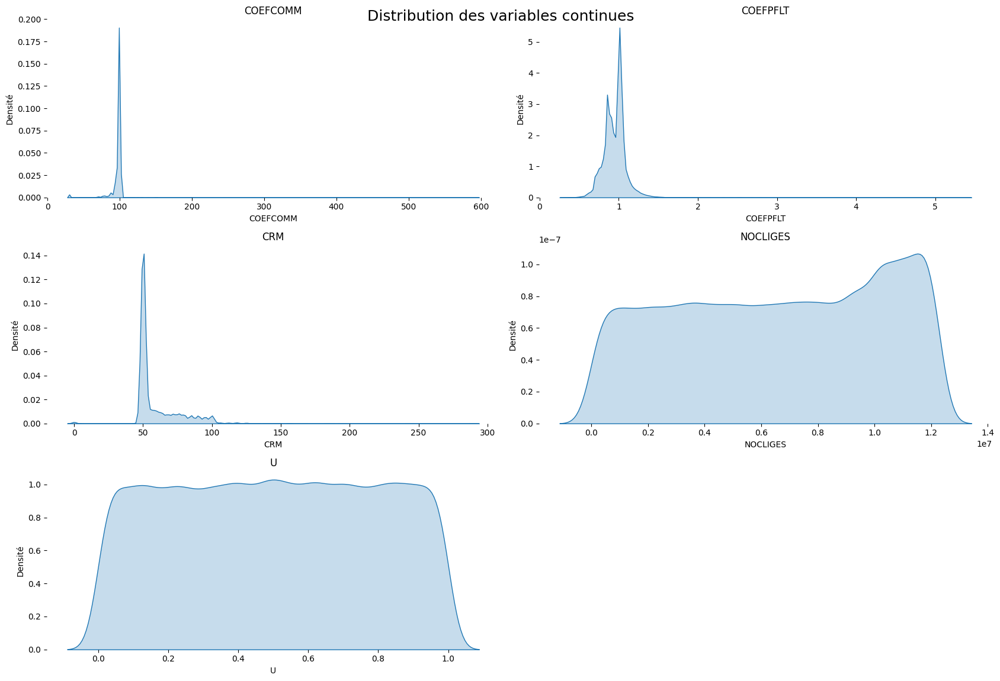

In [430]:
ncols = 2
nrows = len(num_col) // ncols + (len(num_col) % ncols > 0)

plt.figure(figsize=(17, 4 * nrows))
plt.subplots_adjust(hspace=1)
plt.suptitle("Distribution des variables continues", fontsize=18, y=0.95)

for n, variable in enumerate(num_col):
    ax = plt.subplot(nrows, ncols, n + 1)
    sns.kdeplot(ax=ax, data=df1[variable].dropna(), shade=True)
    ax.set_title(variable, loc='center', fontsize=12)
    ax.set_ylabel("Densité")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()

`U` : aucune hypothèse formulée sur cette variable pour l’instant.

`NOCLIGES` : semble être un identifiant unique, donc peu pertinent pour l’analyse => à exclure.

`CRM` : correspond au coefficient bonus-malus
- (voir : https://aide.direct-assurance.fr/comment-calculer-le-bonus-malus-ou-coefficient-de-reduction-majoration).
- Un `CRM` < 100 indique un bonus et un `CRM` > 100 correspond à un malus.
- Ce coefficient dépend des antécédents du client, notamment en lien avec les sinistres.

`COEFFCOMM` = Coefficient commercial ?
- Il pourrait s'agir d'une note interne, établie selon un processus bien défini, basée sur des critères d’appétence client.
- Cette note pourrait être utilisée dans une stratégie de relance ou de démarchage des clients "potentiels",
- Voire pour estimer le risque ou la probabilité de résiliation.

`COEFFPLT` : il est difficile de formuler une hypothèse claire sur cette variable pour le moment. Elle semble être un coefficient (proche de `COEFFCOMM`), car ses valeurs sont centrées autour de 1 (celles de `COEFFCOMM` sont centrées autour de 100).

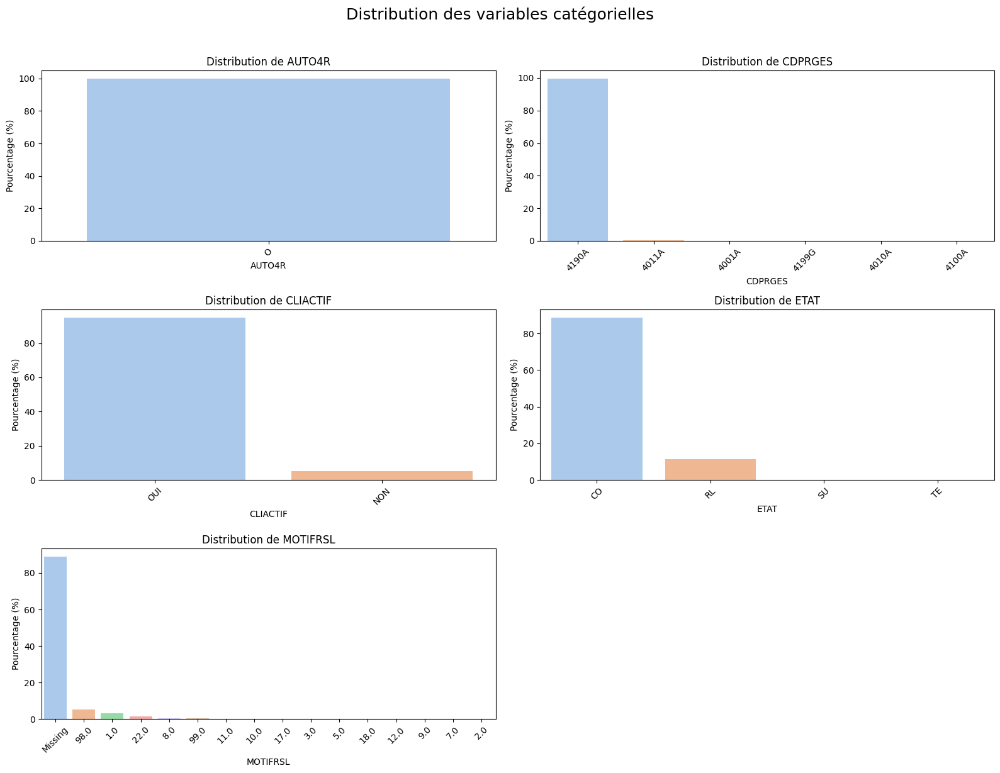

In [431]:
# les NaN => "Missing" pour chaque variable catégorielle
df_cat = df1[cat_col].fillna("Missing")

ncols = 2
nrows = len(cat_col) // ncols + (len(cat_col) % ncols > 0)

plt.figure(figsize=(16, 4 * nrows))
plt.subplots_adjust(hspace=0.6)
plt.suptitle("Distribution des variables catégorielles", fontsize=18, y=1.02)

for i, col in enumerate(cat_col):
    plt.subplot(nrows, ncols, i + 1)
    value_counts = df_cat[col].value_counts(normalize=True) * 100
    sns.barplot(x=value_counts.index, y=value_counts.values, palette="pastel")
    plt.title(f"Distribution de {col}")
    plt.xticks(rotation=45)
    plt.ylabel("Pourcentage (%)")
    plt.xlabel(col)

plt.tight_layout()
plt.show()

On pourrait a priori conserver les variables `CLIACTIF` et `ETAT` (à valider avec les équipes métier quant au sens précis de chaque modalité):

- On peut supposer que `ETAT` correspond à l’état du contrat, avec par exemple la modalité "SU" signifiant "suspendu".
- Les autres modalités restent à éclaircir.
- Cette variable semble très proche de la cible (`CONTRAT`), ce qui rend pertinent de la supprimer.
- Après étude, les deux variables sont très similaires : la modalité "CO" (la plus fréquente) semble correspondre à "COURANT", et "RL" à "RÉSILIÉ". Or, avoir deux cibles dans le modèle fausserait les résultats. On préfère donc conserver uniquement la variable `CONTRAT`, qui présente clairement deux modalités.


---

La variable `CLIACTIF` semble indiquer le statut actif/inactif du client ("OUI" / "NON"), ce qui paraît pertinent à conserver. Toutefois, actif au sens de quoi ? Cela reste à définir plus précisément.

---

En revanche :

- `AUTO4R` ne contient qu’une seule modalité => peu informatif, à supprimer.
- `CDPRGES` présente 6 codes différents dont la signification est inconnue (à clarifier avec les équipes métier), mais une modalité représente plus de 99 % des occurrences => peu informatif, à supprimer.
- `MOTIFRSL` contient environ 90 % de valeurs manquantes => variable peu pertinente, à supprimer.  
  Une autre hypothèse serait que la majorité des clients ne résilient pas. Pour cette population, on ne dispose donc pas d’information. En revanche, ceux qui résilient ont un motif spécifique, ce qui expliquerait le déséquilibre.  
  Toutefois, nous n’avons toujours pas d’information sur la nature exacte des résiliations (motifs 98, 1, 22, etc.).  

De toute façon, `MOTIFRSL` n’est connu qu’après la résiliation.

---


### Conclusion
---

Nous pourrions conserver les variables suivantes dans le processus de modélisation :

- `CRM`
- `COEFFCOMM`
- `COEFFPLT`
- `CLIACTIF`

# Analyse descriptive univariée & bivariée
---

In [432]:
df.describe()

,CDUSGAUT,IDECON,DTDBUCON,DTEFTMVT,MMJECHPP,MTPAATTC,NOCLIGES,NUMFOY,DTOBTPDC,DTPMRMCI,...,RESAU4R,RESMH,RESSA,RESIV,RESDI,U,MOTIFRSL,COEFCOMM,COEFPFLT,CRM
count,90231.00,90247.00,90247.00,90247.00,90231.00,90247.00,90247.00,90247.00,90054.00,89315.00,...,26506.00,26506.00,26506.00,26506.00,26506.00,90247.00,10033.00,90247.00,90247.00,90247.00
mean,612.26,452682717.12,11978.75,14730.44,618.09,3076.07,6575295.32,6443720.10,6205.40,11428.44,...,0.90,0.27,0.06,0.00,0.16,0.50,52.97,97.56,0.95,59.10
std,13.03,287439688.66,2622.81,188.38,349.45,1959.32,3649342.94,3630561.57,5070.30,2153.89,...,0.71,0.52,0.28,0.04,0.46,0.29,45.63,8.36,0.14,16.16
min,1.00,35070.00,-21549.00,8948.00,101.00,0.00,249.00,249.00,-14244.00,-21549.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,30.00,0.29,0.00
25%,609.00,202697617.00,10750.00,14693.00,315.00,1774.19,3413987.50,3302973.00,2518.00,10227.00,...,0.00,0.00,0.00,0.00,0.00,0.25,1.00,96.00,0.85,50.00
50%,611.00,406082694.00,12626.00,14765.00,613.00,2646.18,6743863.00,6546811.00,6552.50,11535.00,...,1.00,0.00,0.00,0.00,0.00,0.50,98.00,100.00,0.96,50.00
75%,613.00,702846902.00,13970.00,14807.00,912.00,3850.24,9968580.00,9686872.00,10246.00,13027.00,...,1.00,0.00,0.00,0.00,0.00,0.75,98.00,100.00,1.02,64.00
max,670.00,906147729.00,14883.00,14944.00,1231.00,62556.82,12304713.00,12304713.00,14879.00,14792.00,...,12.00,7.00,5.00,2.00,7.00,1.00,99.00,595.00,5.42,289.00


In [433]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90247 entries, 0 to 90246
Data columns (total 58 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NO_AFR    90247 non-null  object 
 1   CDUSGAUT  90231 non-null  float64
 2   IDECON    90247 non-null  int64  
 3   CD_AGT    90247 non-null  object 
 4   CD_FML    89702 non-null  object 
 5   CDPRGES   90247 non-null  object 
 6   DTDBUCON  90247 non-null  int64  
 7   DTEFTMVT  90247 non-null  int64  
 8   MMJECHPP  90231 non-null  float64
 9   MTPAATTC  90247 non-null  float64
 10  AUTO4R    90247 non-null  object 
 11  NOCLIGES  90247 non-null  int64  
 12  NUMFOY    90247 non-null  int64  
 13  CDMARVEH  90160 non-null  object 
 14  DTOBTPDC  90054 non-null  float64
 15  DTPMRMCI  89315 non-null  float64
 16  LBMDLVH   90137 non-null  object 
 17  NOTAREFF  89980 non-null  object 
 18  PUI_TRE   90081 non-null  object 
 19  RN_VL_VH  90077 non-null  float64
 20  S_2_N     9512 non-null   fl

In [434]:
# La variable à prédire :
Target = ["CONTRAT"]

counts = df.groupby(Target).size()
print(counts)

CONTRAT
ACTIF    80117
RESIL    10130
dtype: int64


## Séparation des variables selon leur type (quantitatives / qualitatives)
---

In [435]:
# Var. numériques
numeric_cols = [
    'DTDBUCON', 'DTEFTMVT', 'MMJECHPP', 'MTPAATTC', 'DTOBTPDC', 'DTPMRMCI',
    'S_0_O', 'S_1_O', 'S_2_O', 'S_3_O', 'S_0_N', 'S_1_N', 'S_2_N', 'S_3_N',
    'NIVBM', 'MTPAAREF', 'ANCCLI', 'DT_NAI', 'DI', 'IV', 'MH', 'SA',
    'NBCTACT', 'RESAU4R', 'RESDI', 'RESIV', 'RESMH', 'RESSA', 'NBCTRES',
    'COEFCOMM', 'COEFPFLT', 'CRM']

# Var. catégorielles
categorical_cols = [
    'CD_AGT', 'CD_FML', 'CDPRGES', 'AUTO4R', 'CDMARVEH', 'LBMDLVH',
    'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDMCE', 'CD_SEX',
    'CDSITFAM', 'DEPT', 'REGION', 'CD_CSP', 'CLIACTIF']

# Var. identifiants
id_cols = ['NO_AFR', 'IDECON', 'NOCLIGES', 'NUMFOY'] # On ne gardera que NO_AFR

# Var. cible
Target = ['CONTRAT']

print("Nombre de variables numériques :", len(numeric_cols))
print("Nombre de variables catégorielles :", len(categorical_cols))
print("Nombre d'identifiants :", len(id_cols))
print("Nombre de cibles :", len(Target))

df_filtre = df[id_cols + numeric_cols + categorical_cols + Target]

Nombre de variables numériques : 32
Nombre de variables catégorielles : 17
Nombre d'identifiants : 4
Nombre de cibles : 1


Les variables que l'on considère comme des identifiants uniques, telles que `IDECON`, `NOCLIGES`, `NUMFOY`, `U`, ainsi que celles liées à la cible (`ETAT`, `MOTIFRSL`), sont supprimées.

---

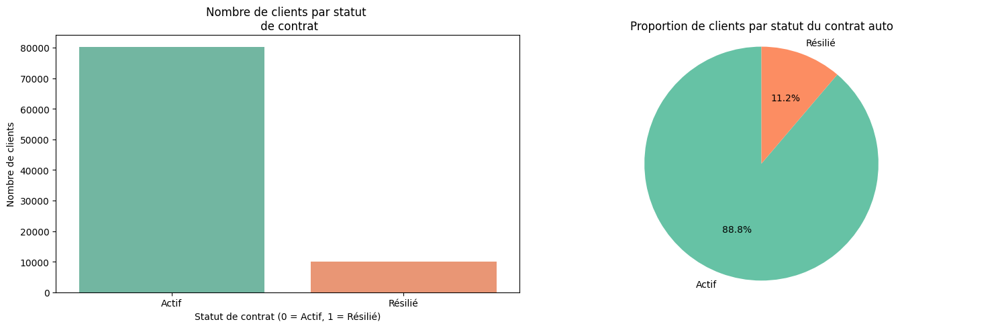

In [436]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Diagramme à barres
sns.barplot(x=counts.index, y=counts.values, palette='Set2', ax=axes[0])
axes[0].set_title("Nombre de clients par statut \n de contrat")
axes[0].set_xlabel("Statut de contrat (0 = Actif, 1 = Résilié)")
axes[0].set_ylabel("Nombre de clients")
axes[0].set_xticks([0, 1])
axes[0].set_xticklabels(['Actif', 'Résilié'])

# Diagramme en secteurs (camembert)
axes[1].pie(counts.values, labels=['Actif', 'Résilié'], autopct='%1.1f%%', startangle=90,
            colors=['#66c2a5', '#fc8d62'])
axes[1].set_title("Proportion de clients par statut du contrat auto")
axes[1].axis('equal')

plt.tight_layout()
plt.show()

On remarque que les classes sont déséquilibrées, il y a beaucoup plus d'individus dans la classe 0 que dans la classe 1 (le ratio 90-10).

---

In [437]:
df_filtre.head()

,NO_AFR,IDECON,NOCLIGES,NUMFOY,DTDBUCON,DTEFTMVT,MMJECHPP,MTPAATTC,DTOBTPDC,DTPMRMCI,...,RN_VL_VH,CDUSGAUT,CDMCE,CD_SEX,CDSITFAM,DEPT,REGION,CD_CSP,CLIACTIF,CONTRAT
0,A00104001204707,205808992,11852135,11852135,14630,14812,121.00,1929.66,10273.00,10683.00,...,5.00,611.00,P,F,M,1.00,RA,NaN,OUI,ACTIF
1,A00104001270809,105939601,12024026,12024026,14701,14701,401.00,4106.44,12877.00,11262.00,...,10.00,636.00,P,M,M,1.00,RA,NaN,OUI,ACTIF
2,A00104001397301,306115473,11154377,9064205,14848,14848,826.00,4821.80,14196.00,9678.00,...,4.00,611.00,P,M,M,1.00,RA,NaN,OUI,ACTIF
3,A00104001402563,206122172,10342979,10342979,14861,14861,908.00,9460.74,14629.00,11870.00,...,10.00,611.00,P,M,C,1.00,RA,NaN,OUI,ACTIF
4,A00104716130632,35070,8826057,8289285,4018,14707,407.00,1530.09,NaN,5935.00,...,15.00,603.00,P,M,M,1.00,RA,NaN,OUI,ACTIF


In [438]:
print("Le nombre de valeurs uniques par variable :\n", df_filtre.nunique())

Le nombre de valeurs uniques par variable :
 NO_AFR      90243
IDECON      90243
NOCLIGES    88018
NUMFOY      87025
DTDBUCON     8977
DTEFTMVT     1093
MMJECHPP      365
MTPAATTC    79717
DTOBTPDC    15770
DTPMRMCI      557
S_0_O           3
S_1_O           3
S_2_O           3
S_3_O           4
S_0_N           4
S_1_N           5
S_2_N           4
S_3_N           5
NIVBM          94
MTPAAREF    14957
ANCCLI       9760
DT_NAI      22300
DI             14
IV             24
MH             18
SA              8
NBCTACT        35
RESAU4R        12
RESDI           8
RESIV           3
RESMH           8
RESSA           6
NBCTRES        16
COEFCOMM       99
COEFPFLT     7692
CRM            94
CD_AGT       1255
CD_FML         25
CDPRGES         6
AUTO4R          1
CDMARVEH      256
LBMDLVH      6806
NOTAREFF       17
PUI_TRE        14
RN_VL_VH       18
CDUSGAUT       71
CDMCE           2
CD_SEX          2
CDSITFAM        7
DEPT          196
REGION         11
CD_CSP        234
CLIACTIF        2
C

In [439]:
print(df_filtre[numeric_cols].dtypes)
print(df_filtre[categorical_cols].dtypes)

DTDBUCON      int64
DTEFTMVT      int64
MMJECHPP    float64
MTPAATTC    float64
DTOBTPDC    float64
DTPMRMCI    float64
S_0_O       float64
S_1_O       float64
S_2_O       float64
S_3_O       float64
S_0_N       float64
S_1_N       float64
S_2_N       float64
S_3_N       float64
NIVBM         int64
MTPAAREF    float64
ANCCLI      float64
DT_NAI      float64
DI          float64
IV          float64
MH          float64
SA          float64
NBCTACT     float64
RESAU4R     float64
RESDI       float64
RESIV       float64
RESMH       float64
RESSA       float64
NBCTRES       int64
COEFCOMM      int64
COEFPFLT    float64
CRM           int64
dtype: object
CD_AGT       object
CD_FML       object
CDPRGES      object
AUTO4R       object
CDMARVEH     object
LBMDLVH      object
NOTAREFF     object
PUI_TRE      object
RN_VL_VH    float64
CDUSGAUT    float64
CDMCE        object
CD_SEX       object
CDSITFAM     object
DEPT         object
REGION       object
CD_CSP      float64
CLIACTIF     object
dtype:

## Quantitatives :
---

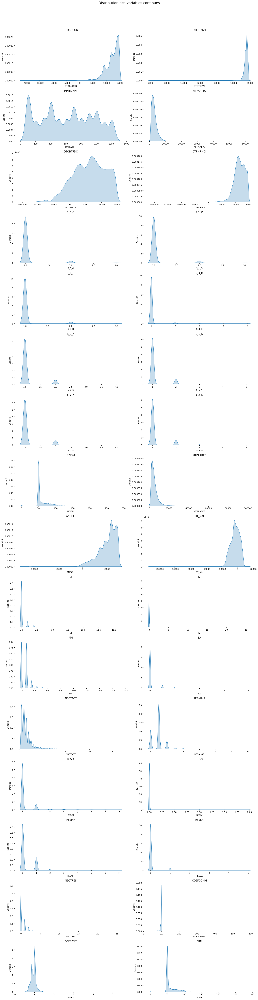

In [440]:
ncols = 2
nrows = len(numeric_cols) // ncols + (len(numeric_cols) % ncols > 0)

plt.figure(figsize=(17, 4 * nrows))
plt.subplots_adjust(hspace=1)
plt.suptitle("Distribution des variables continues", fontsize=16, y=1.02)

for n, variable in enumerate(numeric_cols):
    ax = plt.subplot(nrows, ncols, n + 1)
    sns.kdeplot(ax=ax, data=df_filtre[variable].dropna(), shade=True)
    ax.set_title(variable, loc='center', fontsize=12)
    ax.set_ylabel("Densité")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.tight_layout()
plt.show()

In [441]:
df_filtre[numeric_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90247 entries, 0 to 90246
Data columns (total 32 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DTDBUCON  90247 non-null  int64  
 1   DTEFTMVT  90247 non-null  int64  
 2   MMJECHPP  90231 non-null  float64
 3   MTPAATTC  90247 non-null  float64
 4   DTOBTPDC  90054 non-null  float64
 5   DTPMRMCI  89315 non-null  float64
 6   S_0_O     4435 non-null   float64
 7   S_1_O     4284 non-null   float64
 8   S_2_O     3572 non-null   float64
 9   S_3_O     2915 non-null   float64
 10  S_0_N     10551 non-null  float64
 11  S_1_N     10779 non-null  float64
 12  S_2_N     9512 non-null   float64
 13  S_3_N     8097 non-null   float64
 14  NIVBM     90247 non-null  int64  
 15  MTPAAREF  90247 non-null  float64
 16  ANCCLI    90230 non-null  float64
 17  DT_NAI    90042 non-null  float64
 18  DI        85675 non-null  float64
 19  IV        85675 non-null  float64
 20  MH        85675 non-null  fl

In [442]:
print(df_filtre[numeric_cols].dtypes)
df_filtre[numeric_cols].describe(percentiles = [0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]).T

DTDBUCON      int64
DTEFTMVT      int64
MMJECHPP    float64
MTPAATTC    float64
DTOBTPDC    float64
DTPMRMCI    float64
S_0_O       float64
S_1_O       float64
S_2_O       float64
S_3_O       float64
S_0_N       float64
S_1_N       float64
S_2_N       float64
S_3_N       float64
NIVBM         int64
MTPAAREF    float64
ANCCLI      float64
DT_NAI      float64
DI          float64
IV          float64
MH          float64
SA          float64
NBCTACT     float64
RESAU4R     float64
RESDI       float64
RESIV       float64
RESMH       float64
RESSA       float64
NBCTRES       int64
COEFCOMM      int64
COEFPFLT    float64
CRM           int64
dtype: object


,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
DTDBUCON,90247.00,11978.75,2622.81,-21549.00,2039.00,7365.00,10750.00,12626.00,13970.00,14704.00,14836.00,14883.00
DTEFTMVT,90247.00,14730.44,188.38,8948.00,14188.00,14524.00,14693.00,14765.00,14807.00,14868.00,14890.00,14944.00
MMJECHPP,90231.00,618.09,349.45,101.00,101.00,102.00,315.00,613.00,912.00,1207.00,1224.00,1231.00
MTPAATTC,90247.00,3076.07,1959.32,0.00,707.12,984.35,1774.19,2646.18,3850.24,6597.59,9896.60,62556.82
DTOBTPDC,90054.00,6205.40,5070.30,-14244.00,-5416.41,-2342.00,2518.00,6552.50,10246.00,13874.00,14614.00,14879.00
DTPMRMCI,89315.00,11428.44,2153.89,-21549.00,4869.00,8067.00,10227.00,11535.00,13027.00,14396.00,14701.00,14792.00
S_0_O,4435.00,1.05,0.22,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,3.00
S_1_O,4284.00,1.04,0.21,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,3.00
S_2_O,3572.00,1.04,0.19,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,3.00
S_3_O,2915.00,1.03,0.19,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,5.00


### Conclusion sur les variables quantitatives :
---

- `DTDBUCON` : correspond à la date de début du contrat (date de souscription par le client). Elle semble être encodée sous forme numérique (probablement en nombre de jours depuis une origine, par exemple le 01/01/1900). « Autre information disponible : la table date de février 2006, ce qui est à prendre en compte pour l’interprétation et la notion de "contrats récents".

---

- `DTEFTMVT` : représente la date du dernier mouvement sur le contrat (modification, mise à jour, avenant, etc.). Elle est également encodée sous forme numérique et centrée autour de 14730 ce qui indique des dates relativement récentes.

---

- `MMJECHPP` : indique la date d’échéance annuelle du contrat, exprimée au format Mois/Jour (ex : 101 = 1er janvier, 1231 = 31 décembre). Cette variable peut être utile pour étudier la saisonnalité des résiliations ou des renouvellements.

---

- `MTPAATTC` : désigne le montant total payé par le client pour son contrat d’assurance. C’est une variable continue, probablement exprimée en euros. Elle peut servir comme variable explicative selon les analyses.

---

- `DTOBTPDC` : correspond à la date d’obtention du permis de conduire du client. Elle est encodée en nombre de jours (comme `DTDBUCON`) mais certaines valeurs sont négatives ce qui nécessite un contrôle. Elle constitue un bon indicateur de l’expérience du conducteur.

---

- `DTPMRMCI` : indique la date de première mise en circulation du véhicule aussi encodée en format jour-numérique. La présence de valeurs négatives suggère qu’un nettoyage ou une conversion est nécessaire avant utilisation.

---

- Les variables liées aux sinistres (`S_0_O` à `S_3_O` pour les sinistres responsables et `S_0_N` à `S_3_N` pour les non responsables) indiquent le nombre de sinistres déclarés par le client au cours des quatre dernières années année par année. Ces variables bien que codées discrètement et faiblement dispersées autour d’une valeur dominante permettent d’identifier des clients ayant accumulé plusieurs sinistres ce qui peut refléter un comportement à risque. Leurs moyennes sont aux alentours de 1. Ces variables peuvent être pertinentes pour les analyses.

---

- `NIVBM` : niveau de bonus–malus codifié  
  La distribution est très asymétrique à droite avec un pic massif autour de 50–60. Cela suggère une échelle normalisée (`50` => bonus de référence `100` => malus). La fréquence très élevée d’une valeur centrale indique un possible effet plancher ou plafond. Les valeurs supérieures à `100` doivent être vérifiées (règles de l’assureur erreurs de saisie ou cas particuliers).

---

- `MTPAAREF` : montant de prime (ou de référence tarifaire)  
  Distribution très étalée avec une longue queue à droite. La majorité des montants se situe entre 1000 et 10000 mais certains dépassent 80k => probablement des outliers (erreurs multi-contrats risques élevés). À contrôler avant modélisation (winsorisation transformation log analyse par segment).

---

- `NBCTRES` : correspond au nombre de contrats résiliés (historique client ou foyer)  
  Fortement concentré sur 0 et 1. Les valeurs supérieures à 5 sont rares (au-delà de 10 ou 20) une revue qualité des données est recommandée. Cela confirme que la plupart des clients résilient peu. Peut être binarisé (`0` vs `>=1`) ou capé pour limiter l’influence des extrêmes.

---

- `ANCCLI` : ancienneté du client (en jours)  
  Présence de valeurs négatives (impossible en pratique) et cela signale un problème de calcul ou de référence temporelle. La majorité des valeurs se situe entre 5000 et 15000 jours (14 à 41 ans) ce qui est cohérent si la base couvre des relations de long terme. Hypothèse sur le nettoyage nécessaire => exclure les valeurs négatives vérifier la date de base éventuellement convertir en années.

---

- `DT_NAI` : date de naissance transformée (en jours relatifs à une date de référence non connue)  
  Centrée autour de 20k jours (soit 55 ans si la référence est 2006 => naissance dans les années 1960 à 1980). Les valeurs inférieures à -100k ou supérieures à 0 (naissance future) sont aberrantes. Reconvertir en âges et contrôler les bornes raisonnables (16 à 100 ans selon les règles métier).

---

- `DI` : nombre de contrats divers actifs détenus par le client  
  Moyenne de 0.27 médiane à 0 maximum à 16 distribution très concentrée sur 0  
  Variable discrète très asymétrique. Peut indiquer un faible engagement global quand la valeur est 0. Intéressant pour modéliser la fidélité.

---

- `IV` : nombre de contrats individuels-vie actifs  
  Moyenne très faible (0.065) médiane à 0 max à 26  
  Distribution ultra concentrée très peu de clients concernés  
  Faible pouvoir explicatif en l’état sauf si ré-agrégée (présence vs absence)

---

- `MH` : nombre de contrats multirisques habitation actifs  
  Moyenne à 0.69 médiane à 0 max à 19  
  La majorité des clients n’en a pas mais certains en ont plusieurs  
  Variable utile pour mesurer l’engagement dans d’autres produits

---

- `SA` : nombre de contrats santé actifs  
  Moyenne très faible (0.10) médiane à 0 max à 8  
  Comme pour `IV` distribution très concentrée sur 0  
  Peut être utilisée en binaire (0 vs >=1)

---

- `NBCTACT` : nombre total de contrats actifs (toutes branches)  
  Moyenne à 2.93 médiane à 2 max à 43  
  Variable bien étalée utile pour mesurer le degré d’engagement du client  
  Forte pertinence pour modéliser la fidélité

---

- `RESAU4R` : nombre de contrats auto résiliés  
  Moyenne élevée (0.90) sur une sous-population de 26506 clients  
  Distribution concentrée entre 0 et 2 max à 12  
  Indique un historique de rupture dans l’assurance auto => très pertinent

---

- `RESDI` : nombre de contrats divers résiliés  
  Moyenne faible (0.16) médiane à 0 max à 7  
  Variable complémentaire à `RESAU4R` permet d’identifier des profils instables sur plusieurs produits

---

- `RESIV` : nombre de contrats individu-vie résiliés  
  Moyenne quasi nulle (0.0017) médiane à 0 max à 2  
  Distribution trop rare peu exploitable sauf agrégation binaire

---

- `RESMH` : nombre de contrats multirisques habitation résiliés  
  Moyenne modérée (0.27) médiane à 0 max à 7  
  Intéressant combiné avec `MH` pour identifier la stabilité du client sur ce produit

---

- `RESSA` : nombre de contrats santé résiliés  
  Moyenne très faible (0.063) max à 5  
  Distribution rare mais peut être utile pour caractériser des foyers volatils

---

- `NBCTRES` : nombre total de contrats résiliés (toutes branches)  
  Moyenne à 0.47 médiane à 0 max à 26  
  Donnée bien étalée variable très discriminante pour modéliser le risque de résiliation  
  Peut être capée ou transformée en classe (0 / 1–3 / >3) selon la stratégie de modélisation

---

- `COEFCOMM` : coefficient de majoration appliqué (lié à la tarification ou au profil)  
  Moyenne à 97.56 médiane à 100 valeurs entre 30 et 595  
  Distribution très asymétrique avec un effet plafond à 100  
  Valeurs extrêmes (>200) à vérifier => peut refléter une tarification élevée

---

- `COEFPFLT` : coefficient de plafonnement ou d'ajustement tarifaire  
  Moyenne à 0.95 valeurs de 0.29 à 5.41 médiane proche de 0.96  
  Distribution assez resserrée autour de 1 mais présence d’outliers vers le haut  
  Peut refléter des ajustements spécifiques à des profils atypiques

---

- `CRM` : coefficient de réduction majoration (bonus–malus)  
  Moyenne à 59.1 médiane à 50 max à 289  
  Distribution très asymétrique => pic sur 50 puis longue traîne  
  Variable importante car directement liée à la sinistralité passée et au tarif

---

### Hypothèses sur le lien entre les variables numériques et la variable cible :

---

In [443]:
print(df_filtre[Target].dtypes)
print(df_filtre[Target].isna().sum())
df_filtre[Target].info()

CONTRAT    object
dtype: object
CONTRAT    0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90247 entries, 0 to 90246
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   CONTRAT  90247 non-null  object
dtypes: object(1)
memory usage: 705.2+ KB


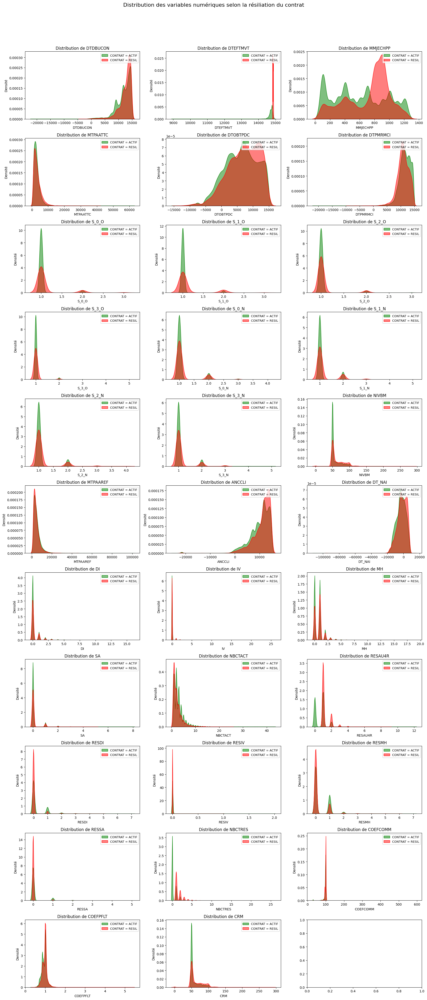

In [444]:
# Les variables numériques : numeric_cols
modalites = df_filtre['CONTRAT'].dropna().unique()

ncols = 3
nrows = len(numeric_cols) // ncols + (len(numeric_cols) % ncols > 0)

fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4 * nrows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    temp_df = df_filtre[[col, 'CONTRAT']].dropna()

    # La densité pour la 1ère modalité (=actif)
    sns.kdeplot(
        temp_df[temp_df['CONTRAT'] == modalites[0]][col],
        label=f'CONTRAT = {modalites[0]}',
        color='green',
        shade=True,
        alpha=0.5,
        ax=axes[i]
    )

    # La densité pour la 2e modalité (=résilié)
    if len(modalites) > 1:
        sns.kdeplot(
            temp_df[temp_df['CONTRAT'] == modalites[1]][col],
            label=f'CONTRAT = {modalites[1]}',
            color='red',
            shade=True,
            alpha=0.5,
            ax=axes[i]
        )

    axes[i].set_title(f'Distribution de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Densité')
    axes[i].legend(loc='upper right', fontsize=9)

plt.suptitle('Distribution des variables numériques selon la résiliation du contrat', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Hypothèses initiales :

---

- Les contrats récents ont un risque plus élevé de résiliation. Cela pourrait refléter une instabilité dans la phase initiale du contrat (variable `DTDBUCON` = "date de début du contrat") :
    - Les clients actifs (verts) ont tendance à avoir des contrats plus anciens (valeurs élevées dans la courbe).
    - Les résiliés (rouge) ont commencé leur contrat plus récemment.

---

- Cela suggère qu’un événement particulier (comme une modification, un sinistre, ...) peut précéder directement la résiliation (variable `DTEFTMVT` = "dernier mouvement sur le contrat") :
    - Les contrats résiliés ont "tous" eu un dernier mouvement très proche dans le temps, comme un pic soudain.
    - Les actifs montrent des mouvements plus étalés.

---

- Il y a peut-être des moments-clés dans l’année où beaucoup de clients choisissent de ne pas renouveler leur contrat (effet saisonnier ou politique de renouvellement ?) :
    - Variable `MMJECHPP` = "date d’échéance".
    - Les contrats résiliés ont des échéances très concentrées autour de certaines dates.
    - Les actifs sont répartis plus uniformément.

---

- Peut-être que les clients à prime faible sont plus sensibles aux prix et changent facilement d’assureur (variable `MTPAATTC` = "montant de la prime") ?
    - Les deux courbes sont proches, mais les contrats résiliés semblent un peu plus fréquents parmi les primes faibles.

---

- Les conducteurs expérimentés sont plus stables, donc moins enclins à résilier (variable `DTOBTPDC` = "date du permis") :
    - La distinction est subtile, mais les actifs ont souvent un permis plus ancien.

---

- Cela pourrait refléter que ceux qui changent de voiture (et donc de contrat) en profitent pour résilier ou comparer ailleurs (variable `DTPMRMCI` = "mise en circulation du véhicule") :
    - Les contrats résiliés sont légèrement associés à des véhicules plus récents.

---

Des graphiques de la distribution des sinistres non responsables (`S_i_N` pour `i = 0` à `3`) selon le statut du contrat (`ACTIF` vs `RESIL`), plusieurs constats se dégagent :

- Prédominance des contrats actifs : pour chaque période, la majorité des clients ayant eu un seul sinistre non responsable possèdent un contrat actif. Par exemple, sur `S_0_N = 1`, on compte 8 540 actifs contre 965 résiliés.
- Augmentation relative des résiliés avec la sinistralité : bien que les contrats résiliés restent numériquement inférieurs aux actifs sur toutes les modalités, le rapport résiliés/actifs croît clairement avec le nombre de sinistres. Ce phénomène est visible dans chaque période (`S_0_N` à `S_3_N`). Cela signifie que plus un client a eu de sinistres non responsables, plus la probabilité qu’il résilie augmente — une tendance qui peut révéler une corrélation entre sinistralité et résiliation, même si le client n’est pas fautif.
- Cohérence temporelle : le volume total diminue logiquement au fil des années (`S_0_N` à `S_3_N`), reflétant soit une mémoire limitée des sinistres, soit une diminution du nombre de clients observés dans le passé.

---

Pour les graphiques des sinistres responsables, nous pouvons relever :

- Une corrélation entre fréquence des sinistres et résiliations : sur les quatre périodes, on observe une augmentation régulière du ratio de contrats résiliés par rapport aux contrats actifs à mesure que le nombre de sinistres responsables croît. Par exemple, dans `S_0_O`, ce ratio passe d’environ 17 % pour les clients ayant 1 sinistre (613/3 628) à plus de 42 % pour ceux ayant 2 sinistres (55/130). Ce phénomène s’amplifie avec le temps.
- Un basculement notable sur la dernière période (`S_3_O`) : dans cette période, la majorité des sinistres responsables (notamment les sinistres isolés) est associée à des contrats résiliés (2 450 résiliés contre seulement 381 actifs). Ce basculement suggère un effet d’accumulation ou de seuil, où les récidives de sinistres responsables deviennent un facteur déterminant de résiliation.
- Pertinence prédictive élevée : le statut du contrat est clairement influencé par le nombre de sinistres responsables déclarés. Ce lien logique renforce la valeur prédictive de ces variables dans un modèle de scoring, notamment pour identifier les profils à risque de résiliation.

---

- Les clients avec un niveau de bonus-malus plus élevé semblent légèrement plus à risque de résiliation (variable `NIVBM`) :
    - Les deux courbes sont similaires, mais les résiliés présentent une densité un peu plus marquée dans les valeurs élevées de bonus-malus.
    - Cela peut traduire une sinistralité plus importante ou un comportement moins favorable à l’assureur.

---

- Les clients avec une prime annuelle faible sont légèrement surreprésentés parmi les contrats résiliés (variable `MTPAAREF`) :
    - Les résiliés affichent une plus grande densité dans les faibles montants de primes (< 5 000).
    - Cela pourrait refléter une sensibilité au prix ou une rentabilité perçue insuffisante pour l’assureur.

---

- Les clients ayant un historique de résiliations sont clairement plus à risque (variable `NBCTRES`) :
    - À mesure que le nombre de contrats résiliés augmente, la densité des résiliés devient plus forte.
    - C’est une variable très discriminante : les clients résiliés ont souvent déjà été résiliés ailleurs.

---

- L’ancienneté client semble jouer un rôle dans la stabilité (variable `ANCCLI`) :
    - Les clients actifs ont des anciennetés plus élevées (pic plus étalé vers la droite).
    - Les résiliés sont davantage concentrés sur des valeurs intermédiaires. Cela peut indiquer des ruptures précoces de la relation.

---

- L’âge du client, estimé à partir de la date de naissance (`DT_NAI`), ne semble pas être un facteur discriminant fort :
    - Les courbes sont très proches.
    - Toutefois, une légère densité accrue des résiliés parmi les plus jeunes pourrait mériter investigation.

---

`DI`, `IV`, `MH`, `SA`, `NBCTACT` (Variables liées au nombre de contrats actifs)

- Les résiliés sont plus nombreux à avoir 0 ou très peu de contrats actifs.
- Les clients peu engagés (`1` seul contrat, peu ou pas de `multirisques`, `vie` ou `santé`) sont plus à risque de résiliation.
- Par contre, ceux ayant plusieurs contrats (engagés dans plusieurs produits) semblent plus fidèles.

---

`RESAU4R`, `RESDI`, `RESIV`, `RESMH`, `RESSA`, `NBCTRES` (Historique de résiliation)

- Les résiliés ont beaucoup plus souvent eu des résiliations passées sur d’autres produits.
- Un client ayant déjà résilié un ou plusieurs contrats (`auto` ou autres) a nettement plus de risques de résilier à nouveau.
- Forte corrélation négative avec la fidélité.

---

`COEFFCOMM`, `COEFFPLFT`, `CRM` (Variables tarifaires ou de risque)

- `COEFFCOMM` : valeur plus élevée chez les résiliés => peut traduire une tarification défavorable ou une revalorisation mal perçue.
- `COEFFPLFT` : distribution légèrement décalée vers le haut chez les résiliés => plus pénalisés tarifairement.
- `CRM` : les résiliés ont un bonus/malus plus élevé => plus de sinistres ou conduite à risque passée.

- Ces variables traduisent un profil à risque ou une prime élevée, deux raisons possibles de résiliation.

## Qualitatives :
---

In [445]:
df_filtre[categorical_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90247 entries, 0 to 90246
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CD_AGT    90247 non-null  object 
 1   CD_FML    89702 non-null  object 
 2   CDPRGES   90247 non-null  object 
 3   AUTO4R    90247 non-null  object 
 4   CDMARVEH  90160 non-null  object 
 5   LBMDLVH   90137 non-null  object 
 6   NOTAREFF  89980 non-null  object 
 7   PUI_TRE   90081 non-null  object 
 8   RN_VL_VH  90077 non-null  float64
 9   CDUSGAUT  90231 non-null  float64
 10  CDMCE     90247 non-null  object 
 11  CD_SEX    90147 non-null  object 
 12  CDSITFAM  89887 non-null  object 
 13  DEPT      90048 non-null  object 
 14  REGION    90048 non-null  object 
 15  CD_CSP    50585 non-null  float64
 16  CLIACTIF  90247 non-null  object 
dtypes: float64(3), object(14)
memory usage: 11.7+ MB


In [446]:
df_filtre[categorical_cols] = df_filtre[categorical_cols].astype('object')
print(df_filtre[categorical_cols].dtypes)
df_filtre[categorical_cols].describe().T

CD_AGT      object
CD_FML      object
CDPRGES     object
AUTO4R      object
CDMARVEH    object
LBMDLVH     object
NOTAREFF    object
PUI_TRE     object
RN_VL_VH    object
CDUSGAUT    object
CDMCE       object
CD_SEX      object
CDSITFAM    object
DEPT        object
REGION      object
CD_CSP      object
CLIACTIF    object
dtype: object


,count,unique,top,freq
CD_AGT,90247,1255,A00676,524
CD_FML,89702,25,T,37944
CDPRGES,90247,6,4190A,89973
AUTO4R,90247,1,O,90247
CDMARVEH,90160,256,RENAULT,27666
LBMDLVH,90137,6806,205,4626
NOTAREFF,89980,17,BL050,38096
PUI_TRE,90081,14,D,16303
RN_VL_VH,90077.00,18.00,7.00,10499.00
CDUSGAUT,90231.00,71.00,611.00,38575.00


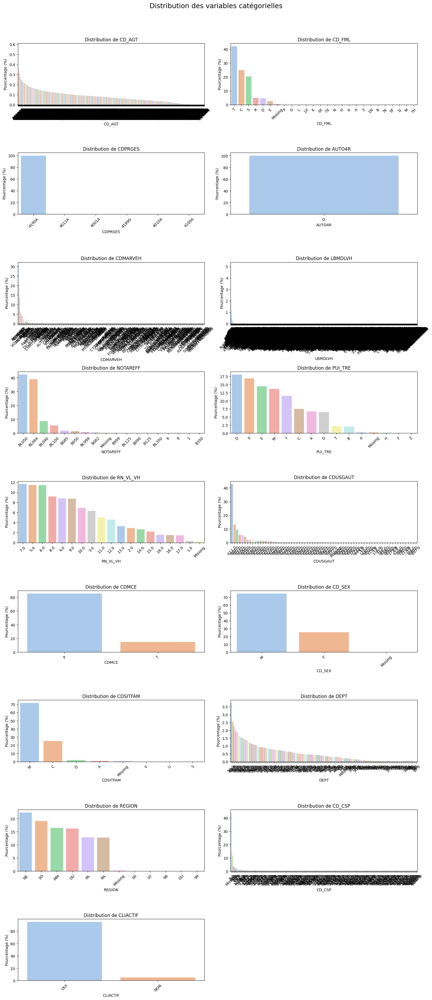

In [447]:
# les NaN => "Missing" pour chaque variable catégorielle
df_cat = df_filtre[categorical_cols].fillna("Missing")

ncols = 2
nrows = len(categorical_cols) // ncols + (len(categorical_cols) % ncols > 0)

plt.figure(figsize=(16, 4 * nrows))
plt.subplots_adjust(hspace=0.6)
plt.suptitle("Distribution des variables catégorielles", fontsize=18, y=1.02)

for i, col in enumerate(categorical_cols):
    plt.subplot(nrows, ncols, i + 1)
    value_counts = df_cat[col].value_counts(normalize=True) * 100
    sns.barplot(x=value_counts.index, y=value_counts.values, palette="pastel")
    plt.title(f"Distribution de {col}")
    plt.xticks(rotation=45)
    plt.ylabel("Pourcentage (%)")
    plt.xlabel(col)

plt.tight_layout()
plt.show()

### Conclusion de l'analyse univariée des variables catégorielles

- <span style="color:red">`AUTO4R`</span> sera supprimée, comme justifié précédemment.  
  - 1 seule valeur "O" => aucune variabilité, donc inutile.

---

- `CD_AGT` présente un grand nombre de modalités. Elle ne peut être utilisée en l'état. Il faudra regrouper les modalités (méthode du Chi-2, fusion de catégories) afin de former des groupes de risque exploitables. Cette variable ne présente pas de valeurs manquantes (NA).  
  - Agent ayant vendu le contrat (comportements commerciaux différents selon l'agent).  
  - 1255 agents, top = A00676 (524).

---

- `CD_FML` correspond au code formule du contrat auto (par exemple : tiers, tous risques, intermédiaire, etc.). Cette variable contient 25 modalités, avec la modalité `T` majoritaire (présente dans 37 944 cas sur 90 247). Elle contient très peu de NA. La discrétisation ou le regroupement de modalités pourrait être utile.  
  - 25 formules, top = T (38k).

---

- <span style="color:red">`CDPRGES`</span> est une variable dont la signification exacte n’est pas connue. Elle est bien renseignée, mais la modalité `4190A` couvre à elle seule 99 % des occurrences. Cette concentration la rend peu pertinente, donc elle sera supprimée.  
  - 6 modalités, top = "4190A" (89k fois).

---

- `CDMARVEH` représente la marque du véhicule. C’est une variable intéressante à exploiter. Elle contient 256 modalités. La discrétisation pourrait être pertinente. Elle contient très peu de NA.  
  - Type de constructeur (Renault, Peugeot, etc.).  
  - 256 marques, top = RENAULT (27,6k). Donc, probablement il s'agit d'une société d'assurance française.

---

- `LBMDLVH` semble représenter le modèle du véhicule (souvent dépendant de `CDMARVEH`). Elle présente un grand nombre de modalités. Très peu de NA.  
  - 6806 modalités, top = "205" (Renault 205 ? Peugeot ?).

---

- `NOTAREFF` correspond au numéro tarifaire, probablement lié au système de bonus-malus. Cette variable est directement utilisée pour la tarification. Elle peut être utile pour identifier des cas de sur-tarification. Très peu de NA.  
  - Tarification personnalisée du contrat.  
  - 17 valeurs, top = BL050 (38k).

---

- `PUI_TRE` correspond à la puissance fiscale du véhicule, une variable réglementaire importante en assurance auto. Elle est bien renseignée (très peu de NA).  
  - Indice fiscal de puissance (ex : chevaux fiscaux).  
  - 14 valeurs, top = D (16k).

---

- `RN_VL_VH` désigne le rang ou niveau de valeur du véhicule, souvent lié à sa cotation Argus. Elle est utile pour estimer le coût d’un sinistre. Très peu de NA.  
  - Rang dans la valeur estimée du véhicule.  
  - 18 niveaux, top = 7 (10k).

---

- `CDUSGAUT` est le code d’usage de la voiture (usage du véhicule : pro, perso, etc.).  
  - 71 codes, top = 611 (38k).

---

### Hypothèses sur le lien entre les variables catégorielles et la variable cible :

---

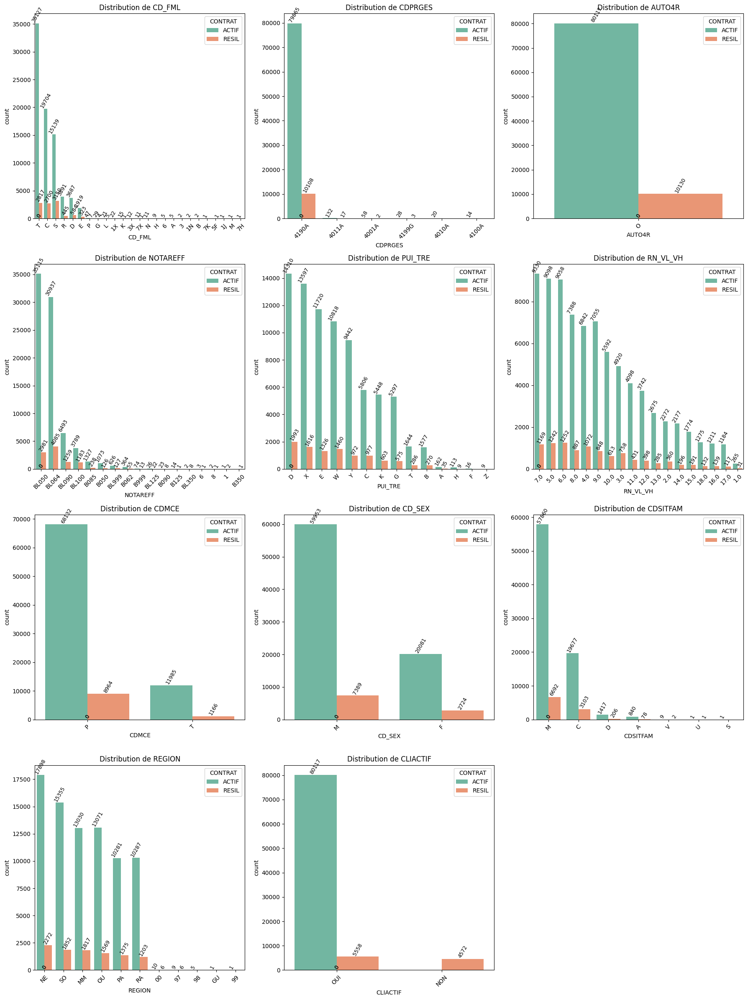

In [448]:
# Variables catégorielles à tracer
cat_var_to_plot = ['CD_FML', 'CDPRGES', 'AUTO4R', 'NOTAREFF', 'PUI_TRE',
                   'RN_VL_VH', 'CDMCE', 'CD_SEX', 'CDSITFAM', 'REGION', 'CLIACTIF']

# Grille 4x3 (12 cases)
fig, axes = plt.subplots(4, 3, figsize=(18, 24))
axes = axes.flatten()

# Boucle pour les 11 premières cases
for idx, var in enumerate(cat_var_to_plot):
    ax = axes[idx]
    order = df_filtre[var].value_counts().index
    plot = sns.countplot(data=df_filtre, x=var, hue="CONTRAT", ax=ax, order=order, palette="Set2")
    ax.set_title(f"Distribution de {var}")
    ax.tick_params(axis='x', rotation=45)

    # Ajouter les étiquettes sur les barres
    for p in plot.patches:
        height = int(p.get_height())
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=9, rotation = 60)

# Supprimer la 12e case vide
fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()

### Conclusion sur les variables catégorielles :
---

- `CD_FML` :  
  - La distribution est fortement concentrée autour de quelques valeurs dominantes, notamment `T`, `C` et `S`.  
  - Les résiliations sont présentes dans toutes les modalités, mais suivent la même répartition que les contrats actifs, ce qui pourrait réduire la capacité discriminante de cette variable.

---

- `CDPRGES` :  
  - Écrasante majorité sur une seule modalité (`4190A`) pour les deux types de contrats.  
  - La faible variabilité rend cette variable peu informative pour le scoring tel quel.

---

- `AUTO4R` :  
  - La variable est quasi constante : la majorité des clients ont un contrat auto 4R (`0`).  
  - Peu de pouvoir explicatif ici.

---

- `NOTAREFF` :  
  - On observe quelques modalités fréquentes (comme `BL050`, `BL064`) avec une structure similaire entre résiliés et actifs.  
  - Toutefois, certaines modalités sont davantage associées aux contrats résiliés.

---

- `PUI_TRE` :  
  - Les contrats résiliés suivent une distribution relativement similaire, mais les écarts dans certaines classes pourraient justifier son usage dans un modèle.

---

- `RN_VL_VH` :  
  - La variable semble plus granulaire avec une distribution dégressive.  
  - Les résiliés semblent légèrement plus fréquents pour certaines valeurs élevées (>12), indiquant une possible corrélation avec le risque de résiliation.

---

- `CDMCE` :  
  - Deux grandes modalités clairement identifiables, avec une répartition plus équilibrée entre actifs et résiliés.  
  - Cela suggère que ce critère de segmentation client peut influencer la fidélité.

---

- `CD_SEX` :  
  - Les hommes sont largement majoritaires dans l’échantillon.  
  - Les proportions de résiliés sont comparables, ce qui limite le pouvoir discriminant de cette variable seule.

---

- `CDSITFAM` :  
  - La modalité `M` (probablement marié) domine largement.  
  - Les résiliations sont proportionnellement plus fréquentes dans certaines situations familiales (`C`, `D`), ce qui pourrait signaler des profils moins stables.

---

- `REGION` :  
  - Bonne variabilité géographique, avec des disparités notables (NE > SO > MM…).  
  - Certaines régions présentent des taux de résiliation plus élevés, ce qui peut révéler des comportements régionaux spécifiques à modéliser.

---

- `CLIACTIF` :  
  - Cette variable est hautement discriminante : tous les contrats actifs sont marqués `OUI`, et `NON` n’existe que chez les résiliés.  
  - Elle est donc fortement corrélée à la cible (risque de fuite), mais doit être utilisée avec précaution pour éviter les fuites de données (data leakage).

## Les interactions complexes : variables (numériques) et taux de résiliation

Au niveau des variables quantitatives (présentant une grande variabilité et un grand nombre de données) :

---

In [449]:
# Les NO_AFR dupliqués :
dup_count = df['NO_AFR'].duplicated().sum()
print(f"Nombre de NO_AFR dupliqués dans df : {dup_count}")

duplicates = df[df.duplicated('NO_AFR', keep=False)].sort_values('NO_AFR')
print(duplicates[['NO_AFR', 'CONTRAT']])
# Seulement 4 dupliqués

Nombre de NO_AFR dupliqués dans df : 4
                NO_AFR CONTRAT
1580   A00615941435091   RESIL
1581   A00615941435091   ACTIF
10184  A02788911227061   ACTIF
10185  A02788911227061   RESIL
53712  A15922951297439   ACTIF
53713  A15922951297439   RESIL
65514  A18533961347058   ACTIF
65515  A18533961347058   RESIL


In [450]:
# Les doublons sont supprimés (priorité à la résiliation) sur la base du code identifiant NO_AFR
df_filtre = df_filtre.drop_duplicates(subset='NO_AFR', keep='last')
print(df_filtre.shape)
df_filtre.columns

(90243, 54)


Index(['NO_AFR', 'IDECON', 'NOCLIGES', 'NUMFOY', 'DTDBUCON', 'DTEFTMVT',
       'MMJECHPP', 'MTPAATTC', 'DTOBTPDC', 'DTPMRMCI', 'S_0_O', 'S_1_O',
       'S_2_O', 'S_3_O', 'S_0_N', 'S_1_N', 'S_2_N', 'S_3_N', 'NIVBM',
       'MTPAAREF', 'ANCCLI', 'DT_NAI', 'DI', 'IV', 'MH', 'SA', 'NBCTACT',
       'RESAU4R', 'RESDI', 'RESIV', 'RESMH', 'RESSA', 'NBCTRES', 'COEFCOMM',
       'COEFPFLT', 'CRM', 'CD_AGT', 'CD_FML', 'CDPRGES', 'AUTO4R', 'CDMARVEH',
       'LBMDLVH', 'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDMCE',
       'CD_SEX', 'CDSITFAM', 'DEPT', 'REGION', 'CD_CSP', 'CLIACTIF',
       'CONTRAT'],
      dtype='object')

### Analyse du lien entre variables quantitatives explicatives et résiliation (`CONTRAT = RESIL`)

---

Cette analyse repose sur des graphiques représentant le taux de résiliation par quantiles (8, dans notre cas) pour plusieurs variables explicatives. L’objectif est d’interpréter le comportement de la variable cible (`CONTRAT`) en fonction de ces variables.

---

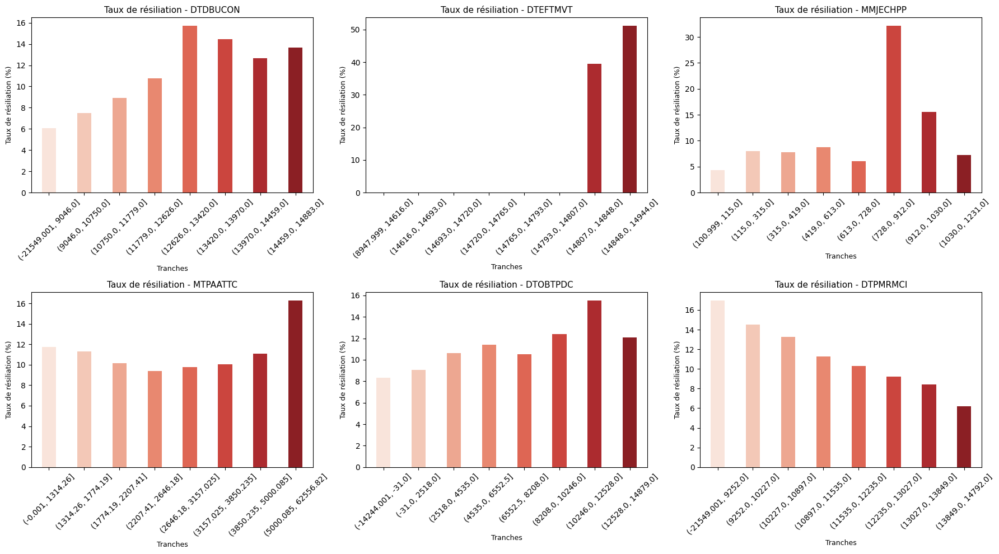

In [451]:
# La variable binaire de résiliation (0 ou 1)
df_filtre['RESIL'] = (df_filtre['CONTRAT'] == 'RESIL').astype(int)
num_col_1 = ['DTDBUCON', 'DTEFTMVT', 'MMJECHPP', 'MTPAATTC', 'DTOBTPDC', 'DTPMRMCI']

for i in range(0, len(num_col_1), 6):
    subset = num_col_1[i:i+6]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for j, col in enumerate(subset): # 8 bins
        df_filtre[f'{col}_BIN'] = pd.qcut(df_filtre[col], q=8, duplicates='drop')

        # On trace le graphique en calculant le taux de résiliation pour chaque variable :
        resil_rate = df_filtre.groupby(f'{col}_BIN')['RESIL'].mean() * 100

        sns.barplot(x=resil_rate.index.astype(str), y=resil_rate.values,
                    palette='Reds', ax=axes[j], width=0.4)

        axes[j].set_title(f'Taux de résiliation - {col}', fontsize=11)
        axes[j].set_xlabel('Tranches', fontsize=9)
        axes[j].set_ylabel('Taux de résiliation (%)', fontsize=9)
        axes[j].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Maintenant que nous avons analysé les distributions des variables, passons à la seconde phase : les croiser avec les taux de résiliation observés. Cela permettra de tester et d'affiner les hypothèses précédentes en tenant compte d'interactions plus complexes entre les variables.

---

`DTDBUCON` – Date de début du contrat
- Le taux de résiliation augmente nettement avec la date (contrats plus récents).
- Les contrats récents sont plus susceptibles d’être résiliés, peut-être par effet d’essai ou insatisfaction initiale.

---
`DTEFTMVT` – Date du dernier mouvement sur le contrat
- Très faible résiliation pour les dates anciennes, puis pic brutal de (environ 50%) dans le dernier bin.
- Une activité récente sur le contrat est fortement corrélée à une résiliation plus ou moins rapide.

---
`DTOBTPDC` – Date d'obtention du permis de conduire
- Le taux de résiliation augmente avec la récence du permis.
- Les jeunes conducteurs sont plus volatils, probablement plus sensibles aux prix ou aux offres concurrentes.

---
`DTPMRMCI` – Date de mise en circulation du véhicule
- Résiliation diminue avec la récence du véhicule.
- Les véhicules anciens sont plus associés à la résiliation. Peut-être en lien avec des primes plus élevées, ou des véhicules arrivant en fin de vie.

---
`MMJECHPP` – Date d’échéance du contrat (MMJJ)
- Pic net de résiliation dans un seul bin (entre 728 et 912).
- L’échéance du contrat dans certains mois (peut-être été) semble corrélée à une forte résiliation.

---
`MTPAATTC` – Montant annuel de la prime
- Courbe en U inversé => taux de résiliation stable, puis hausse nette dans le dernier bin.
- Les clients ayant une prime élevée sont plus enclins à résilier.

---

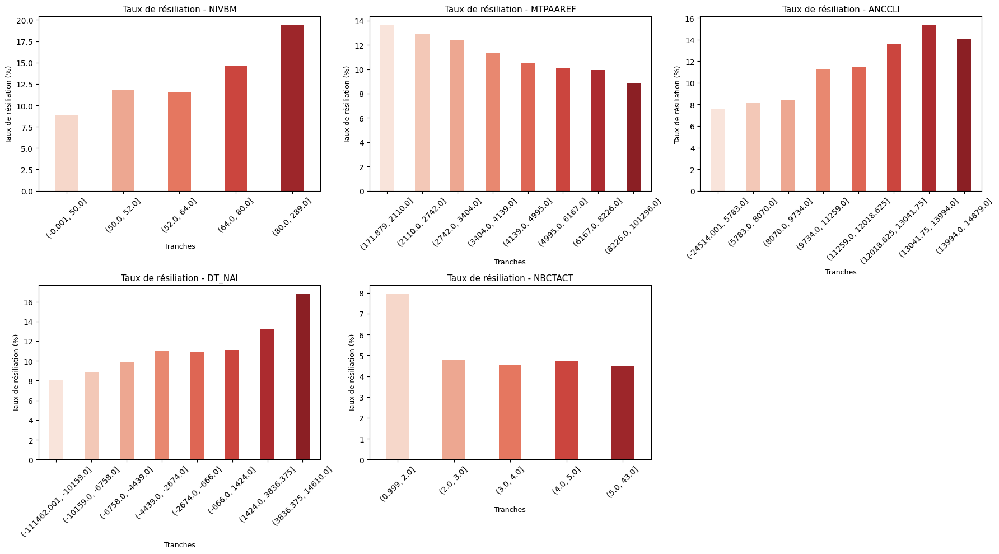

In [452]:
num_col_2 = ['NIVBM', 'MTPAAREF', 'ANCCLI', 'DT_NAI', 'NBCTACT']

for i in range(0, len(num_col_2), 6):
    subset = num_col_2[i:i+6]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for j, col in enumerate(subset):
        df_filtre[f'{col}_BIN'] = pd.qcut(df_filtre[col], q=8, duplicates='drop')

        resil_rate = df_filtre.groupby(f'{col}_BIN')['RESIL'].mean() * 100

        sns.barplot(x=resil_rate.index.astype(str), y=resil_rate.values,
                    palette='Reds', ax=axes[j], width=0.4)

        axes[j].set_title(f'Taux de résiliation - {col}', fontsize=11)
        axes[j].set_xlabel('Tranches', fontsize=9)
        axes[j].set_ylabel('Taux de résiliation (%)', fontsize=9)
        axes[j].tick_params(axis='x', rotation=45)

    for k in range(len(subset), len(axes)):
        fig.delaxes(axes[k])

    plt.tight_layout()
    plt.show()

`NIVBM` – Niveau de bonus-malus  
- Le taux de résiliation augmente avec le niveau de malus.  
- Les clients ayant un bonus élevé (`<50`) résilient moins, tandis que ceux avec un malus (`>80`) présentent un taux de résiliation nettement plus élevé (près de 20%).  
- Cela confirme le lien entre comportement routier (ou tarification) et probabilité de résiliation.

---

`MTPAAREF` – Montant de prime annuelle de référence  
- Tendance décroissante : les clients avec une prime faible (moins de 2000 euros) résilient davantage.   
- Cela indique une certaine sensibilité au prix chez les assurés.

---

`ANCCLI` – Ancienneté du client  
- Corrélation positive : plus l’ancienneté augmente, plus le taux de résiliation est élevé, jusqu’à un certain palier.  
- Une hypothèse est que les clients "moyennement anciens" sont les plus stables vs les très anciens.

---

`DT_NAI` – Date de naissance (en jours)  
- La résiliation augmente avec les dates les plus récentes (clients plus jeunes).  
- Les clients les plus âgés résilient moins. Cela rejoint l’idée que les profils jeunes sont plus mobiles, plus sensibles au prix, ou plus enclins à changer d’assureur.
- Variable utile à conserver en tant qu’âge.

---

`NBCTACT` – Nombre de contrats actifs
- Taux de résiliation clairement décroissant avec le nombre de contrats détenus.  
- Les clients ayant peu de contrats (1 ou 2) sont les plus à risque.  
---

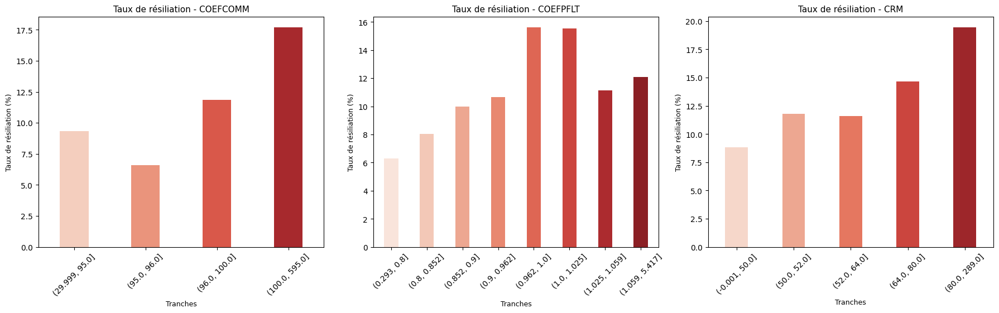

In [453]:
num_col_3 = ['COEFCOMM', 'COEFPFLT', 'CRM']

for i in range(0, len(num_col_3), 6):
    subset = num_col_3[i:i+6]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for j, col in enumerate(subset):
        df_filtre[f'{col}_BIN'] = pd.qcut(df_filtre[col], q=8, duplicates='drop')

        resil_rate = df_filtre.groupby(f'{col}_BIN')['RESIL'].mean() * 100

        sns.barplot(x=resil_rate.index.astype(str), y=resil_rate.values,
                    palette='Reds', ax=axes[j], width=0.4)

        axes[j].set_title(f'Taux de résiliation - {col}', fontsize=11)
        axes[j].set_xlabel('Tranches', fontsize=9)
        axes[j].set_ylabel('Taux de résiliation (%)', fontsize=9)
        axes[j].tick_params(axis='x', rotation=45)

    for k in range(len(subset), len(axes)):
        fig.delaxes(axes[k])

    plt.tight_layout()
    plt.show()

`COEFCOMM` – Coefficient de majoration (lié à la tarification ou au profil)  
- Forte augmentation du taux de résiliation pour les valeurs supérieures à 100.  
- Les clients ayant un coefficient entre 100 et 595 présentent un taux de résiliation nettement plus élevé (près de 18%).  

---

`COEFPFLT` – Coefficient de plafonnement tarifaire  
- Le taux de résiliation augmente de façon continue jusqu’à un pic dans la tranche [0.9, 0.962] et [1.0, 1.025].  
- Léger recul au-delà, puis une reprise modérée du taux dans la tranche extrême.  
- Montre que certains ajustements tarifaires sont mal perçus à partir d’un certain niveau, surtout autour de la borne de 1.  
- (À surveiller comme indicateur d'insatisfaction tarifaire).

---

`CRM` – Coefficient de réduction majoration (bonus-malus)  
- Hausse nette du taux de résiliation avec l’augmentation du malus.  
- Les clients avec un `CRM > 80` présentent un taux proche de 20%, contre moins de 10% pour les bonusés (<50).  
- Cela confirme que le malus est un facteur de résiliation, possiblement pour des raisons de coût ou d’image du client auprès de l’assureur.

---

# Création de nouvelles variables : indicateurs

---

## Au niveau des sinistres : indice de responsabilité

---

In [454]:
# Les variables sinistres :
sinistre_vars = [col for col in df_filtre.columns if col.startswith("S_")]

# Nous allons remplacer les valeurs manquantes par 0 (pas de sinistre) avec .loc[]
for var in sinistre_vars:
    df_filtre.loc[df_filtre[var].isna(), var] = 0

In [455]:
# On sépare les colonnes des sinistres responsables d’un côté et des non-responsables de l’autre :
cols_responsables = [col for col in df_filtre.columns if 'S_' in col and '_O' in col]
cols_non_responsables = [col for col in df_filtre.columns if 'S_' in col and '_N' in col]

df_filtre.loc[:, 'TOTAL_SIN_RESP'] = df_filtre[cols_responsables].sum(axis=1)
df_filtre.loc[:, 'TOTAL_SIN_N_RESP'] = df_filtre[cols_non_responsables].sum(axis=1)

# Création de l'indice :
df_filtre.loc[:, 'INDICE_RESPONSABILITE'] = df_filtre['TOTAL_SIN_RESP'] / (
    df_filtre['TOTAL_SIN_RESP'] + df_filtre['TOTAL_SIN_N_RESP'])

In [456]:
numeric_cols.append("INDICE_RESPONSABILITE")
numeric_cols.append("TOTAL_SIN_RESP")
numeric_cols.append("TOTAL_SIN_N_RESP")
vars_a_sup = sinistre_vars

## Au niveau de la prime : réelle vs référence

---

Les variables `MTPAATTC` (prime TTC payée) et `MTPAAREF` (prime de référence) sont très fortement corrélées. Plutôt que d’en conserver une, on crée un indicateur en calculant leur ratio (`MTPAATTC / MTPAAREF`). Ce ratio mesure l’écart au tarif de référence, interprétable comme un taux de remise.

---

In [457]:
# Un indicateur combinant `MTPAATTC` et `MTPAAREF` permet de mesurer à quel point on s’écarte du tarif de référence.
# Ces deux variables sont très corrélées, il faut en garder une seule.
# Il semble plus pertinent (hypothèse) de conserver le ratio `TTC / REF` (équivalent à un taux de remise ?).
df_filtre['TAUX_REMISE'] = df_filtre['MTPAATTC'] / df_filtre['MTPAAREF']

In [458]:
numeric_cols.append("TAUX_REMISE")
vars_a_sup.append('MTPAATTC')
vars_a_sup.append('MTPAAREF')

## Au niveau des contrats résiliés

---

Chaque type de contrat résilié n’a pas la même importance. Nous avons donc construit un score pondéré de résiliation (`SCORE_RESIL_PONDERE`) en attribuant des poids différents à chaque type :

---

- Contrats auto : 3.0 (plus risqués ou coûteux)
- ⁠Multirisque habitation : 2.5
- Individu-vie : 2.0
- Santé : 1.5
- Divers : 1.0
- Autres (non spécifiés) : 1.0

Ce score permet de mieux distinguer les profils clients selon le type de résiliations, et pas seulement leur nombre brut.

Ensuite, on calculera `TAUX_RESIL_PONDERE_TOTAL` : le taux pondéré de résiliation, divisé par le nombre total de contrats : `NBCTACT` et `NBCTRES`.

---

In [459]:
# variable RESAUTRES :
df_filtre['RESAUTRES'] = df_filtre['NBCTRES'] - df_filtre[['RESDI', 'RESIV', 'RESMH', 'RESSA', 'RESAU4R']].sum(axis=1)
df_filtre['RESAUTRES'] = df_filtre['RESAUTRES'].clip(lower=0)

# Définition des poids (à ajuster si nécessaire)
poids_resiliation = {
    'RESDI': 1.0,
    'RESIV': 2.0,
    'RESMH': 2.5,
    'RESSA': 1.5,
    'RESAU4R': 3.0,
    'RESAUTRES': 1.0}

# Gestion des NaN :
cols_resil = ['RESDI', 'RESIV', 'RESMH', 'RESSA', 'RESAU4R', 'RESAUTRES']
df_filtre[cols_resil] = df_filtre[cols_resil].fillna(0)

df_filtre['NBCTACT'] = df_filtre['NBCTACT'].fillna(2.0)  # médiane
df_filtre['NBCTRES'] = df_filtre['NBCTRES'].fillna(0)

# Indicateur pondéré de résiliation :
df_filtre['SCORE_RESIL_PONDERE'] = (
    df_filtre['RESDI']     * poids_resiliation['RESDI'] +
    df_filtre['RESIV']     * poids_resiliation['RESIV'] +
    df_filtre['RESMH']     * poids_resiliation['RESMH'] +
    df_filtre['RESSA']     * poids_resiliation['RESSA'] +
    df_filtre['RESAU4R']   * poids_resiliation['RESAU4R'] +
    df_filtre['RESAUTRES'] * poids_resiliation['RESAUTRES']
)

# Le taux pondéré de résiliation, divisé par le nombre total de contrats : NBCTACT et NBCTRES
df_filtre['TAUX_RESIL_PONDERE_TOTAL'] = df_filtre['SCORE_RESIL_PONDERE'] / (df_filtre['NBCTACT'] + df_filtre['NBCTRES'])

# (remplacer les divisions par zéro)
df_filtre['TAUX_RESIL_PONDERE_TOTAL'].replace([np.inf, -np.inf], np.nan, inplace=True)
df_filtre['TAUX_RESIL_PONDERE_TOTAL'].fillna(0, inplace=True)

In [460]:
df_filtre.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90243 entries, 0 to 90246
Data columns (total 76 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   NO_AFR                    90243 non-null  object  
 1   IDECON                    90243 non-null  int64   
 2   NOCLIGES                  90243 non-null  int64   
 3   NUMFOY                    90243 non-null  int64   
 4   DTDBUCON                  90243 non-null  int64   
 5   DTEFTMVT                  90243 non-null  int64   
 6   MMJECHPP                  90227 non-null  float64 
 7   MTPAATTC                  90243 non-null  float64 
 8   DTOBTPDC                  90050 non-null  float64 
 9   DTPMRMCI                  89312 non-null  float64 
 10  S_0_O                     90243 non-null  float64 
 11  S_1_O                     90243 non-null  float64 
 12  S_2_O                     90243 non-null  float64 
 13  S_3_O                     90243 non-null  float64 


In [461]:
numeric_cols.append('SCORE_RESIL_PONDERE')
numeric_cols.append('TAUX_RESIL_PONDERE_TOTAL')
vars_a_sup.append('RESDI')
vars_a_sup.append('RESIV')
vars_a_sup.append('RESMH')
vars_a_sup.append('RESSA')
vars_a_sup.append('RESAU4R')
vars_a_sup.append('RESAUTRES')
vars_a_sup.append('SCORE_RESIL_PONDERE')

# Lien des variables catégorielles avec la cible via un test du chi-2

---

## Définition des fonctions : algorithme chi2-merge, V de Cramer, stepwise, ...

---

**Discrétisation via un algorithme chi2-merge pour fusionner les catégories (modalités) proches en termes de distribution par rapport à la cible (résiliation). Deux modalités seront fusionnées si le test du chi-2 les juge "proches" :**

---

In [462]:
# @title
import pandas as pd
import numpy as np
from scipy import stats
from tqdm import tqdm
from typing import Tuple, Dict, Any
from scipy.stats import chi2_contingency, shapiro
import warnings

warnings.filterwarnings("ignore")

# Définition des séquences ANSI pour les couleurs et le gras
BOLD = "\033[1m"
RED_LIGHT = "\033[91m"
RED = "\033[91m"
GREEN = "\033[92m"
YELLOW = "\033[93m"
BLUE = "\033[94m"
MAGENTA = "\033[95m"
CYAN = "\033[96m"
WHITE = "\033[97m"
RESET = "\033[0m"  # Réinitialiser les styles

def v_cramer(df: pd.DataFrame, col1: str, col2: str):
    """
    Calcule le coefficient V de Cramér entre deux colonnes d'un DataFrame et fournit une évaluation qualitative
    de la force de leur association.

    Parameters:
    - df (pd.DataFrame): Le DataFrame contenant les données.
    - col1 (str): Le nom de la première colonne.
    - col2 (str): Le nom de la seconde colonne.

    Returns:
    - Cette fonction ne retourne rien, c'est un affichage.
    """
    df_pd = df[[col1, col2]].to_pandas()

    # Création du tableau de contingence
    tableau_contingence = pd.crosstab(df_pd[col1], df_pd[col2])

    # Calcul du test du chi-carré
    chi2, p, dof, expected = chi2_contingency(tableau_contingence)

    # Nombre total d'observations
    N = np.sum(tableau_contingence.values)

    # Nombre minimal de lignes ou de colonnes (moins 1 pour ajuster selon la formule du V de Cramér)
    k = min(tableau_contingence.shape) - 1

    # Calcul du V de Cramér
    V = round(np.sqrt(chi2 / (N * k)),2)

    print("Tableau de contingence :\n", tableau_contingence)
    print("\nChi 2 : " ,chi2)
    if V<0.05:
        print("\nV de Cramer :", BOLD+YELLOW+str(V))
        print(RESET+"Description: ", BOLD+YELLOW+"FAIBLE DISCRIMINATION")
    elif V>=0.05 and V<0.1:
        print("\nV de Cramer :", BOLD+GREEN+str(V))
        print(RESET+"Description: ", BOLD+GREEN+"DISCRIMINATION MOYENNE")
    elif V>=0.1 and V<0.15:
        print("\nV de Cramer :", BOLD+GREEN+str(V))
        print(RESET+"Description: ", BOLD+GREEN+"BONNE DISCRIMINATION")
    elif V>=0.15 and V<0.2:
        print("\nV de Cramer :", BOLD+GREEN+str(V))
        print(RESET+"Description: ", BOLD+GREEN+"TRES BONNE DISCRIMINATION")
    else:
        print("\nV de Cramer :", BOLD+GREEN+str(V))
        print(RESET+"Description: ", BOLD+GREEN+"EXCELLENTE DISCRIMINATION")

def vCramer(tableau_contingence: pd.DataFrame) -> float:
    """
    Calcule le coefficient V de Cramér pour une table de contingence donnée, qui est une mesure de
    l'association entre deux variables catégorielles. Il ajuste le Chi2 pour la taille de l'échantillon
    et le nombre de catégories dans les variables, fournissant une valeur entre 0 (aucune association)
    et 1 (association complète).

    Parameters:
    - contingency_table (pd.DataFrame): Une table de contingence des deux variables catégorielles.

    Returns:
    - float: Le coefficient V de Cramér arrondi à trois décimales.
    """
    chi2, p, dof, expected = chi2_contingency(tableau_contingence)
    # Nombre total d'observations
    N = np.sum(tableau_contingence.values)
    # Nombre minimal de lignes ou de colonnes (moins 1 pour ajuster selon la formule du V de Cramér)
    k = min(tableau_contingence.shape) - 1
    # Calcul du V de Cramér
    V = round(np.sqrt(chi2 / (N * k)),3)
    return V

def simulate_v_cramer(df: pd.DataFrame, explanatory_var: str, target_var: str, n_iterations: int = 150):
    """
    Simule le coefficient V de Cramér pour évaluer la force de l'association entre
    une variable explicative et une variable cible, en utilisant un échantillonnage
    pour gérer les déséquilibres des classes.

    Parameters:
    - df (pd.DataFrame): DataFrame contenant les données.
    - explanatory_var (str): Nom de la colonne de la variable explicative.
    - target_var (str): Nom de la colonne de la variable cible.
    - n_iterations (int): Nombre d'itérations pour la simulation.

    Returns:
    - Cette fonction ne retourne rien, c'est un affichage.
    """
    if not isinstance(df, pd.DataFrame):
        df = df[[explanatory_var, target_var]].to_pandas()
    else:
        df = df[[explanatory_var, target_var]]
    # Séparation des défaulter et non-défaulter
    defaulters = df[df[target_var] == 1]
    non_defaulters = df[df[target_var] == 0]

    v_cramer_values = []

    for _ in range(n_iterations):
        # Sélection aléatoire de non-défaulter pour égaler le nombre de défaulter
        sampled_non_defaulters = non_defaulters.sample(n=len(defaulters))

        # Concaténation des défaulter et des non-défaulter échantillonnés
        sampled_df = pd.concat([defaulters, sampled_non_defaulters])

        # Construction du tableau de contingence
        contingency_table = pd.crosstab(sampled_df[target_var], sampled_df[explanatory_var])

        # Calcul du V de Cramér
        v_cramer_value = vCramer(contingency_table)
        v_cramer_values.append(v_cramer_value)

    # Test de Shapiro-Wilk pour la normalité
    stat, p = stats.shapiro(v_cramer_values)
    print('Shapiro-Wilk Test pour liste de V de Cramer: Statistique=%.3f, p=%.3f' % (stat, p))

    # Calcul de la moyenne et de l'écart-type des valeurs de V de Cramér
    mean_v_cramer = round(np.mean(v_cramer_values), 2)
    std_v_cramer = round(np.std(v_cramer_values,ddof=1), 3)
    n = len(v_cramer_values)

    # Calcul de l'intervalle de confiance à 95%
    z = 1.96  # Score Z pour 95%
    margin_error = round(z * (std_v_cramer / np.sqrt(n)), 3)
    ci_lower = mean_v_cramer - margin_error
    ci_upper = mean_v_cramer + margin_error

    if mean_v_cramer<0.05:
        print("\nV de Cramer :", BOLD+YELLOW+str(mean_v_cramer)," (+/-",margin_error,")")
        print(RESET+"Description: ", BOLD+YELLOW+"FAIBLE DISCRIMINATION")
    elif mean_v_cramer>=0.05 and mean_v_cramer<0.1:
        print("\nV de Cramer :", BOLD+GREEN+str(mean_v_cramer)," (+/-",margin_error,")")
        print(RESET+"Description: ", BOLD+GREEN+"DISCRIMINATION MOYENNE")
    elif mean_v_cramer>=0.1 and mean_v_cramer<0.15:
        print("\nV de Cramer :", BOLD+GREEN+str(mean_v_cramer)," (+/-",margin_error,")")
        print(RESET+"Description: ", BOLD+GREEN+"BONNE DISCRIMINATION")
    elif mean_v_cramer>=0.15 and mean_v_cramer<0.2:
        print("\nV de Cramer :", BOLD+GREEN+str(mean_v_cramer)," (+/-",margin_error,")")
        print(RESET+"Description: ", BOLD+GREEN+"TRES BONNE DISCRIMINATION")
    else:
        print("\nV de Cramer :", BOLD+GREEN+str(mean_v_cramer)," (+/-",margin_error,")")
        print(RESET+"Description: ", BOLD+GREEN+"EXCELLENTE DISCRIMINATION")

def v_cramer_simulation(df: pd.DataFrame, explanatory_var: str, target_var: str, n_iterations: int = 150) -> tuple:
    """
    Simule le coefficient V de Cramér pour évaluer la force de l'association entre
    une variable explicative et une variable cible, en utilisant un échantillonnage
    pour gérer les déséquilibres des classes.

    Parameters:
    - df (pd.DataFrame): DataFrame contenant les données.
    - explanatory_var (str): Nom de la colonne de la variable explicative.
    - target_var (str): Nom de la colonne de la variable cible.
    - n_iterations (int): Nombre d'itérations pour la simulation.

    Returns:
    - tuple: Contient la moyenne des scores V de Cramér, la marge d'erreur, et une
      description qualitative de la force de l'association.
    """
    if not isinstance(df, pd.DataFrame):
        df = df[[explanatory_var, target_var]].to_pandas()
    else:
        df = df[[explanatory_var, target_var]]
    # Séparation des défaulter et non-défaulter
    defaulters = df[df[target_var] == 1]
    non_defaulters = df[df[target_var] == 0]

    v_cramer_values = []

    for _ in range(n_iterations):
        # Sélection aléatoire de non-défaulter pour égaler le nombre de défaulter
        sampled_non_defaulters = non_defaulters.sample(n=len(defaulters))

        # Concaténation des défaulter et des non-défaulter échantillonnés
        sampled_df = pd.concat([defaulters, sampled_non_defaulters])

        # Construction du tableau de contingence
        contingency_table = pd.crosstab(sampled_df[target_var], sampled_df[explanatory_var])

        # Calcul du V de Cramér
        v_cramer_value = vCramer(contingency_table)
        v_cramer_values.append(v_cramer_value)

    # Test de Shapiro-Wilk pour la normalité
    stat, p = stats.shapiro(v_cramer_values)
    #print('Shapiro-Wilk Test pour liste de V de Cramer: Statistique=%.3f, p=%.3f' % (stat, p))

    # Calcul de la moyenne et de l'écart-type des valeurs de V de Cramér
    mean_v_cramer = round(np.mean(v_cramer_values), 2)
    std_v_cramer = round(np.std(v_cramer_values,ddof=1), 3)
    n = len(v_cramer_values)

    # Calcul de l'intervalle de confiance à 95%
    z = 1.96  # Score Z pour 95%
    margin_error = round(z * (std_v_cramer / np.sqrt(n)), 3)
    ci_lower = mean_v_cramer - margin_error
    ci_upper = mean_v_cramer + margin_error

    # Évaluation qualitative
    if mean_v_cramer < 0.05:
        evaluation = "FAIBLE DISCRIMINATION"
    elif mean_v_cramer < 0.1:
        evaluation = "DISCRIMINATION MOYENNE"
    elif mean_v_cramer < 0.15:
        evaluation = "BONNE DISCRIMINATION"
    elif mean_v_cramer < 0.2:
        evaluation = "TRÈS BONNE DISCRIMINATION"
    else:
        evaluation = "EXCELLENTE DISCRIMINATION"

    return mean_v_cramer, margin_error, evaluation


def calculate_chi_square(cat1: str, cat2: str, data: pd.DataFrame, label: str, attr: str) -> float:
    """
    Calcul le Chi-carré entre deux catégories.

    Parameters:
    - cat1, cat2 (str): Les catégories à comparer.
    - data (pd.DataFrame): DataFrame contenant les données.
    - label (str): Nom de la colonne cible.
    - attr (str): Nom de la colonne attribut.

    Returns:
    - float: La valeur du Chi-carré.
    """
    data_in_range = data[data[attr].isin([cat1, cat2])]
    if data_in_range.empty:
        return float('inf')
    contingency_table = pd.crosstab(data_in_range[attr], data_in_range[label])
    if contingency_table.shape[0] < 2:
        return float('inf')
    chi2, _, _, _ = chi2_contingency(contingency_table, correction=False)
    return chi2

def chi_merge_ordinal(data: pd.DataFrame, attr: str, label: str) -> Tuple[Dict[int, pd.DataFrame], pd.DataFrame, int]:
    """
    Effectue le regroupement des catégories d'une variable ordinale basé sur le test Chi2
    pour minimiser les différences de distribution entre les catégories en relation avec une variable cible.

    Parameters:
    - data (pd.DataFrame): Le DataFrame contenant les données à analyser.
    - attr (str): Le nom de la colonne de la variable ordinale à regrouper.
    - label (str): Le nom de la colonne de la variable cible.

    Returns:
    - tuple: Contient trois éléments :
        - Un dictionnaire avec comme clés le nombre de catégories et comme valeurs les DataFrames de résultats pour chaque nombre de catégories.
        - Un DataFrame avec l'index comme le nombre de modalités et les colonnes pour les scores V de Cramer et leurs marges d'erreur.
        - Le nombre suggéré de modalités basé sur le score V de Cramer le plus élevé.

    Raises:
    - ValueError: Si 'data' n'est pas un pd.DataFrame ou si les colonnes spécifiées n'existent pas.
    """

    if not isinstance(data, pd.DataFrame):
        raise ValueError("data doit être un pd.DataFrame")
    if not attr in data.columns or not label in data.columns:
        raise ValueError(f"Les colonnes '{attr}' et/ou '{label}' n'existent pas dans 'data'.")

    try:
        # Marquer les valeurs NaN avant la conversion en chaînes
        data['is_nan'] = data[attr].isna()
        data[attr].fillna(-1, inplace=True)

        data[attr] = data[attr].astype('int').astype('str')

        # Gérer les valeurs manquantes
        data["attr_tmp"] = data.apply(lambda row: "Catégorie manquante" if row['is_nan'] else row[attr], axis=1)

        # Identifier les catégories sans défauts
        sum_defauts = data.groupby(attr)[label].sum()
        sans_defauts_categories = sum_defauts[sum_defauts == 0].index.tolist()
        data.loc[data[attr].isin(sans_defauts_categories), "attr_tmp"] = "Catégorie sans défauts"

        original_categories = data["attr_tmp"].unique()
        categories = sorted([int(cat) for cat in original_categories if cat not in ("Catégorie manquante", "Catégorie sans défauts")])
        categories = [str(cat) for cat in categories]
        shape_categories = {cat: data[data["attr_tmp"] == cat].shape[0] for cat in categories}
        filtered_values = {key: val for key, val in shape_categories.items() if key != categories[-1]}

        min_cat_size = 200

        while min(filtered_values.values()) < min_cat_size:
            i = 0
            while i < len(categories) - 1:
                if shape_categories[categories[i]] < min_cat_size:
                    new_cat_name = f'{categories[i]}_{categories[i+1]}'
                    data["attr_tmp"].replace([categories[i], categories[i+1]], new_cat_name, inplace=True)

                    # Mise à jour des catégories et de leurs populations
                    shape_categories[new_cat_name] = shape_categories.pop(categories[i]) + shape_categories.pop(categories[i+1])
                    categories[i] = new_cat_name  # Mise à jour de la liste des catégories
                    categories.pop(i+1)  # Suppression de la catégorie suivante qui a été fusionnée

                else:
                    i += 1  # Passer à la catégorie suivante si aucune fusion n'a été nécessaire

            # Mettre à jour le dictionnaire des populations après la fusion
            shape_categories = {cat: data[data["attr_tmp"] == cat].shape[0] for cat in categories}
            filtered_values = {key: val for key, val in shape_categories.items() if key != categories[-1]}

        # Il peut être nécessaire de gérer le cas où la dernière catégorie a une population < 100 et ne peut pas être fusionnée avec une suivante
        if shape_categories[categories[-1]] < min_cat_size and len(categories) > 1:
            new_cat_name = f'{categories[-2]}_{categories[-1]}'
            data["attr_tmp"].replace([categories[-2], categories[-1]], new_cat_name, inplace=True)
            shape_categories[new_cat_name] = shape_categories.pop(categories[-2]) + shape_categories.pop(categories[-1])
            categories[-2] = new_cat_name
            categories.pop(-1)

        initial_categories = {cat: [cat] for cat in categories}
        n = len(categories)
        dp = [float('inf') for _ in range(n-1)]

        # Initialisation de dp avec toutes les valeurs de Chi2, excluant "Catégorie manquante" et "Catégorie sans défauts"
        for i in range(n-1):
            dp[i] = calculate_chi_square(categories[i], categories[i+1], data, label, "attr_tmp")

        results_df = {len(categories): pd.DataFrame({"Chi2 catégorie": [None], "Catégories incluses": [None], "Pourcentage de l'effectif": [None], "Population": [None], "Taux de défaut par catégorie": [None]})}
        v_cramer = {len(categories): v_cramer_simulation(data[~data["attr_tmp"].isin(["Catégorie manquante", "Catégorie sans défauts"])], "attr_tmp", label)}

        with tqdm(total=len(categories) - 2) as pbar:
            while len(categories) > 2:
                # Trouver la paire minimale dans dp
                min_value = float('inf')
                min_indices = (None, None)
                for i in range(len(categories)-1):
                    if dp[i] < min_value:
                        min_value = dp[i]
                        min_indices = (i, i+1)

                # Fusionner les catégories minimales
                min_cats = [categories[min_indices[0]], categories[min_indices[1]]]
                new_cat = '_'.join(min_cats)
                categories[min_indices[0]] = new_cat
                del categories[min_indices[1]]

                if min_indices[1] == len(categories):
                    min_indices = (min_indices[0]-1, min_indices[0])

                data["attr_tmp"].replace(min_cats, new_cat, inplace=True)

                # Mise à jour de initial_categories pour la nouvelle catégorie
                included_cats = sum([initial_categories.pop(cat) for cat in min_cats], [])
                initial_categories[new_cat] = included_cats

                # Mettre à jour dp pour la nouvelle catégorie
                chi2_value = calculate_chi_square(categories[min_indices[0]], categories[min_indices[1]], data, label, "attr_tmp")
                # Supprimer les anciennes valeurs de dp pour les catégories fusionnées
                dp[min_indices[0]] = chi2_value
                del dp[min_indices[1]]


                # Ajouter les catégories spéciales à initial_categories à la fin, si elles existaient
                if 'Catégorie manquante' in original_categories:
                    initial_categories['Catégorie manquante'] = ['Catégorie manquante']
                if 'Catégorie sans défauts' in original_categories:
                    initial_categories['Catégorie sans défauts'] = sans_defauts_categories

                # Construction du DataFrame de résultats, incluant les catégories spéciales
                rows_list = []
                total_population = len(data)
                for category, included_categories in initial_categories.items():
                    category_population = data[data["attr_tmp"] == category].shape[0]
                    default_rate = data[data["attr_tmp"] == category][label].mean()
                    row = {
                        "Chi2 catégorie": category,
                        "Catégories incluses": ', '.join([c for cats in included_categories for c in cats.split('_')]),
                        "Pourcentage de l'effectif": round((category_population / total_population) * 100, 2),
                        "Population": category_population,
                        "Taux de résiliation par catégorie": round(100 * default_rate, 2)
                    }
                    rows_list.append(row)
                results = pd.DataFrame(rows_list)

                results_df[len(categories)] = results.sort_values(by=["Taux de résiliation par catégorie"])
                v_cramer[len(categories)] = v_cramer_simulation(data[~data["attr_tmp"].isin(["Catégorie manquante", "Catégorie sans défauts"])], "attr_tmp", label)
                pbar.update(1)

        data.drop(columns=["attr_tmp"], inplace=True)  # Nettoyer la colonne temporaire
        data.drop(columns=['is_nan'], inplace=True)  # Nettoyer la colonne is_nan

        v_cramer_df = pd.DataFrame({
            "Nb de modalités": v_cramer.keys(),
            "Score V de Cramer": [v[0] for v in v_cramer.values()],
            "Marge d'erreur": [v[1] for v in v_cramer.values()],
            "Description": [v[2] for v in v_cramer.values()]
        })

        sugg_nb_modalite = v_cramer_df.sort_values(by=['Score V de Cramer', 'Nb de modalités'], ascending=[False, True]).iloc[0,0]

        # Retourner les intervalles finaux
        return results_df, v_cramer_df.set_index("Nb de modalités"), sugg_nb_modalite
    except Exception as e:
        raise RuntimeError(f"Une erreur est survenue lors de l'exécution de chi_merge_ordinal: {e}")


def to_interval(v: str, limit_sup: float, pas: float, d: dict, max_abs: float, decimal: bool) -> str:
    """
    Convertit une valeur ou un groupe de valeurs en une représentation d'intervalle en fonction
    des paramètres donnés.

    Parameters:
    - v (str): La valeur ou le groupe de valeurs à convertir.
    - limit_sup (float): La limite supérieure pour les intervalles.
    - pas (float): Le pas à utiliser pour déterminer les intervalles.
    - d (dict): Un dictionnaire pour la conversion de catégories spécifiques.
    - max_abs (float): La valeur maximale absolue des données.

    Returns:
    - str: La représentation de l'intervalle pour la valeur donnée.
    """
    if v not in ('Catégorie manquante', 'Catégorie sans défauts'):
        values = [d[e] for e in v.split('_')]
        my_list = [int(e) for e in v.split('_')] + [int(item) for sublist in values for item in sublist]
        min_v = min(my_list)
        max_v = max(my_list)

        if min_v < limit_sup  and round(max_v+pas, 2) < limit_sup:
            if not decimal: return f'[{min_v}-{round(max_v + pas, 2)}['
            else: return f'[{round(min_v/100, 2)}-{round((max_v + pas)/100, 2)}['
        elif min_v < limit_sup  and round(max_v + pas, 2) == limit_sup and limit_sup == max_abs:
            if not decimal: return f'>={min_v}'
            else: return f'>={round(min_v/100, 2)}'
        elif min_v < limit_sup  and round(max_v + pas, 2) == limit_sup and limit_sup < max_abs:
            if not decimal: return f'[{min_v}-{round(max_v + pas, 2)}['
            else: return f'[{round(min_v/100, 2)}-{round((max_v + pas)/100, 2)}['
        elif max_v <= limit_sup and round(max_v+pas, 2) >= limit_sup:
            if not decimal: return f'>={min_v}'
            else: return f'>={round(min_v/100, 2)}'
        else:
            if not decimal: return f'>{limit_sup}'
    else:
        return v

def to_ordinal(v: float, limit_sup: float, pas: float) -> float:
    """
    Convertit une valeur numérique en sa représentation ordinale basée sur le pas et la limite supérieure.

    Parameters:
    - v (float): La valeur numérique à convertir.
    - limit_sup (float): La limite supérieure pour la conversion.
    - pas (float): Le pas à utiliser pour la conversion.

    Returns:
    - float: La valeur ordinale correspondante.
    """
    if v:
        if pas*(v//pas)+pas < limit_sup:
            return round(pas*(v//pas), 2)
        elif pas*(v//pas) < limit_sup and pas*(v//pas)+pas >= limit_sup:
            return round(pas*(v//pas), 2)
        else:
            return limit_sup
    else:
        return v

def null_replacement(v: str, d: dict) -> str:
    """
    Remplace une valeur par sa correspondance dans un dictionnaire si elle existe,
    sinon retourne la valeur sans changement.

    Parameters:
    - v (str): La valeur à vérifier et potentiellement à remplacer.
    - d (dict): Un dictionnaire contenant les correspondances de valeurs à remplacer.

    Returns:
    - str: La valeur remplacée si elle est trouvée dans le dictionnaire, sinon la valeur originale.
    """
    if v in d.keys():
        return d[v]
    return v

def chi_merge_numerical(data: pd.DataFrame, attr: str, label: str, pas: float, limit_sup: float = None) -> Tuple[Dict[int, pd.DataFrame], pd.DataFrame, int]:
    """
    Effectue un regroupement basé sur le Chi-carré pour des variables numériques en créant des intervalles
    avec un pas spécifié et en option une limite supérieure.

    Parameters:
    - data (pd.DataFrame): DataFrame contenant les données.
    - attr (str): Nom de la colonne numérique à regrouper.
    - label (str): Nom de la colonne cible.
    - pas (float): Le pas à utiliser pour la création des intervalles.
    - limit_sup (float, optional): La valeur maximale à considérer pour la création des intervalles.

    Returns:
    - tuple: Contient trois éléments :
        - Un dictionnaire avec comme clés le nombre de catégories et comme valeurs les DataFrames de résultats pour chaque nombre de catégories.
        - Un DataFrame avec l'index comme le nombre de modalités et les colonnes pour les scores V de Cramer et leurs marges d'erreur.
        - Le nombre suggéré de modalités basé sur le score V de Cramer le plus élevé.

    Raises:
    - ValueError: Si 'data' n'est pas un pd.DataFrame ou si les colonnes spécifiées n'existent pas.
    """

    if not isinstance(data, pd.DataFrame):
        raise ValueError("data doit être un pd.DataFrame")
    if attr not in data.columns or label not in data.columns:
        raise ValueError(f"Les colonnes '{attr}' et/ou '{label}' n'existent pas dans 'data'.")

    decimal = pas % 1 != 0

    try:
        data = data[[label, attr]].copy().astype('float')
        data['is_nan'] = data[attr].isna()
        data[attr].fillna(-999, inplace=True)

        if decimal:
            data[attr] = data[attr].apply(lambda v: v*100)
            pas *= 100
            if limit_sup:
                limit_sup *= 100

        data[attr] = data[attr].astype('int')

        # Créer des intervalles initiaux basés sur le "pas"
        min_val = data[attr].min()
        max_abs = data[attr].max()
        max_val = limit_sup if limit_sup is not None else data[attr].max()

        data[f'{attr}_ordinal'] = data[attr].apply(lambda v: to_ordinal(v, max_val, pas))
        data[f'{attr}_ordinal'] = data.apply(lambda row: np.nan if row['is_nan'] else row[f'{attr}_ordinal'], axis=1)
        data = data[[label, f'{attr}_ordinal']]

        data_null = data.groupby(f'{attr}_ordinal').sum()
        index_null  = data_null[data_null.CONTRAT_BIN == 0].index
        index_not_null = data_null[data_null.CONTRAT_BIN > 0].index
        dict_input = {}
        dict_output = {str(int(e)): [] for e in index_not_null}
        for e in index_null:
            i = np.sign(e)
            while e - i*pas in index_null:
                i = i + np.sign(e)
            while e - i*pas not in index_not_null:
                i = i + np.sign(e)
            dict_input[e] = e - i*pas
            #if decimal: dict_output[str(e - i*pas)].append(e)
            dict_output[str(int(e - i*pas))].append(int(e))

        data[f'{attr}_ordinal'] = data[f'{attr}_ordinal'].apply(lambda v: null_replacement(v, dict_input))

        results_df, v_cramer_df, sugg_nb_modalite = chi_merge_ordinal(data, f'{attr}_ordinal', label)
        for k in results_df.keys():
            if k != max(results_df.keys()):
                results_df[k] = results_df[k][["Chi2 catégorie", "Pourcentage de l'effectif", "Population", "Taux de résiliation par catégorie"]]
                results_df[k].columns = ["Chi2 intervalle", "Pourcentage de l'effectif", "Population", "Taux de résiliation par intervalle"]
                results_df[k]["Chi2 intervalle"] = results_df[k]["Chi2 intervalle"].apply(lambda v: to_interval(v, max_val, pas, dict_output, max_abs, decimal))

        return results_df , v_cramer_df, sugg_nb_modalite
    except Exception as e:
        raise RuntimeError(f"Une erreur est survenue lors de l'exécution de chi_merge_numerical: {e}")


def calculate_distributions(data: pd.DataFrame, attr: str, cats: list) -> pd.DataFrame:
    """
    Filtre les données pour inclure uniquement les observations appartenant à certaines catégories.

    Parameters:
    - data (pd.DataFrame): Le DataFrame contenant les données.
    - attr (str): Le nom de la colonne contenant les catégories.
    - cats (list): Une liste des catégories à inclure.

    Returns:
    - pd.DataFrame: Un sous-ensemble de 'data' incluant uniquement les observations dont les valeurs dans
      la colonne 'attr' appartiennent à la liste 'cats'.
    """
    return data[data[attr].isin(cats)]

def calculate_chi2_for_new_category(data: pd.DataFrame, attr: str, label: str, new_cat: str, categories: list) -> list:
    """
    Calcule les valeurs de Chi2 pour une nouvelle catégorie par rapport à chaque autre catégorie existante.

    Parameters:
    - data (pd.DataFrame): Le DataFrame contenant les données.
    - attr (str): Le nom de la colonne contenant les catégories.
    - label (str): Le nom de la colonne cible.
    - new_cat (str): La nouvelle catégorie à comparer.
    - categories (list): Une liste de toutes les catégories existantes.

    Returns:
    - list: Une liste contenant les valeurs de Chi2 pour chaque comparaison entre la nouvelle catégorie
      et les autres catégories. La valeur est 'inf' pour les comparaisons non valides ou avec elle-même.
    """
    chi2_values = []
    for cat in categories:
        if cat == new_cat:
            chi2_values.append(float('inf'))  # Comparaison de la catégorie avec elle-même
        else:
            grouped = calculate_distributions(data, attr, [new_cat, cat])
            contingency_table = pd.crosstab(grouped[attr], grouped[label])
            if contingency_table.empty or contingency_table.shape[1] < 2:
                chi2_values.append(float('inf'))  # Pas assez de données pour calculer le chi2
            else:
                chi2, _, _, _ = chi2_contingency(contingency_table, correction=False)
                chi2_values.append(chi2)
    return chi2_values

def chi_merge_categorical(data: pd.DataFrame, attr: str, label: str) -> Tuple[Dict[int, pd.DataFrame], pd.DataFrame, int]:
    """
    Effectue un regroupement des catégories pour une variable catégorielle basé sur les valeurs de Chi2,
    pour minimiser les différences de distribution en relation avec une variable cible.

    Parameters:
    - data (pd.DataFrame): Le DataFrame contenant les données.
    - attr (str): Le nom de la colonne de la variable catégorielle à regrouper.
    - label (str): Le nom de la colonne de la variable cible.

    Returns:
    - tuple: Contient trois éléments :
        - Un dictionnaire avec comme clés le nombre de catégories et comme valeurs les DataFrames de résultats pour chaque nombre de catégories.
        - Un DataFrame avec l'index comme le nombre de modalités et les colonnes pour les scores V de Cramer et leurs marges d'erreur.
        - Le nombre suggéré de modalités basé sur le score V de Cramer le plus élevé.

    Raises:
    - ValueError: Si 'data' n'est pas un pd.DataFrame ou si les colonnes spécifiées n'existent pas.
    """

    if not isinstance(data, pd.DataFrame):
        raise ValueError("data doit être un pd.DataFrame")
    if not attr in data.columns or not label in data.columns:
        raise ValueError(f"Les colonnes '{attr}' et/ou '{label}' n'existent pas dans 'data'.")

    # Marquer les valeurs NaN avant la conversion en chaînes
    data['is_nan'] = data[attr].isna()

    data[attr] = data[attr].astype('str')

    # Gérer les valeurs manquantes
    data["attr_tmp"] = data.apply(lambda row: "Catégorie manquante" if row['is_nan'] else row[attr], axis=1)

    # Identifier les catégories sans défauts
    sum_defauts = data.groupby(attr)[label].sum()
    sans_defauts_categories = sum_defauts[sum_defauts == 0].index.tolist()
    data.loc[data[attr].isin(sans_defauts_categories), "attr_tmp"] = "Catégorie sans défauts"


    original_categories = data["attr_tmp"].unique()
    categories = [cat for cat in original_categories if cat not in ("Catégorie manquante", "Catégorie sans défauts")]
    initial_categories = {cat: [cat] for cat in categories}

    n = len(categories)
    dp = [[float('inf') for _ in range(n)] for _ in range(n)]

    # Initialisation de dp avec toutes les valeurs de Chi2, excluant "Catégorie manquante" et "Catégorie sans défauts"
    for i in range(n):
        for j in range(i+1, n):
            grouped = calculate_distributions(data, "attr_tmp", [categories[i], categories[j]])
            contingency_table = pd.crosstab(grouped["attr_tmp"], grouped[label])
            if not contingency_table.empty and contingency_table.shape[1] >= 2:
                chi2, _, _, _ = chi2_contingency(contingency_table, correction=False)
                dp[i][j] = chi2
                dp[j][i] = chi2

    results_df = {len(categories): pd.DataFrame({"Chi2 catégorie": [None], "Catégories incluses": [None], "Pourcentage de l'effectif": [None], "Population": [None], "Taux de résiliation par catégorie": [None]})}
    v_cramer = {len(categories): v_cramer_simulation(data[~data["attr_tmp"].isin(["Catégorie manquante", "Catégorie sans défauts"])], "attr_tmp", label)}

    with tqdm(total=len(categories) - 2) as pbar:
        while len(categories) > 2:
            # Trouver la paire minimale dans dp
            min_value = float('inf')
            min_indices = (None, None)
            for i in range(len(categories)):
                for j in range(i+1, len(categories)):
                    if dp[i][j] < min_value:
                        min_value = dp[i][j]
                        min_indices = (i, j)

            # Fusionner les catégories minimales
            min_cats = [categories[min_indices[0]], categories[min_indices[1]]]
            new_cat = '_'.join(min_cats)
            categories = [cat for cat in categories if cat not in min_cats] + [new_cat]
            data["attr_tmp"].replace(min_cats, new_cat, inplace=True)

            # Mise à jour de initial_categories pour la nouvelle catégorie
            included_cats = sum([initial_categories.pop(cat) for cat in min_cats], [])
            initial_categories[new_cat] = included_cats

            # Mettre à jour dp pour la nouvelle catégorie
            new_cat_index = len(categories) - 1
            chi2_values = calculate_chi2_for_new_category(data, "attr_tmp", label, new_cat, categories)

            # Supprimer les anciennes lignes et colonnes de dp pour les catégories fusionnées
            for index in sorted(min_indices, reverse=True):
                del dp[index]
                for row in dp:
                    del row[index]

            # Ajouter la nouvelle ligne et colonne pour la nouvelle catégorie
            dp.append(chi2_values[:-1])  # Exclure la comparaison de la nouvelle catégorie avec elle-même
            for i, row in enumerate(dp):
                row.append(chi2_values[i])
            for i in range(len(dp)):
                for j in range(len(dp)):
                    dp[j][i] = dp[i][j]  # Assurer que dp reste symétrique

            # Ajouter les catégories spéciales à initial_categories à la fin, si elles existaient
            if 'Catégorie manquante' in original_categories:
                initial_categories['Catégorie manquante'] = ['Catégorie manquante']
            if 'Catégorie sans défauts' in original_categories:
                initial_categories['Catégorie sans défauts'] = sans_defauts_categories

            # Construction du DataFrame de résultats, incluant les catégories spéciales
            rows_list = []
            total_population = len(data)
            for category, included_categories in initial_categories.items():
                category_population = data[data["attr_tmp"] == category].shape[0]
                default_rate = data[data["attr_tmp"] == category][label].mean()
                row = {
                    "Chi2 catégorie": category,
                    "Catégories incluses": ', '.join(included_categories),
                    "Pourcentage de l'effectif": round((category_population / total_population) * 100, 2),
                    "Population": category_population,
                    "Taux de résiliation par catégorie": round(100 * default_rate, 2)
                }
                rows_list.append(row)
            results = pd.DataFrame(rows_list)

            results_df[len(categories)] = results.sort_values(by=["Taux de résiliation par catégorie"])
            v_cramer[len(categories)] = v_cramer_simulation(data[~data["attr_tmp"].isin(["Catégorie manquante", "Catégorie sans défauts"])], "attr_tmp", label)
            pbar.update(1)

    data.drop(columns=["attr_tmp"], inplace=True)  # Nettoyer la colonne temporaire
    data.drop(columns=['is_nan'], inplace=True)  # Nettoyer la colonne is_nan

    v_cramer_df = pd.DataFrame({
        "Nb de modalités": v_cramer.keys(),
        "Score V de Cramer": [v[0] for v in v_cramer.values()],
        "Marge d'erreur": [v[1] for v in v_cramer.values()],
        "Description": [v[2] for v in v_cramer.values()]
    })

    sugg_nb_modalite = v_cramer_df.sort_values(by=['Score V de Cramer', 'Nb de modalités'], ascending=[False, True]).iloc[0,0]

    # Retourner les modalités finales
    return results_df, v_cramer_df.set_index("Nb de modalités"), sugg_nb_modalite

from typing import Tuple, Dict, Any

def chi_merge(data: pd.DataFrame, attr: str, label: str, type_colonne: str, **kwargs) -> Tuple[Dict[int, pd.DataFrame], pd.DataFrame, int]:
    """
    Effectue le regroupement basé sur le Chi2 pour différentes types de colonnes: ordinal, numerical ou categorical.

    Parameters:
    - data (pd.DataFrame): Le DataFrame contenant les données.
    - attr (str): Le nom de la colonne à regrouper.
    - label (str): Le nom de la colonne cible.
    - type_colonne (str): Le type de la colonne ('ordinal', 'numerical', 'categorical').
    - **kwargs: Arguments supplémentaires spécifiques au type de colonne.

    Returns:
    - tuple: Contient trois éléments :
        - Un dictionnaire avec comme clés le nombre de catégories et comme valeurs les DataFrames de résultats pour chaque nombre de catégories.
        - Un DataFrame avec l'index comme le nombre de modalités et les colonnes pour les scores V de Cramer et leurs marges d'erreur.
        - Le nombre suggéré de modalités basé sur le score V de Cramer le plus élevé.

    Raises:
    - ValueError: Si 'type_colonne' n'est pas reconnu.
    """
    if type_colonne == 'ordinal':
        return chi_merge_ordinal(data, attr, label, **kwargs)
    elif type_colonne == 'numerical':
        pas = kwargs.get('pas')
        limit_sup = kwargs.get('limit_sup', None)
        return chi_merge_numerical(data, attr, label, pas, limit_sup)
    elif type_colonne == 'categorical':
        return chi_merge_categorical(data, attr, label)
    else:
        raise ValueError(f"Type de colonne '{type_colonne}' non reconnu. Les valeurs acceptées sont 'ordinal', 'numerical', et 'categorical'.")

In [463]:
# %%time
# res1, v1, nbm1 = chi_merge_categorical(df, "var_cat", "target")
# v1
# # Wall time : x_min y_s

# %%time
# res2, v2, nbm2 = chi_merge_ordinal(df, "var_cat_ord", "target")
# v2
# # Wall time : x_min y_s

# %%time
# res3, v3, nbm3 = chi_merge_numerical(df, "var_num", "target", pas, limite_max)
# v3
# # Wall time : x_min y_s

**Fonction pour tracer la matrice de corrélation entre 2 variables catégorielles (avec le V de Cramér) :**

---

In [464]:
# @title
def cramers_v(x, y):
    """Calcule le V de Cramer entre deux variables catégorielles."""
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

def plot_cramers_v_matrix(X_train, categorical_columns):
    """
    Génère une matrice de corrélation basée sur le V de Cramer pour des variables catégorielles.

    Paramètres :
    - X_train : DataFrame contenant les données d'entraînement.
    - categorical_columns : Liste des variables catégorielles à analyser.
    """
    correlation_matrix = pd.DataFrame(index=categorical_columns, columns=categorical_columns, dtype=float)

    for col1 in categorical_columns:
        for col2 in categorical_columns:
            if col1 == col2:
                correlation_matrix.loc[col1, col2] = 1.0
            else:
                correlation_matrix.loc[col1, col2] = cramers_v(X_train[col1], X_train[col2])

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Matrice de corrélation avec le V de Cramer")
    plt.show()

# plot_cramers_v_matrix(X_train, vars_selected_backward)

In [465]:
# plot_cramers_v_matrix(df, liste_var_cat)

**Fonction pour tracer la matrice de corrélation de Pearson entre var. numériques :**

---

In [466]:
def plot_pearson_correlation_matrix(df, numeric_columns):
    corr_matrix = df[numeric_columns].corr(method='pearson')
    plt.figure(figsize=(18, 12))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Matrice de corrélation de Pearson")
    plt.show()

In [467]:
# plot_pearson_correlation_matrix(df, liste_var_num)

**La sélection stepwise pour choisir un modèle statistiquement significatif dont on peut interpréter les effets (régression logistique via statsmodels) :**

---

In [468]:
# @title
def stepwise_selection(
    X, y,
    initial_list=None,
    threshold_in=0.01,
    threshold_out=0.01,
    verbose=True
):
    """
    Sélection pas‑à‑pas (forward + backward) avec gestion robuste des
    matrices singulières. Les variables qui rendent la matrice singulière
    sont mémorisées puis ignorées.
    """
    if initial_list is None:
        initial_list = []

    included = list(initial_list)
    variables_singulieres = []        # pour stocker celles à oublier

    # On prépare une version de X AVEC constante une bonne fois pour toutes
    X_const = sm.add_constant(X, has_constant="add")   # « const » en première colonne

    while True:
        changed = False

        # d'abord forward : on teste les variables non incluses
        excluded = [c for c in X.columns
                    if c not in included and c not in variables_singulieres]
        new_pval = pd.Series(dtype=float, index=excluded)

        for col in excluded:
            cols_to_fit = ["const"] + included + [col]
            try:
                model = sm.Logit(y, X_const[cols_to_fit]).fit(disp=0)
                new_pval[col] = model.pvalues[col]
            except (LinAlgError, PerfectSeparationError):
                # matrice singulière (singular matrix) ou séparation parfaite => mise de côté
                variables_singulieres.append(col)
                if verbose:
                    print(f" « {col} » provoque une matrice singulière (donc ignorée).")
                continue

        if not new_pval.empty:
            best_p = new_pval.min()
            if best_p < threshold_in:
                best_feature = new_pval.idxmin()
                included.append(best_feature)
                changed = True
                if verbose:
                    print(f"Ajout de {best_feature:<30} (p = {best_p:.4g})")

        # puis backward : on vérifie les p‑valeurs des vars. incluses
        if included:
            try:
                model = sm.Logit(y, X_const[["const"] + included]).fit(disp=0)
            except (LinAlgError, PerfectSeparationError):
                if verbose:
                    print("Matrice singulière après ajout de la variable : retrait de la dernière variable.")
                included.pop()   # retire la dernière ajoutée
                changed = True
                continue

            pvals = model.pvalues.iloc[1:]   # on écarte « const »
            worst_p = pvals.max()
            if worst_p > threshold_out:
                worst_feature = pvals.idxmax()
                included.remove(worst_feature)
                changed = True
                if verbose:
                    print(f"Suppression de {worst_feature:<30} (p = {worst_p:.4g})")

        if not changed:
            break

    if verbose and variables_singulieres:
        print("\nVariables ignorées (matrice singulière) :", variables_singulieres)

    return included

In [469]:
# stepwise_variables = stepwise_selection(X_train, y_train)
# stepwise_variables = sorted(stepwise_variables)
# print("Variables sélectionnées :", stepwise_variables)

In [470]:
target = "CONTRAT"
seuil = 0.01

# Variables catégortielles, test du Chi 2:
for v in df_filtre[categorical_cols].columns:
    if v not in [target]:  # sans la variable cible
        cont = pd.crosstab(df_filtre[v], df_filtre[target])
        st_chi2, st_p, st_dof, st_exp = st.chi2_contingency(cont)

        emoji = '✅' if st_p < seuil else '❌'
        print(f"{v}: p-value test du Chi² = {st_p:.3f} ; "
              f"statistique Chi² = {st_chi2:.3f} {emoji}")

CD_AGT: p-value test du Chi² = 0.000 ; statistique Chi² = 2507.469 ✅
CD_FML: p-value test du Chi² = 0.000 ; statistique Chi² = 1301.140 ✅
CDPRGES: p-value test du Chi² = 0.149 ; statistique Chi² = 8.136 ❌
AUTO4R: p-value test du Chi² = 1.000 ; statistique Chi² = 0.000 ❌
CDMARVEH: p-value test du Chi² = 0.030 ; statistique Chi² = 299.120 ❌
LBMDLVH: p-value test du Chi² = 0.000 ; statistique Chi² = 7679.121 ✅
NOTAREFF: p-value test du Chi² = 0.000 ; statistique Chi² = 1615.728 ✅
PUI_TRE: p-value test du Chi² = 0.000 ; statistique Chi² = 229.714 ✅
RN_VL_VH: p-value test du Chi² = 0.000 ; statistique Chi² = 184.392 ✅
CDUSGAUT: p-value test du Chi² = 0.000 ; statistique Chi² = 596.857 ✅
CDMCE: p-value test du Chi² = 0.000 ; statistique Chi² = 85.504 ✅
CD_SEX: p-value test du Chi² = 0.000 ; statistique Chi² = 16.126 ✅
CDSITFAM: p-value test du Chi² = 0.000 ; statistique Chi² = 193.280 ✅
DEPT: p-value test du Chi² = 0.000 ; statistique Chi² = 419.846 ✅
REGION: p-value test du Chi² = 0.000 ; s

- Ce test confirme nos hypothèses initiales : les variables `CDPRGES` et `AUTO4R` doivent être exclues car leur structure n’apporte rien pour expliquer la cible.

---

- Concernant `CDMARVEH`, le modèle (marque) du véhicule est significatif au seuil de 5 %, mais pas à 1 %. On suppose néanmoins qu’après discrétisation, elle redeviendra significative à 1 %. En l’état, ses 256 modalités sont trop nombreuses pour une variable catégorielle.

---

# Matrices de corrélation des variables : V de Cramér et Pearson

---

## Qualitatives :

---

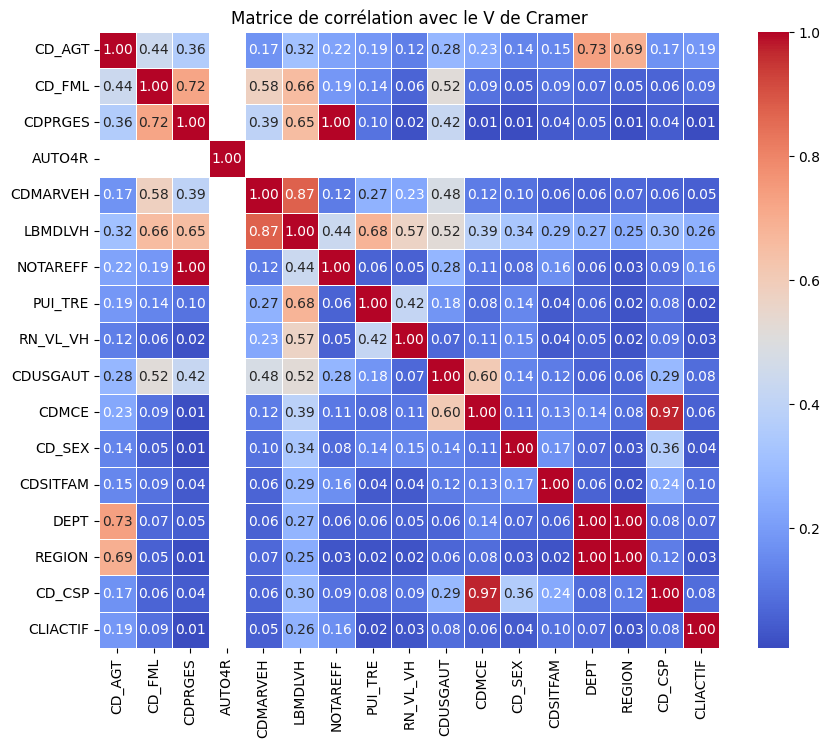

In [471]:
plot_cramers_v_matrix(df_filtre, categorical_cols)

In [472]:
categorical_cols.remove('CDPRGES')  # Une seule modalité représente presque 100 % des cas
categorical_cols.remove('AUTO4R')  # Une seule modalité dominante, peu informative
categorical_cols.remove('DEPT')  # Corrélée à `REGION`, qui est conservée car elle contient moins de modalités
categorical_cols.remove('LBMDLVH')  # Corrélée à `CDMARVEH`, qui est conservée car elle a moins de modalités
categorical_cols.remove('CD_CSP')  # Corrélée à `CDMCE`, qui est conservée car elle a moins de modalités
categorical_cols.remove('CD_AGT')  # Trop de modalités, peu pertinent de modéliser l’effet de l’agent ayant vendu

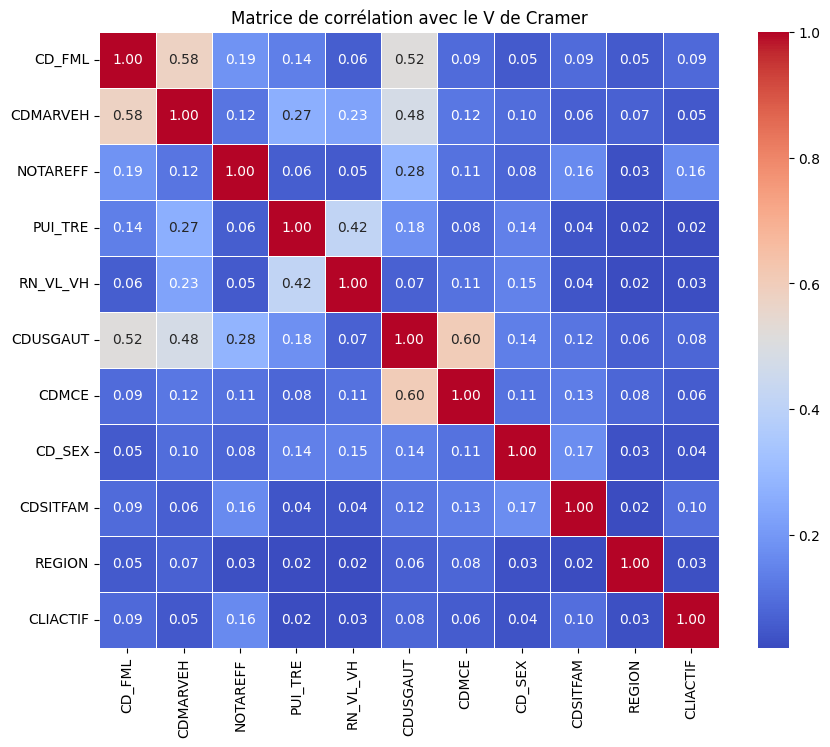

In [473]:
plot_cramers_v_matrix(df_filtre, categorical_cols)

## Quantitatives :  

---

In [474]:
# numeric_cols

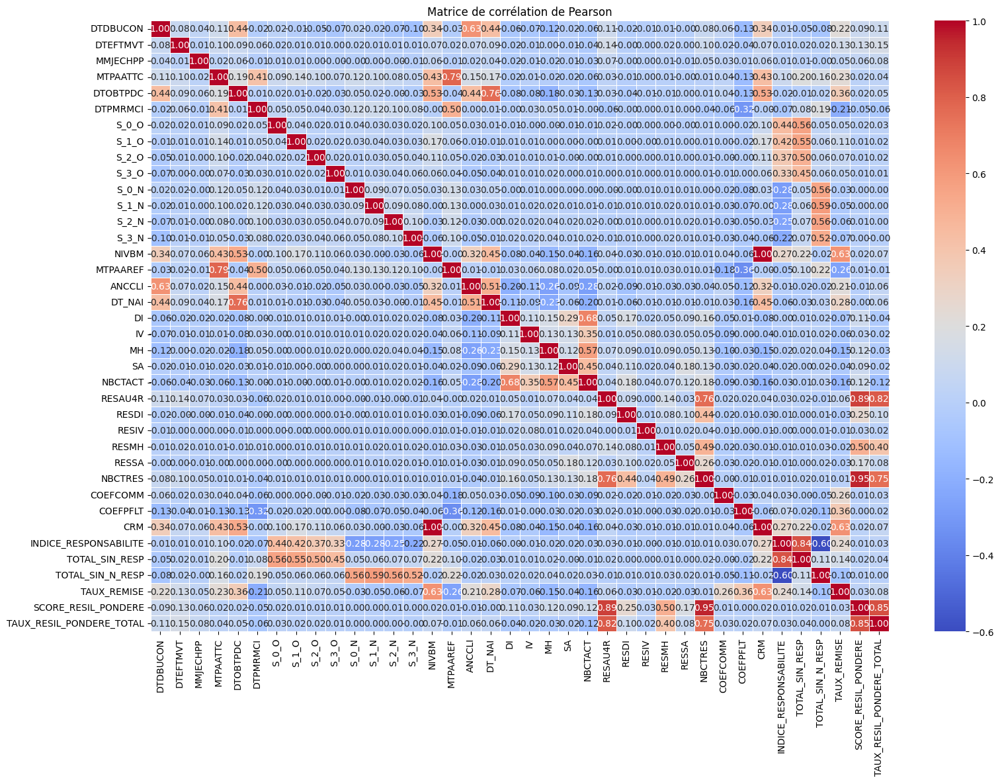

In [475]:
plot_pearson_correlation_matrix(df_filtre, numeric_cols)

In [476]:
vars_a_sup.append('CRM')
vars_a_sup.append('DT_NAI')

La variable `CRM` (coefficient de réduction-majoration) a été supprimée car elle fournit la même information que `NIVBM` (niveau de bonus-malus), qui a été conservée. Pour éviter la redondance et la multicolinéarité, une seule des deux est gardée.

---

La variable `DT_NAI` (date de naissance) a été supprimée car elle est très corrélée à `DTOBTPDC` (date d’obtention du permis). Cette dernière est jugée plus pertinente en assurance auto car elle informe à la fois sur l’âge et l’ancienneté de conduite.

---

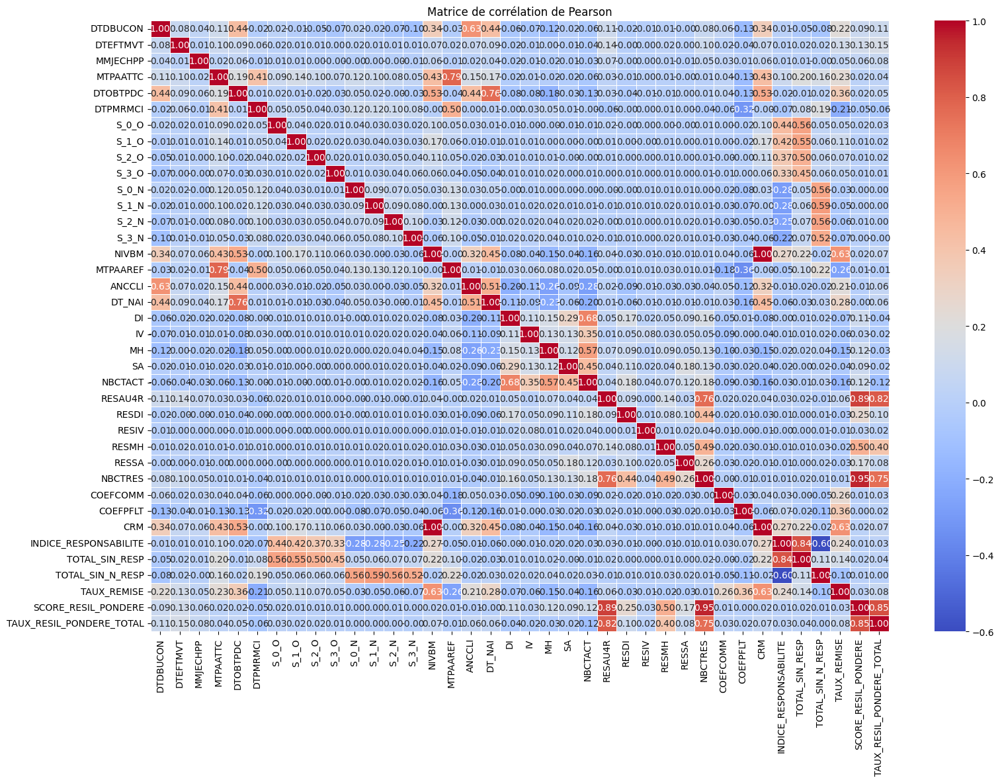

In [477]:
plot_pearson_correlation_matrix(df_filtre, numeric_cols)

### Lien statistique des variables numériques avec la cible :

---

In [478]:
results_signi_var_num = []

for field in numeric_cols:
    a = df_filtre[df_filtre['RESIL'] == 0][field]
    b = df_filtre[df_filtre['RESIL'] == 1][field]

    st_test, st_p = st.ttest_ind(a, b, axis=0, equal_var=False, nan_policy='omit')
    results_signi_var_num.append((field, st_p))

significatives = [(var, pval) for var, pval in results_signi_var_num if pval < 0.05]
non_significatives = [(var, pval) for var, pval in results_signi_var_num if pval >= 0.05]

print("Variables significatives (p < 0.05) :\n")
for var, pval in significatives:
    print(f"{var}: p-value test Student = {pval:.10f}")

print("\nVariables non significatives (p ≥ 0.05) :\n")
for var, pval in non_significatives:
    print(f"{var}: p-value test Student = {pval:.10f}")

Variables significatives (p < 0.05) :

DTDBUCON: p-value test Student = 0.0000000000
DTEFTMVT: p-value test Student = 0.0000000000
MMJECHPP: p-value test Student = 0.0000000000
MTPAATTC: p-value test Student = 0.0000000000
DTOBTPDC: p-value test Student = 0.0000000000
DTPMRMCI: p-value test Student = 0.0000000000
S_0_O: p-value test Student = 0.0000000000
S_1_O: p-value test Student = 0.0000000001
S_2_O: p-value test Student = 0.0000000000
S_3_O: p-value test Student = 0.0004460465
S_0_N: p-value test Student = 0.0223643564
S_1_N: p-value test Student = 0.0062419619
S_3_N: p-value test Student = 0.0025858264
NIVBM: p-value test Student = 0.0000000000
MTPAAREF: p-value test Student = 0.0000000000
ANCCLI: p-value test Student = 0.0000000000
DT_NAI: p-value test Student = 0.0000000000
IV: p-value test Student = 0.0237858729
MH: p-value test Student = 0.0000000000
SA: p-value test Student = 0.0278507672
NBCTACT: p-value test Student = 0.0000000000
RESAU4R: p-value test Student = 0.00000000

# Quels modèles ont du potentiel ?

---

En pratique, le choix des modèles constitue l'une des tâches qui exige non seulement une expertise technique, mais aussi une solide connaissance du métier. Ainsi, déterminer quel modèle adopter de manière éclairée est un défi considérable. Cependant, avec l'évolution des bibliothèques disponibles, il est désormais possible d'évaluer rapidement et de sélectionner certains candidats les plus pertinents en fonction de la métrique choisie. Pour ce faire, nous avons utilisé la bibliothèque LazyPredict, qui permet une comparaison préliminaire efficace des performances de différents modèles.

Un autre facteur crucial dans la sélection des modèles est le temps d'exécution. Cet aspect est souvent négligé dans un cadre académique, mais dans la réalité des entreprises, celles-ci sont prêtes à sacrifier quelques points de performance en échange d'une exécution plus rapide et d'une stabilité accrue. En effet, la facilité de déploiement est primordiale, et un modèle léger, rapide et performant de manière stable est souvent préféré. Par conséquent, le modèle retenu doit non seulement optimiser la métrique choisie, mais aussi présenter un temps d'exécution raisonnable.

Une fois que les modèles candidats ont été identifiés, nous approfondissons ensuite chaque modèle en vue de les optimiser davantage pour obtenir les meilleures performances possibles.

### Attention :

---

Il est important de noter que la bibliothèque LazyPredict adopte une approche extrêmement simplifiée et minimale pour le traitement des données, dont le seul but est de permettre au modèle de s'exécuter sans véritable optimisation des étapes de preprocessing comme nous le faisons manuellement. Nous savons que différents types de prétraitement conduisent à des résultats différents. Par conséquent, l'idée est d'utiliser les résultats de LazyPredict comme une base de comparaison "par défaut", puis de voir comment l'optimisation manuelle des étapes de preprocessing avec différentes techniques impacte les métriques de performance ainsi que le temps d'exécution.

### Sur le plan technique, dans la bibliothèque LazyPredict :

---

- Les variables numériques sont traitées via un pipeline en deux étapes : `SimpleImputer(strategy="mean")` et `StandardScaler`.

- Les variables catégorielles avec une faible cardinalité (peu de modalités distinctes) sont traitées par un pipeline comprenant : `SimpleImputer(strategy="constant", fill_value="missing")` pour remplir les valeurs manquantes avec la chaîne de caractères `"missing"`, suivi de `OneHotEncoder`.

- Les données catégorielles avec une haute cardinalité (beaucoup de modalités distinctes) sont traitées différemment avec un pipeline utilisant : `SimpleImputer(strategy="constant", fill_value="missing")` pour remplacer les valeurs manquantes par `"missing"`, puis `OrdinalEncoder`.

- Le seuil de distinction entre haute et basse cardinalité est fixé à **11 modalités**.

On peut observer qu'avec un tel prétraitement simplifié, la bibliothèque présente une faiblesse majeure : elle ne fait pas de distinction claire entre les variables ordinales et nominales.

**Lien GitHub de LazyPredict** : https://github.com/shankarpandala/lazypredict

**Remarque :**

---

Le temps de calcul sera élevé pour tester l’ensemble des modèles de classification (environ 30) sur nos 90 000 contrats auto.

Nous décidons donc de sélectionner aléatoirement 10 000 lignes à des fins de test, afin d’obtenir un aperçu des modèles les plus adaptés à notre problématique.

---

In [479]:
X = df_filtre[numeric_cols + categorical_cols]
y = df_filtre["CONTRAT"]

# Échantillonnage stratifié de 10k lignes (pour accélérer les temps de calcul) :
X_ech, _, y_ech, _ = train_test_split(
    X, y,
    train_size=10000,
    stratify=y,
    random_state=42
)

# Reconstruction de la table échantillonnée :
df_ech = X_ech.copy()
df_ech["CONTRAT"] = y_ech

In [480]:
print(df_ech.shape)
print(df_ech['CONTRAT'].value_counts(normalize = True) * 100)

(10000, 50)
CONTRAT
ACTIF   88.78
RESIL   11.22
Name: proportion, dtype: float64


In [481]:
le = LabelEncoder()
y = le.fit_transform(df_ech['CONTRAT'])

# Traitement (rapide) des variables explicatives :
# - Les vars. num sont conservées telles quelles
# - Les vars. cat sont encodées avec pd.get_dummies
X_num = df_ech[numeric_cols]
X_cat = pd.get_dummies(df_ech[categorical_cols], drop_first=True)

# Concat :
X = pd.concat([X_num, X_cat], axis=1)

# Les valeurs manquantes :
X = X.fillna(0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=recall_score)
models_par_defaut, predictions = clf.fit(X_train, X_test, y_train, y_test)

columns_to_keep = ['F1 Score', 'recall_score', 'Time Taken']
filtered_models_par_defaut = models_par_defaut[columns_to_keep]
display(filtered_models_par_defaut)

  0%|          | 0/32 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 887, number of negative: 7113
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3188
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110875 -> initscore=-2.081834
[LightGBM] [Info] Start training from score -2.081834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,F1 Score,recall_score,Time Taken
Model,,,
AdaBoostClassifier,0.99,1.00,1.28
RandomForestClassifier,0.99,0.99,1.13
LGBMClassifier,0.99,0.97,0.31
BaggingClassifier,0.99,0.97,0.39
XGBClassifier,0.99,0.96,0.26
BernoulliNB,0.94,1.00,0.14
DecisionTreeClassifier,0.98,0.91,0.11
LinearSVC,0.97,0.90,0.08
ExtraTreesClassifier,0.98,0.88,0.70


In [482]:
# Toutes les métriques :
models_par_defaut, predictions = clf.fit(X_train, X_test, y_train, y_test)
display(models_par_defaut)

'tuple' object has no attribute '__name__'
Invalid Classifier(s)


  0%|          | 0/32 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 887, number of negative: 7113
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3188
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.110875 -> initscore=-2.081834
[LightGBM] [Info] Start training from score -2.081834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_score,Time Taken
Model,,,,,,
AdaBoostClassifier,0.99,0.99,0.99,0.99,1.00,0.89
RandomForestClassifier,0.99,0.99,0.99,0.99,0.99,0.92
LGBMClassifier,0.99,0.98,0.98,0.99,0.97,0.30
BaggingClassifier,0.99,0.98,0.98,0.99,0.97,0.29
XGBClassifier,0.99,0.98,0.98,0.99,0.96,0.24
BernoulliNB,0.93,0.96,0.96,0.94,1.00,0.04
DecisionTreeClassifier,0.98,0.95,0.95,0.98,0.91,0.08
LinearSVC,0.97,0.94,0.94,0.97,0.90,0.13
ExtraTreesClassifier,0.98,0.94,0.94,0.98,0.88,0.56


# Data Preprocessing

---

## Gestion des Valeurs Aberrantes

---

In [483]:
df_filtre_2 = df_filtre.copy()
df_filtre_2['CONTRAT'] = df_filtre_2['CONTRAT'].map({'ACTIF': 0, 'RESIL': 1})

# Diviser les données en un ensemble d'entrainement et un ensemble de test
X = df_filtre_2
y = df_filtre_2['CONTRAT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Taille de l'ensemble d'entrainement :", X_train.shape[0])
print("Taille de l'ensemble de test :", X_test.shape[0])

Taille de l'ensemble d'entrainement : 72194
Taille de l'ensemble de test : 18049


In [484]:
X_train[numeric_cols].describe(percentiles = [0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]).T

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
DTDBUCON,72194.00,11986.36,2619.59,-21549.00,2039.00,7365.00,10766.00,12632.00,13970.00,14704.00,14838.00,14883.00
DTEFTMVT,72194.00,14730.23,190.00,8948.00,14187.93,14524.00,14693.00,14765.00,14807.00,14868.00,14890.00,14943.00
MMJECHPP,72181.00,617.64,349.30,101.00,101.00,101.00,316.00,612.00,912.00,1207.00,1224.00,1231.00
MTPAATTC,72194.00,3076.49,1951.26,0.00,704.47,982.85,1772.16,2647.51,3852.92,6617.74,9921.68,62556.82
DTOBTPDC,72044.00,6217.56,5075.08,-14244.00,-5446.57,-2341.85,2524.00,6575.00,10279.00,13887.00,14620.00,14879.00
DTPMRMCI,71429.00,11422.03,2156.17,-14610.00,4869.00,8067.00,10196.00,11504.00,13057.00,14396.00,14701.00,14792.00
S_0_O,72194.00,0.05,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00
S_1_O,72194.00,0.05,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00
S_2_O,72194.00,0.04,0.21,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00
S_3_O,72194.00,0.03,0.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00


In [485]:
X_test[numeric_cols].describe(percentiles = [0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]).T

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
DTDBUCON,18049.00,11948.19,2635.75,-4505.00,1978.00,7368.00,10673.00,12591.00,13958.00,14705.00,14833.00,14882.00
DTEFTMVT,18049.00,14731.26,181.77,9128.00,14188.96,14524.00,14694.00,14766.00,14806.00,14868.00,14890.00,14944.00
MMJECHPP,18046.00,619.91,350.07,101.00,101.00,104.00,315.00,618.00,914.00,1207.00,1223.00,1231.00
MTPAATTC,18049.00,3074.37,1991.08,0.00,720.04,990.18,1783.38,2639.22,3839.00,6523.59,9789.46,41214.64
DTOBTPDC,18006.00,6156.70,5051.31,-13667.00,-5356.50,-2340.25,2502.25,6479.50,10139.00,13838.75,14586.00,14860.00
DTPMRMCI,17883.00,11453.94,2144.68,-21549.00,4833.42,8126.00,10258.00,11566.00,12996.00,14396.00,14701.00,14792.00
S_0_O,18049.00,0.05,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00
S_1_O,18049.00,0.05,0.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2.00
S_2_O,18049.00,0.04,0.20,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,3.00
S_3_O,18049.00,0.03,0.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,5.00


In [486]:
X_train[categorical_cols].describe().T

,count,unique,top,freq
CD_FML,71755,20,T,30319
CDMARVEH,72128,224,RENAULT,22140
NOTAREFF,71984,17,BL050,30338
PUI_TRE,72058,14,D,13061
RN_VL_VH,72054.00,18.00,7.00,8368.00
CDUSGAUT,72182.00,68.00,611.00,30870.00
CDMCE,72194,2,P,61689
CD_SEX,72116,2,M,53910
CDSITFAM,71900,7,M,51526
REGION,72030,11,NE,16001


In [487]:
X_test[categorical_cols].describe().T

,count,unique,top,freq
CD_FML,17944,22,T,7623
CDMARVEH,18028,117,RENAULT,5523
NOTAREFF,17992,15,BL050,7757
PUI_TRE,18019,13,D,3242
RN_VL_VH,18019.00,18.00,7.00,2131.00
CDUSGAUT,18045.00,53.00,611.00,7705.00
CDMCE,18049,2,P,15405
CD_SEX,18027,2,M,13429
CDSITFAM,17983,5,M,13022
REGION,18014,9,NE,4168


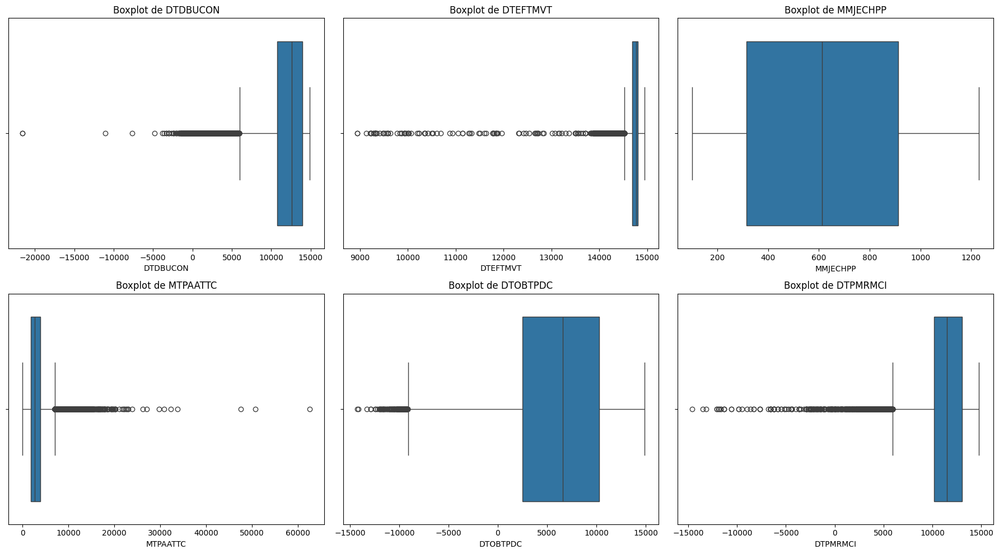

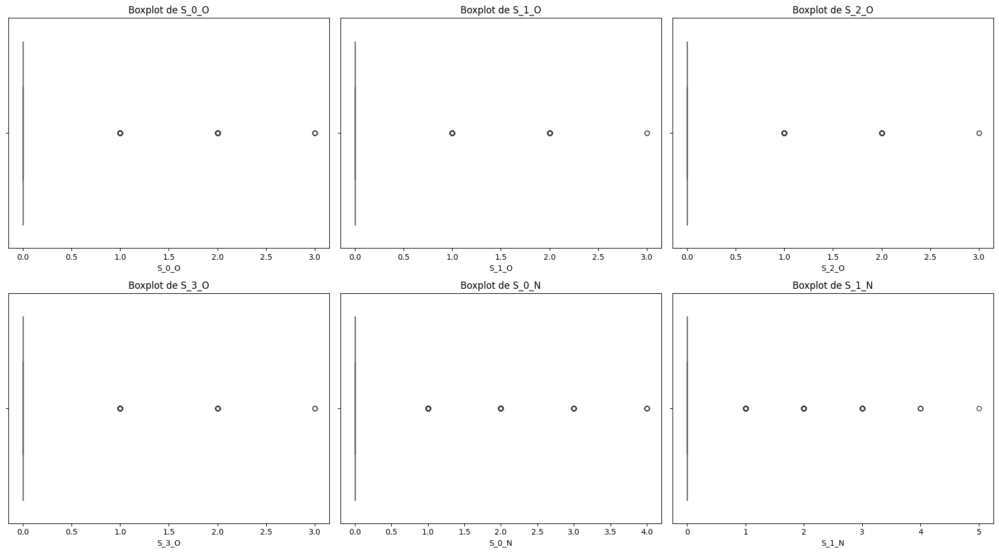

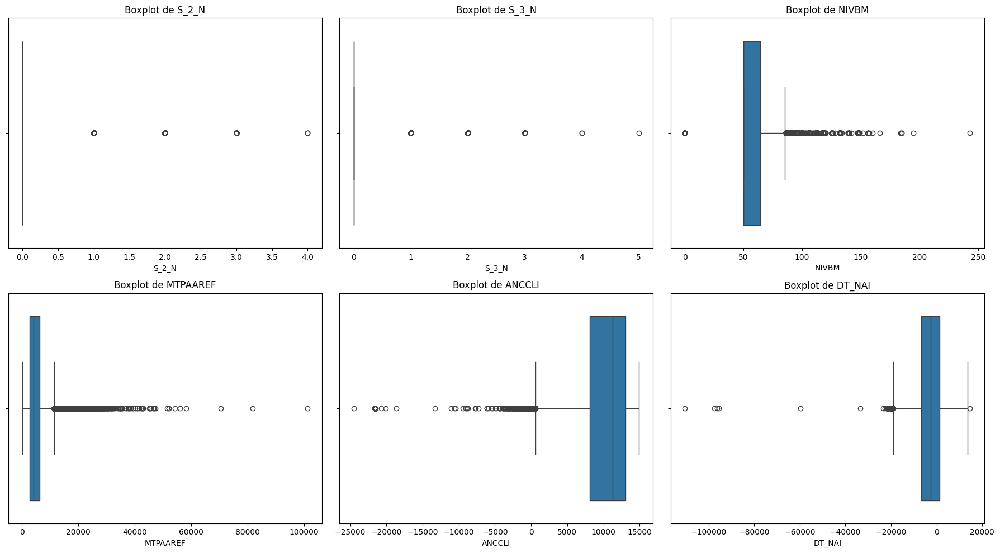

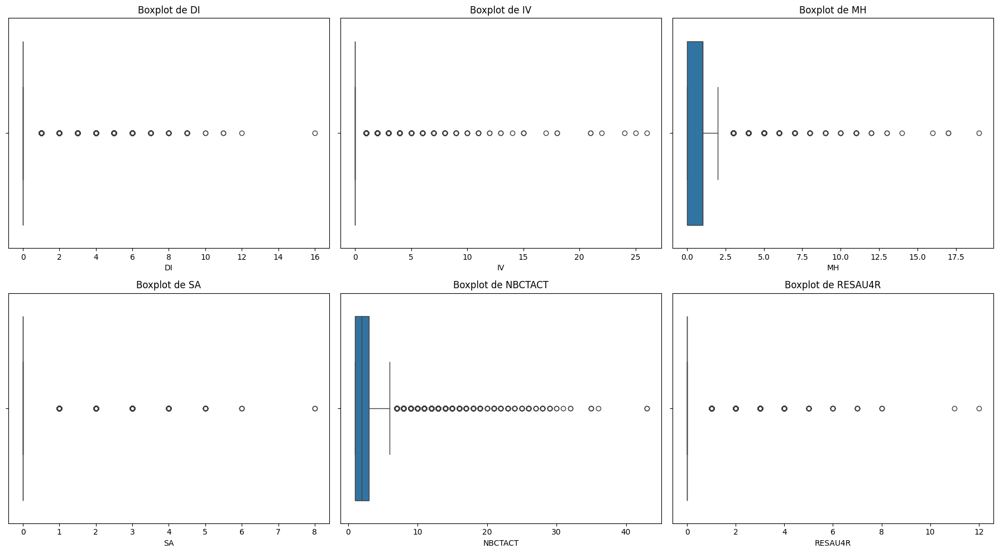

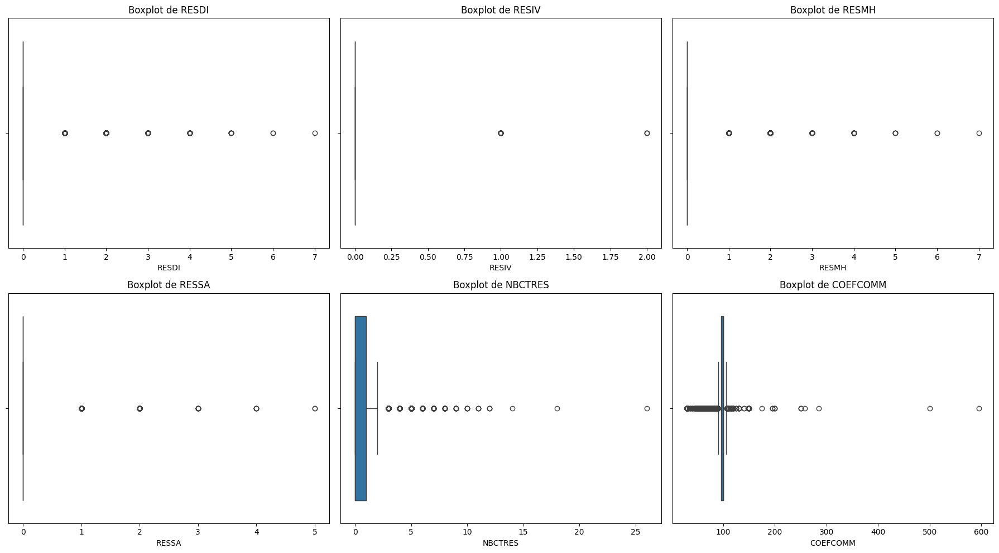

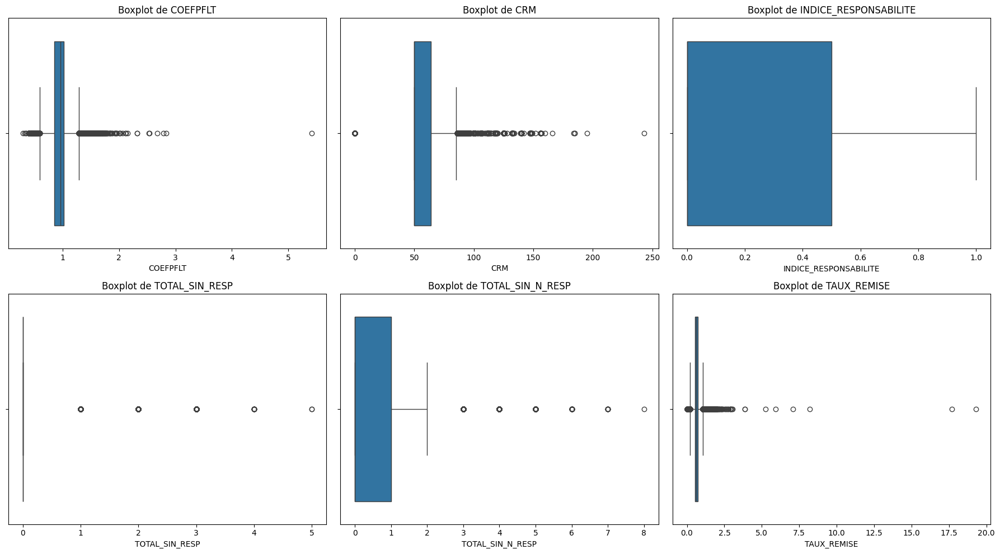

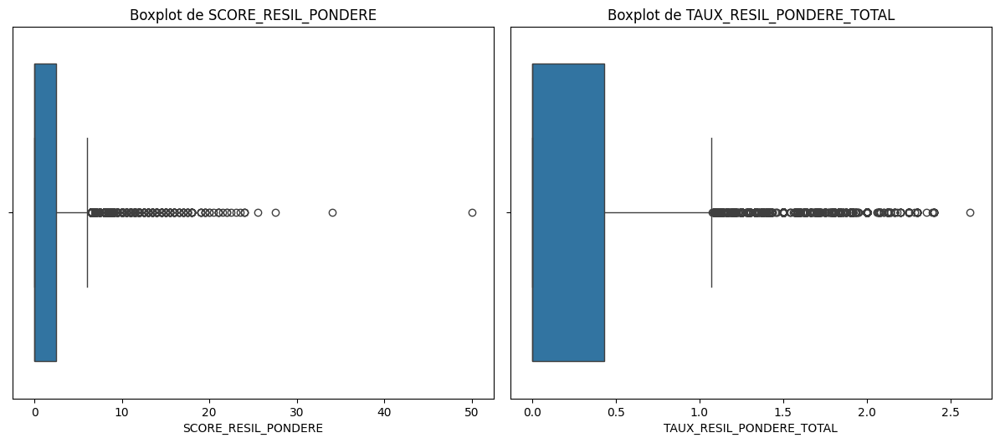

In [488]:
n = len(numeric_cols)

for i in range(0, n, 6):
    subset = numeric_cols[i:i+6]
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()  # Convertir en liste plate

    for j, col in enumerate(subset):
        sns.boxplot(data=X_train[col], orient='h', ax=axes[j])
        axes[j].set_title(f'Boxplot de {col}')
        axes[j].set_xlabel(col)

    # Supprimer les axes inutilisés si subset < 6
    for k in range(len(subset), 6):
        fig.delaxes(axes[k])

    plt.tight_layout()
    plt.show()

In [489]:
outlier_bornes = {}

for col in numeric_cols:
    Q1 = X_train[col].quantile(0.25)
    Q3 = X_train[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Total de valeurs non nulles :
    total = X_train[col].notnull().sum()

    # % d'outliers :
    nb_outliers = ((X_train[col] < lower_bound) | (X_train[col] > upper_bound)).sum()
    pct_outliers = 100 * nb_outliers / total if total > 0 else 0

    # % de valeurs négatives :
    nb_neg = (X_train[col] < 0).sum()
    pct_neg = 100 * nb_neg / total if total > 0 else 0

    outlier_bornes[col] = {
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'borne_min': lower_bound,
        'borne_max': upper_bound,
        'nb_outliers': nb_outliers,
        '%_outliers': round(pct_outliers, 2),
        '%_negatives': round(pct_neg, 2)
    }

outlier_resultat = pd.DataFrame(outlier_bornes).T
outlier_resultat

,Q1,Q3,IQR,borne_min,borne_max,nb_outliers,%_outliers,%_negatives
DTDBUCON,10766.00,13970.00,3204.00,5960.00,18776.00,2197.00,3.04,0.26
DTEFTMVT,14693.00,14807.00,114.00,14522.00,14978.00,3488.00,4.83,0.00
MMJECHPP,316.00,912.00,596.00,-578.00,1806.00,0.00,0.00,0.00
MTPAATTC,1772.16,3852.92,2080.76,-1348.98,6974.06,2933.00,4.06,0.00
DTOBTPDC,2524.00,10279.00,7755.00,-9108.50,21911.50,147.00,0.20,12.61
DTPMRMCI,10196.00,13057.00,2861.00,5904.50,17348.50,1097.00,1.54,0.22
S_0_O,0.00,0.00,0.00,0.00,0.00,3547.00,4.91,0.00
S_1_O,0.00,0.00,0.00,0.00,0.00,3410.00,4.72,0.00
S_2_O,0.00,0.00,0.00,0.00,0.00,2887.00,4.00,0.00
S_3_O,0.00,0.00,0.00,0.00,0.00,2340.00,3.24,0.00


### Avons-nous des valeurs aberrantes ?

---

Beaucoup d'interrogations existent sur la nature des valeurs aberrantes. Différentes techniques permettent d’en identifier (boxplots, formule de Tukey, etc.), mais les supprimer individuellement pour chaque variable pourrait entraîner une forte réduction de la dimensionnalité du jeu de données.

---

Une alternative pertinente consiste à utiliser un RobustScaler, afin de limiter l’impact des valeurs extrêmes. En effet, certaines techniques comme les algorithmes de bagging (ex. : Random Forest) sont peu sensibles aux outliers. En revanche, il faudra être plus vigilant avec des modèles comme la régression logistique, qui sont plus sensibles à ces valeurs.

---

De plus, de nombreuses valeurs identifiées comme « aberrantes » sont en réalité tout à fait plausibles dans la vraie vie comme des montants de prime élevés ou des réductions importantes sur certains contrats. Les retirer de la base reviendrait à s’éloigner de la réalité terrain.

---

**Remarque** : Les valeurs aberrantes (comme les valeurs manquantes) que l'on cherche à détecter et à traiter peuvent aussi être intégrées dans une démarche de discrétisation. Cela peut renforcer la robustesse, notamment pour la régression logistique, et faciliter l'interprétation.

---

## Gestion des Valeurs Manquantes

---

Le dataset contient  1.67% de valeurs manquantes


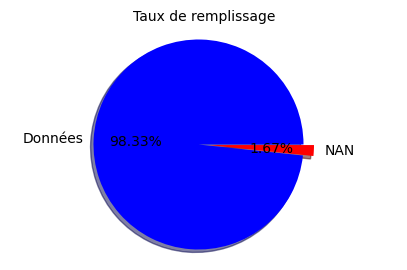

In [490]:
# Taux de valeurs manquantes :
total_data = X_train[categorical_cols + numeric_cols].size
valid_data = X_train[categorical_cols + numeric_cols].count().sum()
rate_ok = valid_data/total_data
print(f"Le dataset contient {1 - rate_ok: .2%} de valeurs manquantes")

# Graphe en camembert :
plt.figure(figsize=(5,3))
plt.pie([rate_ok, 1 - rate_ok], explode=(0, 0.1), labels=["Données", "NAN"],
            colors=['blue', 'red'], autopct='%.2f%%', shadow=True, textprops={'fontsize': 10})
plt.title("Taux de remplissage", fontsize=10)
plt.axis('equal')
plt.show()

In [491]:
# Afficher le nombre de valeurs manquantes :
print("Le nombre de valeurs manquantes :\n", X_train[categorical_cols + numeric_cols].isnull().sum())

Le nombre de valeurs manquantes :
 CD_FML                        439
CDMARVEH                       66
NOTAREFF                      210
PUI_TRE                       136
RN_VL_VH                      140
CDUSGAUT                       12
CDMCE                           0
CD_SEX                         78
CDSITFAM                      294
REGION                        164
CLIACTIF                        0
DTDBUCON                        0
DTEFTMVT                        0
MMJECHPP                       13
MTPAATTC                        0
DTOBTPDC                      150
DTPMRMCI                      765
S_0_O                           0
S_1_O                           0
S_2_O                           0
S_3_O                           0
S_0_N                           0
S_1_N                           0
S_2_N                           0
S_3_N                           0
NIVBM                           0
MTPAAREF                        0
ANCCLI                         13
DT_NAI       

(Compte tenu du faible nombre de valeurs manquantes, nous pourrions envisager de les supprimer.)

---

`INDICE_RESPONSABILITE` : les valeurs manquantes correspondent à des zéros.

Pour les variables numériques, nous allons remplacer les valeurs manquantes par la médiane, calculée sur l’échantillon d’entraînement, puis appliquer la même transformation sur l’échantillon de test.

---

Pour les variables catégorielles, nous utiliserons le mode comme stratégie d’imputation.

---

### Imputation :

---

In [492]:
vars_a_sup

['S_0_O',
 'S_1_O',
 'S_2_O',
 'S_3_O',
 'S_0_N',
 'S_1_N',
 'S_2_N',
 'S_3_N',
 'MTPAATTC',
 'MTPAAREF',
 'RESDI',
 'RESIV',
 'RESMH',
 'RESSA',
 'RESAU4R',
 'RESAUTRES',
 'SCORE_RESIL_PONDERE',
 'CRM',
 'DT_NAI']

In [493]:
# Mise à jour des listes en retirant les variables à supprimer :
numeric_cols = [col for col in numeric_cols if col not in vars_a_sup]
categorical_cols = [col for col in categorical_cols if col not in vars_a_sup]

In [494]:
# Sauvegarde des médianes pour les variables numériques :
median_dict_train = {}
for var in numeric_cols:
    median_value = X_train[var].median()
    median_dict_train[var] = median_value
    print(f"{var} : médiane = {median_value}")

DTDBUCON : médiane = 12632.0
DTEFTMVT : médiane = 14765.0
MMJECHPP : médiane = 612.0
DTOBTPDC : médiane = 6575.0
DTPMRMCI : médiane = 11504.0
NIVBM : médiane = 50.0
ANCCLI : médiane = 11257.0
DI : médiane = 0.0
IV : médiane = 0.0
MH : médiane = 1.0
SA : médiane = 0.0
NBCTACT : médiane = 2.0
NBCTRES : médiane = 0.0
COEFCOMM : médiane = 100.0
COEFPFLT : médiane = 0.9617
INDICE_RESPONSABILITE : médiane = 0.0
TOTAL_SIN_RESP : médiane = 0.0
TOTAL_SIN_N_RESP : médiane = 0.0
TAUX_REMISE : médiane = 0.608316327694119
TAUX_RESIL_PONDERE_TOTAL : médiane = 0.0


In [495]:
mode_dict_train = {}
for var in categorical_cols:
    mode_value = X_train[var].mode(dropna=True)
    if not mode_value.empty:
        mode_value = mode_value[0]
        mode_dict_train[var] = mode_value
        print(f"{var} : mode = {mode_value}")
    else:
        print(f"{var} : pas de mode (variable vide)")

CD_FML : mode = T
CDMARVEH : mode = RENAULT
NOTAREFF : mode = BL050
PUI_TRE : mode = D
RN_VL_VH : mode = 7.0
CDUSGAUT : mode = 611.0
CDMCE : mode = P
CD_SEX : mode = M
CDSITFAM : mode = M
REGION : mode = NE
CLIACTIF : mode = OUI


In [496]:
# Imputation des variables numériques (X_train) avec la médiane :
for var in median_dict_train:
    if var in X_train.columns:
        X_train[var] = X_train[var].fillna(median_dict_train[var])

# Imputation des variables catégorielles (X_train) avec le mode :
for var in mode_dict_train:
    if var in X_train.columns:
        X_train[var] = X_train[var].fillna(mode_dict_train[var])

# Imputation des variables numériques (X_test) avec la médiane :
for var in median_dict_train:
    if var in X_test.columns:
        X_test[var] = X_test[var].fillna(median_dict_train[var])

# Imputation des variables catégorielles (X_test) avec le mode :
for var in mode_dict_train:
    if var in X_test.columns:
        X_test[var] = X_test[var].fillna(mode_dict_train[var])

In [497]:
X_train[numeric_cols + categorical_cols].info()

<class 'pandas.core.frame.DataFrame'>
Index: 72194 entries, 13904 to 15797
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   DTDBUCON                  72194 non-null  int64  
 1   DTEFTMVT                  72194 non-null  int64  
 2   MMJECHPP                  72194 non-null  float64
 3   DTOBTPDC                  72194 non-null  float64
 4   DTPMRMCI                  72194 non-null  float64
 5   NIVBM                     72194 non-null  int64  
 6   ANCCLI                    72194 non-null  float64
 7   DI                        72194 non-null  float64
 8   IV                        72194 non-null  float64
 9   MH                        72194 non-null  float64
 10  SA                        72194 non-null  float64
 11  NBCTACT                   72194 non-null  float64
 12  NBCTRES                   72194 non-null  int64  
 13  COEFCOMM                  72194 non-null  int64  
 14  COEFPFL

In [498]:
X_test[numeric_cols + categorical_cols].info()

<class 'pandas.core.frame.DataFrame'>
Index: 18049 entries, 49628 to 22731
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   DTDBUCON                  18049 non-null  int64  
 1   DTEFTMVT                  18049 non-null  int64  
 2   MMJECHPP                  18049 non-null  float64
 3   DTOBTPDC                  18049 non-null  float64
 4   DTPMRMCI                  18049 non-null  float64
 5   NIVBM                     18049 non-null  int64  
 6   ANCCLI                    18049 non-null  float64
 7   DI                        18049 non-null  float64
 8   IV                        18049 non-null  float64
 9   MH                        18049 non-null  float64
 10  SA                        18049 non-null  float64
 11  NBCTACT                   18049 non-null  float64
 12  NBCTRES                   18049 non-null  int64  
 13  COEFCOMM                  18049 non-null  int64  
 14  COEFPFL

In [499]:
print(X_train[numeric_cols + categorical_cols].shape)
print(X_test[numeric_cols + categorical_cols].shape)
print(y_train.shape)
print(y_test.shape)

(72194, 31)
(18049, 31)
(72194,)
(18049,)


# Modélisation

---

- Dans cette section, nous allons tester plusieurs versions de modèles de classification afin de modéliser la probabilité de résiliation d’un contrat auto à partir des caractéristiques présentes et sélectionnées sur l’ensemble des données disponibles.

- Nous évaluerons, pour chaque modèle, différentes métriques afin de comparer les modèles entre eux.

---

Pour évaluer nos modèles, nous calculerons diverses métriques qui fourniront un aperçu de leur performance. Afin de garantir la pertinence du modèle sur des données non observées, nous définissons un jeu de test fixe, représentant 20 % de l’ensemble des données, et commun à tous les modèles. Ce jeu de test est strictement exclu de l’entraînement et ne sera pas utilisé lors des choix d’optimisation ou de tout autre calcul lié au modèle.

Les principales métriques utilisées dans ce projet sont :

- Score `AUC` (Area Under the Curve) : L’AUC mesure la capacité du modèle à discriminer entre les classes. Il s’agit de la surface sous la courbe ROC, qui représente la relation entre le taux de vrais positifs et le taux de faux positifs. Un score AUC proche de 1 indique une bonne capacité de discrimination, tandis qu’un score de 0,5 signifie que le modèle n’est pas meilleur que le hasard.

- `F1-score` : Le F1-score est la moyenne harmonique entre la précision et le rappel. Il est particulièrement utile pour les problèmes où les classes sont déséquilibrées. Dans ce projet, nous nous concentrerons à la fois sur le F1 macro-averaged, qui donne une importance égale à chaque classe, et sur le F1-score de la classe 1, qui mesure la performance du modèle sur la classe positive, souvent la plus importante dans des scénarios où l’intérêt est centré sur une classe spécifique.

---


In [500]:
print("Le nombre de valeurs uniques par variable (numérique) :\n", X_train[numeric_cols].nunique())

print("Le nombre de valeurs uniques par variable (catégorielle) :\n", X_train[categorical_cols].nunique())

Le nombre de valeurs uniques par variable (numérique) :
 DTDBUCON                     8641
DTEFTMVT                     1035
MMJECHPP                      365
DTOBTPDC                    15061
DTPMRMCI                      540
NIVBM                          90
ANCCLI                       9388
DI                             14
IV                             23
MH                             18
SA                              8
NBCTACT                        35
NBCTRES                        16
COEFCOMM                       94
COEFPFLT                     7288
INDICE_RESPONSABILITE          18
TOTAL_SIN_RESP                  6
TOTAL_SIN_N_RESP                9
TAUX_REMISE                 71867
TAUX_RESIL_PONDERE_TOTAL      319
dtype: int64
Le nombre de valeurs uniques par variable (catégorielle) :
 CD_FML       20
CDMARVEH    224
NOTAREFF     17
PUI_TRE      14
RN_VL_VH     18
CDUSGAUT     68
CDMCE         2
CD_SEX        2
CDSITFAM      7
REGION       11
CLIACTIF      2
dtype: int64


## Encodage et Normalisation

---

In [501]:
# Nous séparons les colonnes catégorielles selon le nombre de modalités (sup. à 5 ou non) :
onehot_cols = [col for col in categorical_cols if X_train[col].nunique() <= 5]
targetenc_cols = [col for col in categorical_cols if X_train[col].nunique() > 5]

print("Colonnes encodées avec OneHotEncoder :", onehot_cols)
print("Colonnes encodées avec Target Encoding :", targetenc_cols)

Colonnes encodées avec OneHotEncoder : ['CDMCE', 'CD_SEX', 'CLIACTIF']
Colonnes encodées avec Target Encoding : ['CD_FML', 'CDMARVEH', 'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION']


### One-hot encoding  :

---

In [502]:
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop = 'first') # drop = 'first' pour la modalité de référence
X_train_ohe = ohe.fit_transform(X_train[onehot_cols])
X_test_ohe = ohe.transform(X_test[onehot_cols])

ohe_cols = ohe.get_feature_names_out(onehot_cols)
X_train_ohe_df = pd.DataFrame(X_train_ohe, columns=ohe_cols, index=X_train.index)
X_test_ohe_df = pd.DataFrame(X_test_ohe, columns=ohe_cols, index=X_test.index)
X_train_ohe_df.head()

,CDMCE_T,CD_SEX_M,CLIACTIF_OUI
13904,0.00,1.00,1.00
44259,0.00,1.00,1.00
39551,0.00,1.00,1.00
90219,0.00,1.00,1.00
16176,0.00,1.00,1.00


### Target encoding :

---

In [503]:
X_train_te_df = pd.DataFrame(index=X_train.index)
X_test_te_df = pd.DataFrame(index=X_test.index)

target_encoding_maps = {}

for col in targetenc_cols:
    X_train[col].fillna("NR", inplace=True)
    X_test[col].fillna("NR", inplace=True)

    moyenne_par_modalite = X_train.groupby(col)['CONTRAT'].mean()

    target_encoding_maps[col] = moyenne_par_modalite.to_dict()

    X_train_te_df[col] = X_train[col].map(moyenne_par_modalite)
    X_test_te_df[col] = X_test[col].map(moyenne_par_modalite)

    moyenne_globale = X_train[Target].mean()
    X_test_te_df[col].fillna(moyenne_globale, inplace=True)

In [504]:
X_train_te_df.head()

,CD_FML,CDMARVEH,NOTAREFF,PUI_TRE,RN_VL_VH,CDUSGAUT,CDSITFAM,REGION
13904,0.08,0.12,0.08,0.12,0.12,0.07,0.10,0.11
44259,0.17,0.12,0.24,0.09,0.11,0.12,0.14,0.11
39551,0.08,0.11,0.08,0.12,0.12,0.07,0.10,0.11
90219,0.17,0.12,0.08,0.09,0.10,0.12,0.10,0.12
16176,0.12,0.11,0.12,0.10,0.09,0.12,0.14,0.10


In [505]:
X_train_all = pd.concat([X_train[numeric_cols], X_train_ohe_df, X_train_te_df], axis=1)
X_test_all  = pd.concat([X_test[numeric_cols],  X_test_ohe_df,  X_test_te_df], axis=1)

### Robust scaling :

---

In [506]:
# Normalisation des colonnes numériques :
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train_all[numeric_cols])
X_test_scaled  = scaler.transform(X_test_all[numeric_cols])

X_train_all[numeric_cols] = X_train_scaled
X_test_all[numeric_cols]  = X_test_scaled

# DF final :
X_train_final = X_train_all
X_test_final  = X_test_all

X_train_final = X_train_final.dropna()
X_test_final = X_test_final.dropna()

y_train = y_train[X_train_final.index]
y_test = y_test[X_test_final.index]

print("SHAPE X_train_final :", X_train_final.shape)
print("SHAPE X_test_final  :", X_test_final.shape)

SHAPE X_train_final : (72194, 31)
SHAPE X_test_final  : (18014, 31)


In [507]:
X_train_final.columns

Index(['DTDBUCON', 'DTEFTMVT', 'MMJECHPP', 'DTOBTPDC', 'DTPMRMCI', 'NIVBM',
       'ANCCLI', 'DI', 'IV', 'MH', 'SA', 'NBCTACT', 'NBCTRES', 'COEFCOMM',
       'COEFPFLT', 'INDICE_RESPONSABILITE', 'TOTAL_SIN_RESP',
       'TOTAL_SIN_N_RESP', 'TAUX_REMISE', 'TAUX_RESIL_PONDERE_TOTAL',
       'CDMCE_T', 'CD_SEX_M', 'CLIACTIF_OUI', 'CD_FML', 'CDMARVEH', 'NOTAREFF',
       'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION'],
      dtype='object')

## Modèle 1 : Logistic Regression

---

In [508]:
X_train_sm = sm.add_constant(X_train_final)
X_test_sm = sm.add_constant(X_test_final)

model_sm = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
results_sm = model_sm.fit()

print(results_sm.summary())

y_proba_sm = results_sm.predict(X_test_sm)
y_pred_sm = (y_proba_sm >= 0.5).astype(int)

auc = roc_auc_score(y_test, y_proba_sm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_sm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_sm, pos_label=1)

# Affichage
print("\nÉvaluation du modèle :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\nMatrice de confusion :\n", confusion_matrix(y_test, y_pred_sm))
print("\nClassification report :\n", classification_report(y_test, y_pred_sm))

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72162
Model Family:                Binomial   Df Model:                           31
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4207.2
Date:                Sat, 19 Jul 2025   Deviance:                       8414.4
Time:                        23:09:54   Pearson chi2:                 2.23e+04
No. Iterations:                    27   Pseudo R-squ. (CS):             0.4435
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [509]:
stepwise_variables = stepwise_selection(X_train_final, y_train)
stepwise_variables = sorted(stepwise_variables)
print("Variables sélectionnées :", stepwise_variables)

Ajout de DTEFTMVT                       (p = 0)
Ajout de NBCTRES                        (p = 0)
Ajout de TAUX_RESIL_PONDERE_TOTAL       (p = 0)
Suppression de NBCTRES                        (p = 0.04289)
Ajout de MH                             (p = 3.892e-246)
Ajout de COEFPFLT                       (p = 1.262e-94)
Ajout de DTPMRMCI                       (p = 1.726e-45)
Ajout de DI                             (p = 1.488e-20)
Ajout de NOTAREFF                       (p = 2.993e-20)
Ajout de RN_VL_VH                       (p = 3.196e-16)
 « CLIACTIF_OUI » provoque une matrice singulière (donc ignorée).
Ajout de NBCTACT                        (p = 3.183e-15)
Ajout de SA                             (p = 3.4e-14)
Ajout de DTOBTPDC                       (p = 1.321e-09)
Ajout de CDMARVEH                       (p = 2.747e-08)
Ajout de ANCCLI                         (p = 2.173e-08)
Ajout de TOTAL_SIN_RESP                 (p = 5.172e-08)
Ajout de COEFCOMM                       (p = 2.336e-07)
Ajo

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72176
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5468.9
Date:                Sat, 19 Jul 2025   Deviance:                       10938.
Time:                        23:11:34   Pearson chi2:                 7.35e+04
No. Iterations:                    10   Pseudo R-squ. (CS):             0.4237
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

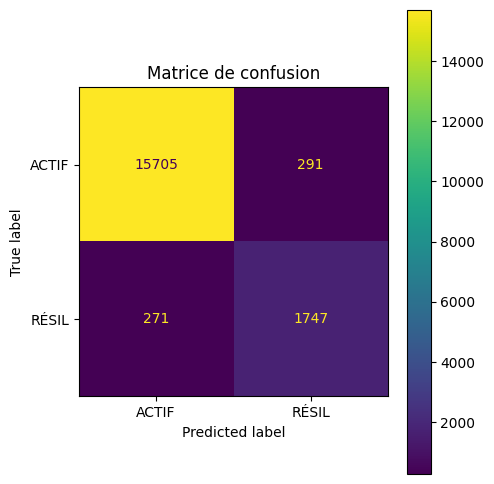

In [510]:
X_train_sm_stepwise = sm.add_constant(X_train_final[stepwise_variables])
X_test_sm_stepwise = sm.add_constant(X_test_final[stepwise_variables])

model_sm = sm.GLM(y_train, X_train_sm_stepwise, family=sm.families.Binomial())
results_sm = model_sm.fit()

print(results_sm.summary())

y_proba_sm = results_sm.predict(X_test_sm_stepwise)
y_pred_sm = (y_proba_sm >= 0.5).astype(int)

auc = roc_auc_score(y_test, y_proba_sm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_sm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_sm, pos_label=1)

print("\nÉvaluation du modèle :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\nMatrice de confusion :\n", confusion_matrix(y_test, y_pred_sm))
print("\nClassification report :\n", classification_report(y_test, y_pred_sm))

# Matrice de confusion :
fig, ax = plt.subplots(figsize=(5, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred_sm),
                              display_labels=["ACTIF", "RÉSIL"])
disp.plot(ax=ax)
plt.title("Matrice de confusion")
plt.tight_layout()
plt.show()

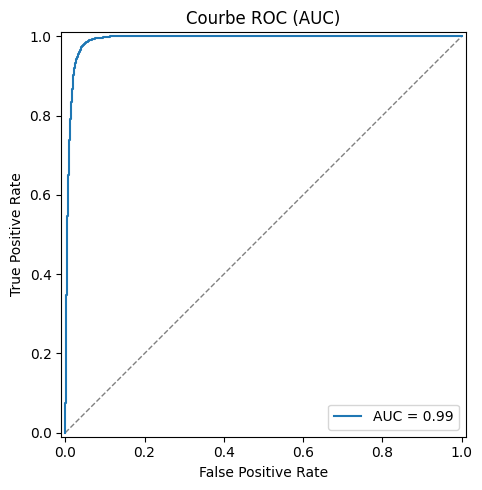

In [511]:
# Courbe ROC :
fpr, tpr, _ = roc_curve(y_test, y_proba_sm)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc)

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot([0, 1], [0, 1], '--', color='gray', linewidth=1)  # diagonale
roc_display.plot(ax=ax)
plt.title("Courbe ROC (AUC)")
plt.tight_layout()
plt.show()

**Pour la régression logistique :**

---

- Une sélection stepwise a été réalisée en n’acceptant dans le modèle que les variables dont la p-value est inférieure à 0.01.
  - Ce seuil a été volontairement fixé afin de ne conserver que les variables les plus robustes et statistiquement significatives (principe de parcimonie).
  - Lorsqu’une variable provoque une matrice singulière (problème de multicolinéarité), elle est automatiquement exclue et ignorée pour la suite de la sélection.
- Pour contrôler la multicolinéarité :
  - Les variables trop corrélées entre elles sont naturellement repérées et écartées grâce à la gestion automatique des erreurs de type "singular matrix".
- Une régression LASSO sera ensuite appliquée pour affiner davantage la sélection. Le LASSO permet de réduire à zéro les coefficients de certaines variables redondantes, ce qui complète efficacement la sélection par p-value.

---

**Résumé du modèle :**

---

- AUC proche de 0.991 : très bonne séparation entre les classes.
- Gini proche de 0.982 : très élevé, ce qui indique une discrimination presque parfaite.
- F1-score macro d’environ 0.92 : bon équilibre global entre les classes.
- F1-score classe 1 d’environ 0.86 : bonne performance spécifique sur les cas de résiliation.

La matrice de confusion montre un bon équilibre entre faux positifs et faux négatifs. Le modèle identifie correctement les clients à risque de résiliation, tout en conservant une bonne précision globale.

---

Les coefficients estimés sont tous significatifs (p-value très faibles), et leur signe permet d’interpréter leur influence sur la probabilité de résiliation (sans toutefois indiquer directement l’ampleur de l’effet).

---

**Interprétation de quelques variables / coefficients :**

---

- `TAUX_RESIL_PONDERE_TOTAL` (positif) : plus le score de résiliation est élevé, plus le risque de résiliation est fort.
- `RN_VL_VH` (positif) : les véhicules haut de gamme ou très cotés sont associés à une volatilité plus élevée.
- `DI` (positif) : un grand nombre de contrats divers pourrait signaler un profil instable ou opportuniste.
- `MH` (négatif) : avoir un contrat habitation en plus d’un contrat auto peut refléter une fidélité plus forte.
- `DTEFTMVT` (positif) : un mouvement récent sur le contrat est associé à un risque de résiliation plus élevé.

---

**Nature des variables douteuses :**

- `DTEFTMVT` : variable incertaine, car le dernier mouvement peut justement indiquer une résiliation. L’hypothèse serait que la colonne `DTEFTMVT` est mise à jour au moment où le passage en statut RÉSIL est enregistré. De manière générale, cette variable est concentrée sur les dates récentes (valeurs élevées par rapport à la référence), ce qui peut sembler normal puisque les contrats sont revus régulièrement (au moins semestriellement).

- Autres variables douteuses : `COEFCOMM` et `COEFPFLT`. Nous ne disposons pas d’une définition claire pour ces variables, mais elles semblent néanmoins pertinentes pour le modèle.

- Interrogation également sur les variables liées aux nombres de contrats (`NBCTACT`, `NBCTRES`, ...) : on ne sait pas si le contrat auto en question est compris dans ces comptes.

- Une étude approfondie avec les équipes métier est indispensable pour analyser ces variables en détail. Sinon, il existe un risque de mauvaise construction du modèle, notamment par utilisation de variables potentiellement causales ou corrélées avec la cible.


---

### Feature selection using LASSO

---

In [512]:
lasso_model = Lasso()

kf = KFold(n_splits =10, shuffle =True, random_state = 0)

params = {"alpha": np.arange(0.0000000001, 100, 5)}

lasso_cv = GridSearchCV(lasso_model, param_grid = params, cv = kf)

lasso_cv.fit(X_train_final,y_train)

print(f"The best Param is {lasso_cv.best_params_}")

The best Param is {'alpha': np.float64(1e-10)}


In [513]:
# lasso regression with alpha = 1.e-10 whish the best alpha
best_lasso_model = Lasso(alpha = 1e-10)
best_lasso_model.fit(X_train_final, y_train.ravel())

Lasso(alpha=1e-10)

In [514]:
# the coefficient of each feature with lasso regression model :
best_lasso_model_coef = np.abs(best_lasso_model.coef_)
best_lasso_model_coef

array([0.00352553, 0.01748775, 0.01571967, 0.01085001, 0.01795168,
       0.00266077, 0.00113525, 0.03613265, 0.01826071, 0.03588436,
       0.03271877, 0.03227674, 0.02843002, 0.00211423, 0.01032051,
       0.03145382, 0.03126924, 0.00225029, 0.00502394, 0.14326173,
       0.00292313, 0.00482538, 0.61616984, 0.01331428, 0.32756718,
       0.18036988, 0.11548015, 0.42584115, 0.1258052 , 0.11263058,
       0.05739143])

In [515]:
feature_name = X_train_final.columns
feature_name

Index(['DTDBUCON', 'DTEFTMVT', 'MMJECHPP', 'DTOBTPDC', 'DTPMRMCI', 'NIVBM',
       'ANCCLI', 'DI', 'IV', 'MH', 'SA', 'NBCTACT', 'NBCTRES', 'COEFCOMM',
       'COEFPFLT', 'INDICE_RESPONSABILITE', 'TOTAL_SIN_RESP',
       'TOTAL_SIN_N_RESP', 'TAUX_REMISE', 'TAUX_RESIL_PONDERE_TOTAL',
       'CDMCE_T', 'CD_SEX_M', 'CLIACTIF_OUI', 'CD_FML', 'CDMARVEH', 'NOTAREFF',
       'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION'],
      dtype='object')

In [516]:
# variables avec non-zéro coefficient :
feature_subset=np.array(feature_name)[best_lasso_model_coef != 0]
print(f"Selected Feature Columns: {feature_subset}")

Selected Feature Columns: ['DTDBUCON' 'DTEFTMVT' 'MMJECHPP' 'DTOBTPDC' 'DTPMRMCI' 'NIVBM' 'ANCCLI'
 'DI' 'IV' 'MH' 'SA' 'NBCTACT' 'NBCTRES' 'COEFCOMM' 'COEFPFLT'
 'INDICE_RESPONSABILITE' 'TOTAL_SIN_RESP' 'TOTAL_SIN_N_RESP' 'TAUX_REMISE'
 'TAUX_RESIL_PONDERE_TOTAL' 'CDMCE_T' 'CD_SEX_M' 'CLIACTIF_OUI' 'CD_FML'
 'CDMARVEH' 'NOTAREFF' 'PUI_TRE' 'RN_VL_VH' 'CDUSGAUT' 'CDSITFAM' 'REGION']


In [517]:
# triées par coefficient :
data = {'feature': feature_name, 'coeff': best_lasso_model_coef}
dict_feature_coeff = pd.DataFrame(data)
dict_feature_coeff_sorted = dict_feature_coeff.sort_values(by= 'coeff', ascending = False, ignore_index = True)
dict_feature_coeff_sorted

,feature,coeff
0,CLIACTIF_OUI,0.62
1,RN_VL_VH,0.43
2,CDMARVEH,0.33
3,NOTAREFF,0.18
4,TAUX_RESIL_PONDERE_TOTAL,0.14
5,CDUSGAUT,0.13
6,PUI_TRE,0.12
7,CDSITFAM,0.11
8,REGION,0.06
9,DI,0.04


**Variables non sélectionnées par le LASSO :**

---

Le LASSO n’a pas sélectionné certaines variables, leurs coefficients étant réduits à zéro dans le modèle final. Parmi elles, on trouve notamment :

- `CD_SEX_M`
- `DTDBUCON`
- `CDMCE_T`
- `NIVBM`
- `TOTAL_SIN_N_RESP`
- `COEFCOMM`
- `ANCCLI`

Cela signifie que, selon la logique de régularisation du LASSO, ces variables sont jugées comme redondantes ou peu contributives une fois les autres variables du modèle prises en compte.

En revanche, les autres variables ont été conservées avec des coefficients non nuls, ce qui indique qu’elles apportent une valeur ajoutée au modèle prédictif.

Mais cette méthode repose sur une contrainte mathématique (minimisation d’une fonction de coût avec pénalisation L1), et non sur la significativité statistique individuelle de chaque variable.

La sélection stepwise, quant à elle, repose sur un critère de p-value (ici < 0.01), ce qui permet de ne conserver que les variables ayant une contribution statistiquement significative à la modélisation. Cette approche est généralement plus interprétable et plus conforme aux exigences (métier), notamment dans un cadre assurantiel ou réglementaire (risque de crédit, défaut bâlois, ...).

---

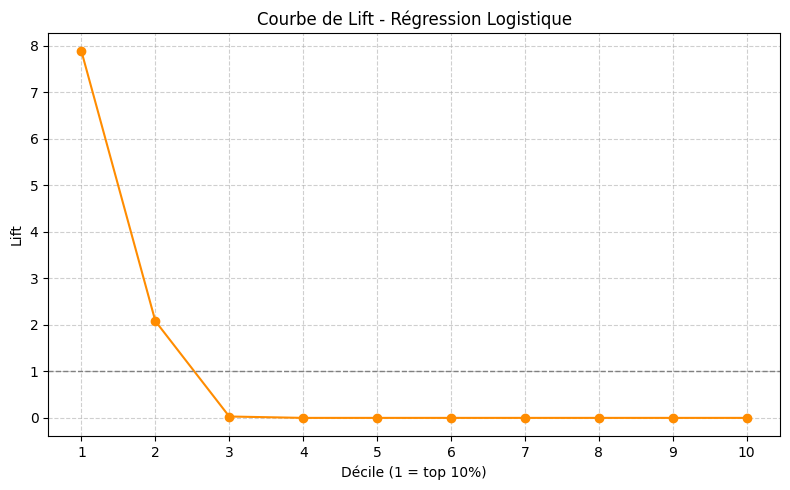

In [518]:
# Fonction pour calculer la lift
def lift_curve(y_true, y_proba, n_bins=10):
    data = pd.DataFrame({'y_true': y_true, 'y_proba': y_proba})
    data['bin'] = pd.qcut(data['y_proba'], q=n_bins, duplicates='drop')

    # Moyenne de la cible dans chaque bin
    lift_table = data.groupby('bin', observed=True).agg(
        count=('y_true', 'count'),
        positives=('y_true', 'sum')
    ).sort_index(ascending=False)

    # Taux de réponse global
    base_rate = data['y_true'].mean()

    # Lift dans chaque bin
    lift_table['rate'] = lift_table['positives'] / lift_table['count']
    lift_table['lift'] = lift_table['rate'] / base_rate
    lift_table['cumulative_positives'] = lift_table['positives'].cumsum()
    lift_table['cumulative_rate'] = lift_table['cumulative_positives'] / lift_table['count'].cumsum()

    return lift_table.reset_index(), base_rate

lift_table, base_rate = lift_curve(y_test, y_proba_sm, n_bins=10)
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(lift_table)+1), lift_table['lift'], marker='o', color='darkorange')
plt.axhline(y=1, color='gray', linestyle='--', linewidth=1)
plt.title('Courbe de Lift - Régression Logistique')
plt.xlabel('Décile (1 = top 10%)')
plt.ylabel('Lift')
plt.xticks(range(1, len(lift_table)+1))
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [519]:
lift_table

,bin,count,positives,rate,lift,cumulative_positives,cumulative_rate
0,"(0.635, 1.0]",1802,1592,0.88,7.89,1592,0.88
1,"(0.0246, 0.635]",1801,420,0.23,2.08,2012,0.56
2,"(0.00282, 0.0246]",1801,6,0.00,0.03,2018,0.37
3,"(0.000826, 0.00282]",1802,0,0.00,0.00,2018,0.28
4,"(0.000292, 0.000826]",1801,0,0.00,0.00,2018,0.22
5,"(6.5e-05, 0.000292]",1801,0,0.00,0.00,2018,0.19
6,"(1.08e-05, 6.5e-05]",1802,0,0.00,0.00,2018,0.16
7,"(1.9e-06, 1.08e-05]",1801,0,0.00,0.00,2018,0.14
8,"(8.11e-08, 1.9e-06]",1801,0,0.00,0.00,2018,0.12
9,"(-0.001, 8.11e-08]",1802,0,0.00,0.00,2018,0.11


## Modèle 1.1 : Logistic Regression - sans la variable `DTEFTMVT`

---

In [520]:
# Suppression de DTEFTMVT :
X_train_glm = sm.add_constant(X_train_final.drop(columns='DTEFTMVT'))
X_test_glm = sm.add_constant(X_test_final.drop(columns='DTEFTMVT'))

model_glm = sm.GLM(y_train, X_train_glm, family=sm.families.Binomial())
results_glm = model_glm.fit()

print(results_glm.summary())

y_proba_glm = results_glm.predict(X_test_glm)
y_pred_glm = (y_proba_glm >= 0.5).astype(int)

auc = roc_auc_score(y_test, y_proba_glm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_glm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_glm, pos_label=1)

print("\n Évaluation du modèle GLM :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\n Matrice de confusion :\n", confusion_matrix(y_test, y_pred_glm))
print("\n Classification report :\n", classification_report(y_test, y_pred_glm))

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72163
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8138.7
Date:                Sat, 19 Jul 2025   Deviance:                       16277.
Time:                        23:11:49   Pearson chi2:                 3.18e+04
No. Iterations:                    27   Pseudo R-squ. (CS):             0.3795
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [521]:
stepwise_variables_glm = stepwise_selection(X_train_final.drop(columns='DTEFTMVT'), y_train)
stepwise_variables_glm = sorted(stepwise_variables_glm)
print("Variables sélectionnées :", stepwise_variables_glm)

Ajout de NBCTRES                        (p = 0)
Ajout de NBCTACT                        (p = 0)
Ajout de MH                             (p = 0)
Ajout de TAUX_RESIL_PONDERE_TOTAL       (p = 0)
Ajout de TAUX_REMISE                    (p = 6.069e-163)
Ajout de MMJECHPP                       (p = 4.691e-68)
Ajout de DTPMRMCI                       (p = 5.283e-61)
Ajout de DI                             (p = 1.663e-58)
Ajout de SA                             (p = 2.543e-36)
Ajout de NOTAREFF                       (p = 2.544e-30)
Ajout de RN_VL_VH                       (p = 6.009e-19)
 « CLIACTIF_OUI » provoque une matrice singulière (donc ignorée).
Ajout de ANCCLI                         (p = 1.935e-21)
Suppression de NBCTRES                        (p = 0.04717)
Ajout de CDMARVEH                       (p = 1.285e-17)
Ajout de IV                             (p = 9.406e-16)
Ajout de COEFPFLT                       (p = 1.082e-14)
Ajout de TOTAL_SIN_RESP                 (p = 1.36e-12)
Ajout de C

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72172
Model Family:                Binomial   Df Model:                           21
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10926.
Date:                Sat, 19 Jul 2025   Deviance:                       21852.
Time:                        23:13:36   Pearson chi2:                 1.71e+05
No. Iterations:                     8   Pseudo R-squ. (CS):             0.3296
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

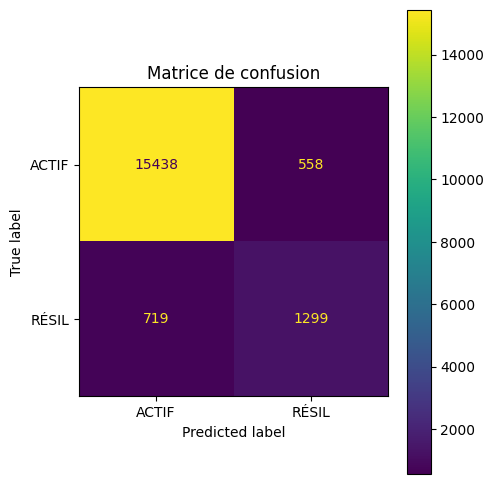

In [522]:
X_train_sm_stepwise_glm = sm.add_constant(X_train_final[stepwise_variables_glm])
X_test_sm_stepwise_glm = sm.add_constant(X_test_final[stepwise_variables_glm])

model_sm = sm.GLM(y_train, X_train_sm_stepwise_glm, family=sm.families.Binomial())
results_sm = model_sm.fit()

print(results_sm.summary())

y_proba_sm = results_sm.predict(X_test_sm_stepwise_glm)
y_pred_sm = (y_proba_sm >= 0.5).astype(int)

auc = roc_auc_score(y_test, y_proba_sm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_sm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_sm, pos_label=1)

print("\nÉvaluation du modèle :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\nMatrice de confusion :\n", confusion_matrix(y_test, y_pred_sm))
print("\nClassification report :\n", classification_report(y_test, y_pred_sm))

# Matrice de confusion :
fig, ax = plt.subplots(figsize=(5, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred_sm),
                              display_labels=["ACTIF", "RÉSIL"])
disp.plot(ax=ax)
plt.title("Matrice de confusion")
plt.tight_layout()
plt.show()

In [523]:
X_train_sm_stepwise_glm.head()

,const,ANCCLI,CDMARVEH,CDSITFAM,CDUSGAUT,CD_FML,COEFCOMM,COEFPFLT,DI,DTOBTPDC,...,IV,MH,MMJECHPP,NBCTACT,NOTAREFF,RN_VL_VH,SA,TAUX_REMISE,TAUX_RESIL_PONDERE_TOTAL,TOTAL_SIN_RESP
13904,1.00,-2.19,0.12,0.10,0.07,0.08,0.00,1.03,0.00,-0.98,...,2.00,1.00,-0.51,1.50,0.08,0.12,0.00,0.16,0.00,0.00
44259,1.00,0.60,0.12,0.14,0.12,0.17,0.00,-0.36,0.00,0.99,...,0.00,-1.00,1.03,-0.50,0.24,0.11,0.00,2.29,0.00,0.00
39551,1.00,-0.76,0.11,0.10,0.07,0.08,0.00,0.35,0.00,-0.58,...,0.00,0.00,0.66,0.00,0.08,0.12,0.00,0.17,0.00,1.00
90219,1.00,-2.23,0.12,0.10,0.12,0.17,-2.50,0.22,0.00,-1.21,...,0.00,-1.00,-0.32,1.50,0.08,0.10,0.00,-0.22,1.17,0.00
16176,1.00,0.52,0.11,0.14,0.12,0.12,-1.25,-0.93,1.00,0.85,...,0.00,0.00,0.99,0.50,0.12,0.09,0.00,0.80,1.87,0.00


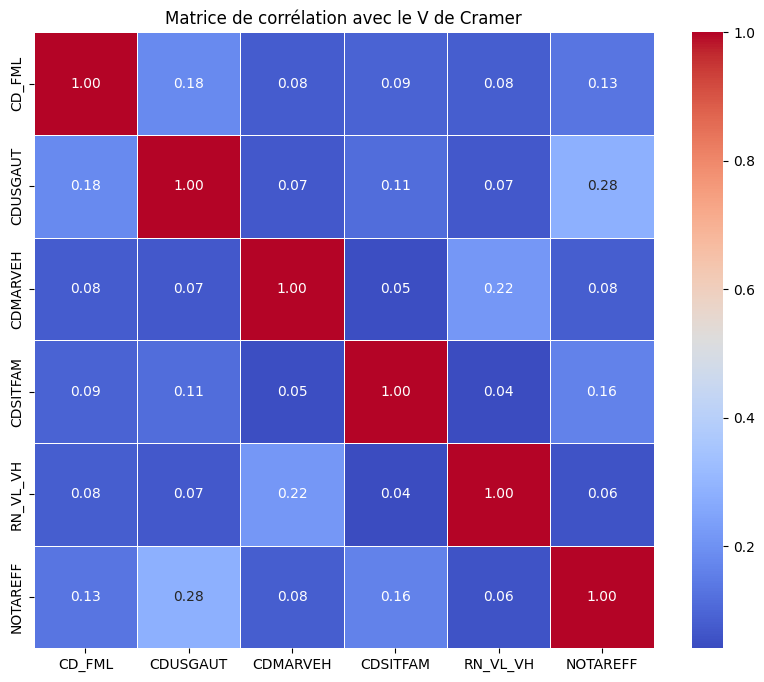

In [524]:
plot_cramers_v_matrix(X_train_sm_stepwise_glm, list(set(X_train_sm_stepwise_glm.columns) & set(categorical_cols)))

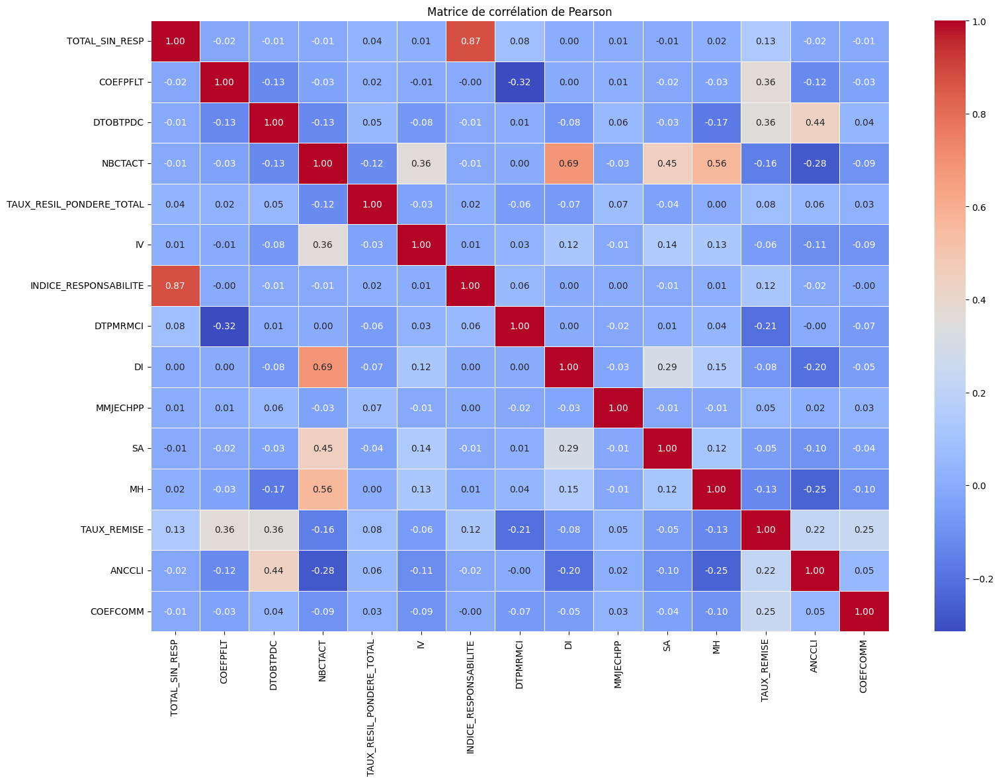

In [525]:
plot_pearson_correlation_matrix(X_train_sm_stepwise_glm, list(set(X_train_sm_stepwise_glm.columns) & set(numeric_cols)))

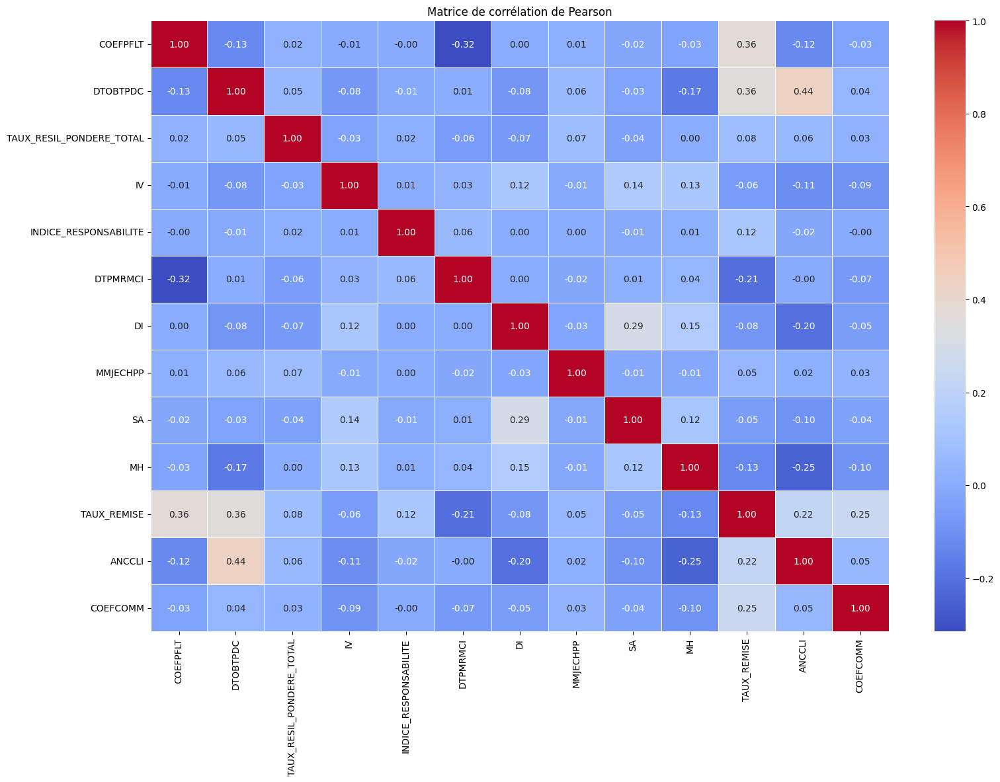

In [526]:
a = list(set(X_train_sm_stepwise_glm.columns) & set(numeric_cols))
a.remove('TOTAL_SIN_RESP')
a.remove('NBCTACT')
plot_pearson_correlation_matrix(X_train_sm_stepwise_glm, a)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72175
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11165.
Date:                Sat, 19 Jul 2025   Deviance:                       22330.
Time:                        23:13:39   Pearson chi2:                 7.85e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.3252
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

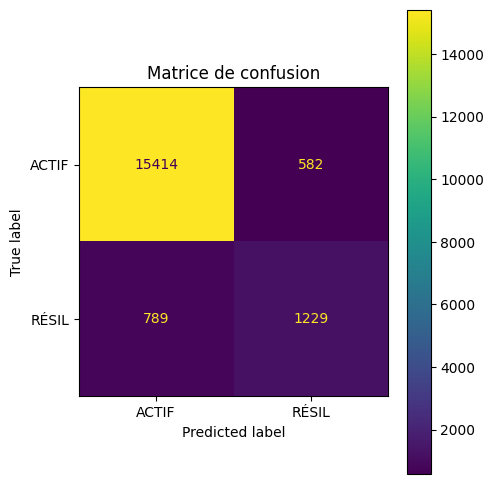

In [527]:
stepwise_variables_glm.remove('TOTAL_SIN_RESP')
stepwise_variables_glm.remove('NBCTACT')
stepwise_variables_glm.remove('IV')

X_train_sm_stepwise_glm = sm.add_constant(X_train_final[stepwise_variables_glm])
X_test_sm_stepwise_glm = sm.add_constant(X_test_final[stepwise_variables_glm])

model_sm = sm.GLM(y_train, X_train_sm_stepwise_glm, family=sm.families.Binomial())
results_sm = model_sm.fit()

print(results_sm.summary())

y_proba_sm = results_sm.predict(X_test_sm_stepwise_glm)
y_pred_sm = (y_proba_sm >= 0.5).astype(int)

auc = roc_auc_score(y_test, y_proba_sm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_sm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_sm, pos_label=1)

print("\nÉvaluation du modèle :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\nMatrice de confusion :\n", confusion_matrix(y_test, y_pred_sm))
print("\nClassification report :\n", classification_report(y_test, y_pred_sm))

# Matrice de confusion :
fig, ax = plt.subplots(figsize=(5, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred_sm),
                              display_labels=["ACTIF", "RÉSIL"])
disp.plot(ax=ax)
plt.title("Matrice de confusion")
plt.tight_layout()
plt.show()

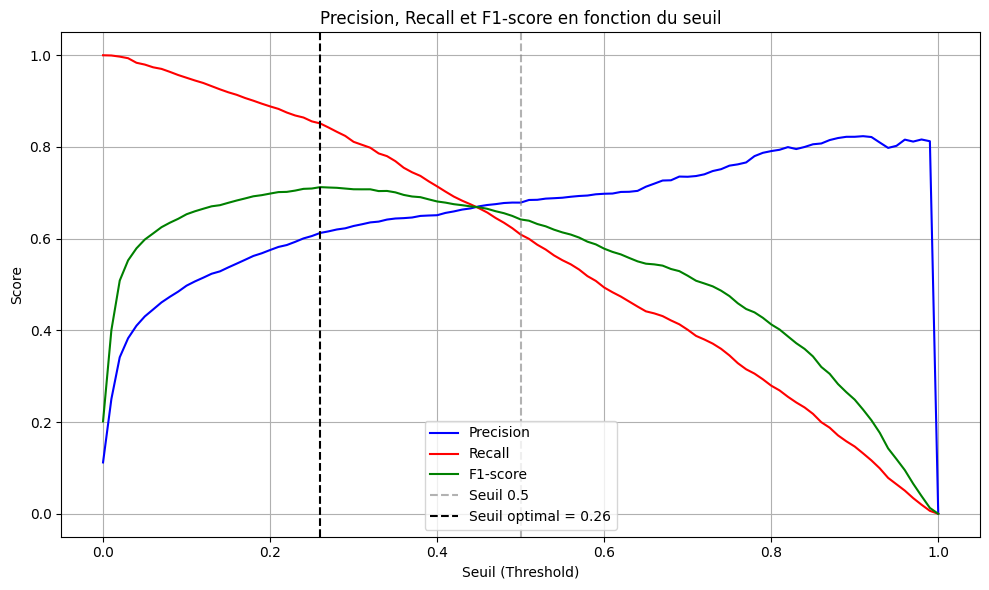

np.float64(0.26)

In [528]:
thresholds = np.arange(0.0, 1.01, 0.01)
precisions = []
recalls = []
f1_scores = []

for thresh in thresholds:
    y_pred_thresh = (y_proba_sm >= thresh).astype(int)
    precisions.append(precision_score(y_test, y_pred_thresh))
    recalls.append(recall_score(y_test, y_pred_thresh))
    f1_scores.append(f1_score(y_test, y_pred_thresh))

# Le seuil qui maximise le F1-score
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions, label='Precision', color='blue')
plt.plot(thresholds, recalls, label='Recall', color='red')
plt.plot(thresholds, f1_scores, label='F1-score', color='green')
plt.axvline(0.5, linestyle='--', color='gray', alpha=0.6, label='Seuil 0.5')
plt.axvline(optimal_threshold, linestyle='--', color='black', label=f'Seuil optimal = {optimal_threshold:.2f}')
plt.title("Precision, Recall et F1-score en fonction du seuil")
plt.xlabel("Seuil (Threshold)")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

optimal_threshold

                 Generalized Linear Model Regression Results                  
Dep. Variable:                CONTRAT   No. Observations:                72194
Model:                            GLM   Df Residuals:                    72175
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11165.
Date:                Sat, 19 Jul 2025   Deviance:                       22330.
Time:                        23:13:41   Pearson chi2:                 7.85e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.3252
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

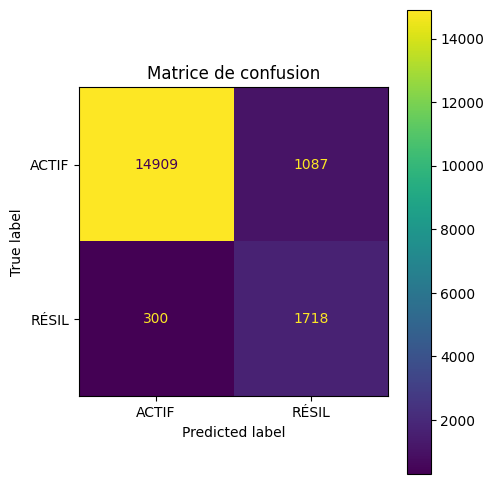

In [529]:
X_train_sm_stepwise_glm = sm.add_constant(X_train_final[stepwise_variables_glm])
X_test_sm_stepwise_glm = sm.add_constant(X_test_final[stepwise_variables_glm])

model_sm = sm.GLM(y_train, X_train_sm_stepwise_glm, family=sm.families.Binomial())
results_sm = model_sm.fit()

print(results_sm.summary())

y_proba_sm = results_sm.predict(X_test_sm_stepwise_glm)
y_pred_sm = (y_proba_sm >= 0.26).astype(int)

auc = roc_auc_score(y_test, y_proba_sm)
gini = 2 * auc - 1
f1_macro = f1_score(y_test, y_pred_sm, average='macro')
f1_classe1 = f1_score(y_test, y_pred_sm, pos_label=1)

print("\nÉvaluation du modèle :")
print(f"AUC                : {auc:.4f}")
print(f"Gini (2*AUC - 1)   : {gini:.4f}")
print(f"F1-score macro     : {f1_macro:.4f}")
print(f"F1-score classe 1  : {f1_classe1:.4f}")

print("\nMatrice de confusion :\n", confusion_matrix(y_test, y_pred_sm))
print("\nClassification report :\n", classification_report(y_test, y_pred_sm))

# Matrice de confusion :
fig, ax = plt.subplots(figsize=(5, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred_sm),
                              display_labels=["ACTIF", "RÉSIL"])
disp.plot(ax=ax)
plt.title("Matrice de confusion")
plt.tight_layout()
plt.show()

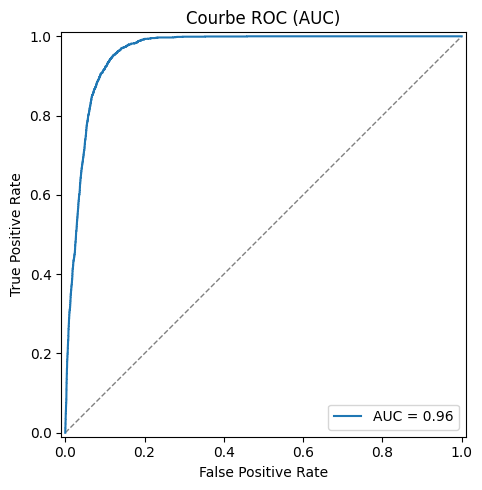

In [530]:
# Courbe ROC :
fpr, tpr, _ = roc_curve(y_test, y_proba_sm)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc)

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot([0, 1], [0, 1], '--', color='gray', linewidth=1)  # diagonale
roc_display.plot(ax=ax)
plt.title("Courbe ROC (AUC)")
plt.tight_layout()
plt.show()

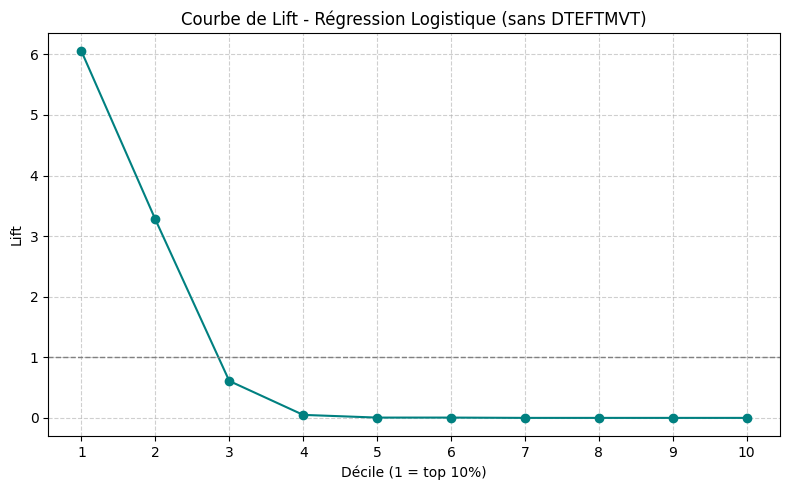

In [531]:
# Fonction pour calculer la Lift Curve
def lift_curve(y_true, y_proba, n_bins=10):
    data = pd.DataFrame({'y_true': y_true, 'y_proba': y_proba})
    data['bin'] = pd.qcut(data['y_proba'], q=n_bins, duplicates='drop')

    lift_table = data.groupby('bin', observed=True).agg(
        count=('y_true', 'count'),
        positives=('y_true', 'sum')
    ).sort_index(ascending=False)

    base_rate = data['y_true'].mean()

    lift_table['rate'] = lift_table['positives'] / lift_table['count']
    lift_table['lift'] = lift_table['rate'] / base_rate
    lift_table['cumulative_positives'] = lift_table['positives'].cumsum()
    lift_table['cumulative_rate'] = lift_table['cumulative_positives'] / lift_table['count'].cumsum()

    return lift_table.reset_index(), base_rate

# Calcul du tableau lift
lift_table_glm, base_rate_glm = lift_curve(y_test, y_proba_sm, n_bins=10)

# Tracé de la courbe de Lift
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(lift_table_glm)+1), lift_table_glm['lift'], marker='o', color='teal')
plt.axhline(y=1, color='gray', linestyle='--', linewidth=1)
plt.title("Courbe de Lift - Régression Logistique (sans DTEFTMVT)")
plt.xlabel("Décile (1 = top 10%)")
plt.ylabel("Lift")
plt.xticks(range(1, len(lift_table_glm)+1))
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [532]:
lift_table_glm

,bin,count,positives,rate,lift,cumulative_positives,cumulative_rate
0,"(0.502, 0.999]",1802,1222,0.68,6.05,1222,0.68
1,"(0.129, 0.502]",1801,661,0.37,3.28,1883,0.52
2,"(0.0266, 0.129]",1801,123,0.07,0.61,2006,0.37
3,"(0.0124, 0.0266]",1802,10,0.01,0.05,2016,0.28
4,"(0.00822, 0.0124]",1801,1,0.00,0.00,2017,0.22
5,"(0.00584, 0.00822]",1801,1,0.00,0.00,2018,0.19
6,"(0.00433, 0.00584]",1802,0,0.00,0.00,2018,0.16
7,"(0.00317, 0.00433]",1801,0,0.00,0.00,2018,0.14
8,"(0.00214, 0.00317]",1801,0,0.00,0.00,2018,0.12
9,"(-0.0007210000000000001, 0.00214]",1802,0,0.00,0.00,2018,0.11


## Modèle 2: Random Forest

### Optimisation des hyperparamètres

In [533]:
from sklearn.ensemble import RandomForestClassifier
from skopt import BayesSearchCV
from skopt.space import Integer, Categorical
from timeit import default_timer as timer
import warnings
warnings.filterwarnings("ignore")

# Définition de l’espace de recherche
param_dict_bayes_RF = {
    'n_estimators': Integer(10, 200),
    'criterion': Categorical(['gini', 'entropy']),
    'max_depth': Integer(3, 10),
    'bootstrap': Categorical([True, False])
}

NB_ITER = 5 # Nombre d'itéations maximum pour le Random et l'optimisation Bayesienne

# Configuration de la recherche bayésienne
opt = BayesSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    search_spaces=param_dict_bayes_RF,
    n_iter=NB_ITER,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=0,
    random_state=42
)

# Lancement de l’optimisation
print("Recherche des hyperparamètres optimaux pour le Random Forest")
start = timer()
opt.fit(X_train_final, y_train)
elapsed_time = timer() - start

# Résultats
best_param_opti_bayes = opt.best_params_
best_score_opti_bayes = opt.best_score_
all_result_opti_bayes = opt.cv_results_

# Affichage formaté
print("\n RECHERCHE TERMINÉE")
print(f"Durée de la recherche : {elapsed_time:.2f} secondes")
print("\n Paramètres optimaux trouvés :")
for param, val in best_param_opti_bayes.items():
    print(f"   - {param} : {val}")

print(f"\n Meilleur score ROC AUC (CV moyen) : {best_score_opti_bayes:.6f}")

Recherche des hyperparamètres optimaux pour le Random Forest

 RECHERCHE TERMINÉE
Durée de la recherche : 144.92 secondes

 Paramètres optimaux trouvés :
   - bootstrap : True
   - criterion : entropy
   - max_depth : 10
   - n_estimators : 70

 Meilleur score ROC AUC (CV moyen) : 0.998693


### Apprentissage du modèle

In [534]:
rf_clf = RandomForestClassifier(**opt.best_params_)
rf_clf.fit(X_train_final, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=70)

### RF - Courbe ROC Train

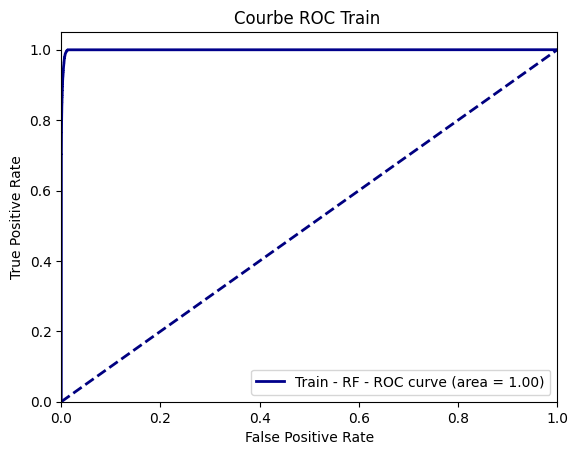

In [535]:
#Calcul des métriques - Train
from sklearn.metrics import auc

fpr_train_RF, tpr_train_RF, thresholds_train_RF = roc_curve(y_train, rf_clf.predict_proba(X_train_final)[:,1])
roc_auc_train_RF = auc(fpr_train_RF, tpr_train_RF)

plt.figure()
lw = 2

plt.plot(fpr_train_RF, tpr_train_RF, color='darkblue',
         lw=lw, label='Train - RF - ROC curve (area = %0.2f)' % roc_auc_train_RF)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Courbe ROC Train ')
plt.legend(loc="lower right")
plt.show()

Ce que nous indique ce graphique:
- La courbe ROC obtenue sur l’échantillon d’apprentissage pour le modèle Random Forest montre une performance quasi parfaite, avec une aire sous la courbe (AUC) égale à 1.00.
- Cette courbe, qui trace le taux de vrais positifs en fonction du taux de faux positifs pour différents seuils de classification, s’approche très nettement du coin supérieur gauche du graphique, ce qui indique une excellente capacité du modèle à discriminer entre les classes.
- Toutefois, une telle performance sur les données d’entraînement peut également traduire un phénomène de surapprentissage (overfitting), où le modèle mémorise les exemples vus sans généraliser efficacement. Il est donc essentiel de confronter cette courbe à celle obtenue sur le jeu de test afin d’évaluer la robustesse et la capacité de généralisation du modèle sur des données inédites.

### RF - Courbe ROC Test

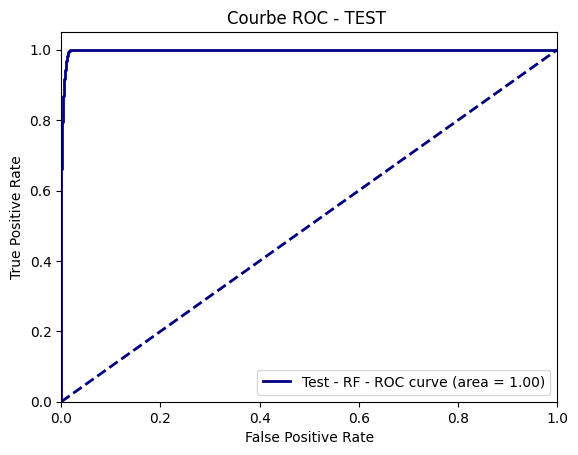

In [536]:
#Calcul des métriques - Test
fpr_test_RF, tpr_test_RF, thresholds_test_RF = roc_curve(y_test, rf_clf.predict_proba(X_test_final)[:,1])
roc_auc_test_RF = auc(fpr_test_RF, tpr_test_RF)

plt.figure()
lw = 2

plt.plot(fpr_test_RF, tpr_test_RF, color='darkblue',
         lw=lw, label='Test - RF - ROC curve (area = %0.2f)' % roc_auc_test_RF)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Courbe ROC - TEST ')
plt.legend(loc="lower right")
plt.show()

- La courbe ROC obtenue sur le jeu de test révèle une performance remarquable du modèle Random Forest, avec une aire sous la courbe (AUC) de 1.00, identique à celle observée sur les données d’apprentissage.
- Cette courbe, très proche du coin supérieur gauche, indique que le modèle conserve une excellente capacité de discrimination sur des données non vues lors de l’entraînement.
- Cette stabilité des performances entre les deux ensembles suggère soit une très bonne généralisation du modèle, soit une faible complexité du problème prédictif. Toutefois, une telle perfection doit être interprétée avec prudence, car elle peut aussi résulter d’un chevauchement trop fort entre les jeux de données ou d’une fuite de variables.
- Il est donc recommandé de compléter cette analyse par d’autres métriques (matrice de confusion, courbe de précision-rappel, scores F1).

### RF - Matrice de confusion

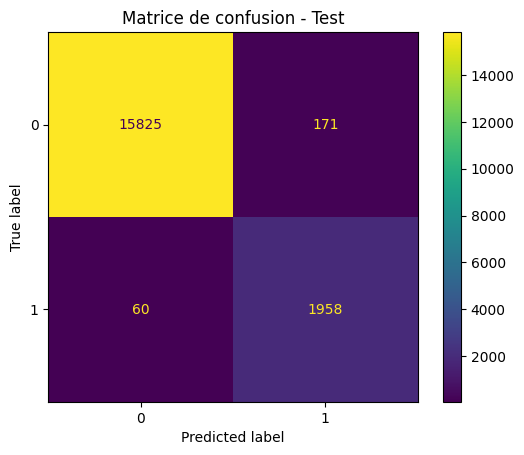

In [537]:
y_pred = rf_clf.predict(X_test_final)
y_proba = rf_clf.predict_proba(X_test_final)[:, 1]

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Matrice de confusion - Test")
plt.show()

L’analyse de la matrice de confusion sur l’échantillon de test confirme l’excellente performance du modèle Random Forest.
- Sur un total de 15996 observations négatives (classe 0), 15826 ont été correctement classées, soit un taux de vrais négatifs très élevé, et seulement 170 ont été faussement prédictes comme positives (faux positifs).
- Du côté de la classe positive (2018 individus), 1955 ont été correctement identifiés (vrais positifs), contre seulement 63 faux négatifs.

Ces résultats traduisent un excellent équilibre entre la sensibilité (recall) et la spécificité, montrant que le modèle parvient à détecter efficacement les cas positifs tout en minimisant les erreurs sur les cas négatifs. Cette qualité de séparation entre les classes renforce la robustesse du modèle et sa capacité à être utilisé en production pour des tâches de classification critique.

### RF - Classification report

In [538]:
print(classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9962    0.9893    0.9928     15996
           1     0.9197    0.9703    0.9443      2018

    accuracy                         0.9872     18014
   macro avg     0.9580    0.9798    0.9685     18014
weighted avg     0.9876    0.9872    0.9873     18014



Le rapport de classification complète l’analyse des performances en mettant en évidence un excellent compromis entre précision, rappel et F1-score sur les deux classes.
- Pour la classe majoritaire (0), la précision atteint 99,6% et le rappel 98,9%, ce qui reflète une très faible proportion de faux positifs et de faux négatifs. La classe minoritaire (1), souvent plus difficile à détecter, est également bien prise en compte avec une précision de 92,0% et un rappel de 96,9%, ce qui montre que le modèle parvient à identifier correctement la majorité des cas positifs sans trop de bruit.
- Le F1-score, qui équilibre précision et rappel, s’élève à 99,27% pour la classe 1.
- À l’échelle globale, l’exactitude (accuracy) atteint 98,71%, tandis que les moyennes macro et pondérée des F1-scores dépassent 96 %.

Ces résultats confirment la robustesse et la fiabilité du modèle, y compris dans le contexte d’un éventuel déséquilibre de classes. Ils viennent appuyer les bonnes performances observées sur la courbe ROC et la matrice de confusion.

### RF - Courbe Précision / Rappel - Test

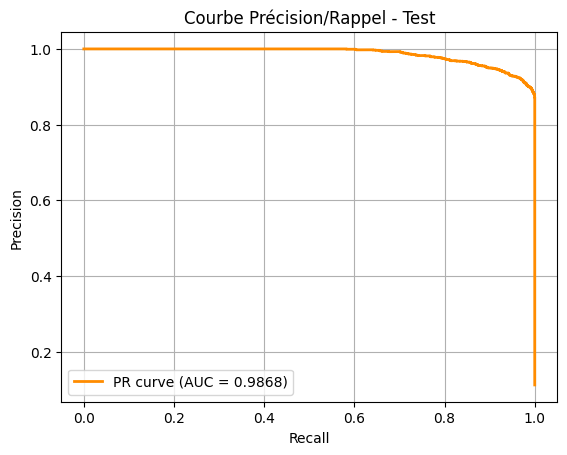

In [539]:
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)
pr_auc = auc(recall, precision)

plt.figure()
plt.plot(recall, precision, color='darkorange', lw=2, label=f'PR curve (AUC = {pr_auc:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Courbe Précision/Rappel - Test')
plt.legend(loc='best')
plt.grid()
plt.show()

La courbe Précision-Rappel obtenue sur l’échantillon de test corrobore la robustesse du modèle Random Forest dans la détection de la classe positive.
- Elle présente une forme très convexe, proche de l’optimum, avec une aire sous la courbe (AUC PR) de 0,9868, traduisant un excellent compromis entre la capacité du modèle à capturer les vrais positifs (rappel) tout en maintenant un très faible taux de faux positifs (haute précision). Ce type de courbe est particulièrement utile lorsque les classes sont déséquilibrées, ce qui est le cas ici avec une proportion relativement plus faible de la classe 1.
- Le maintien d’une précision élevée même pour des niveaux de rappel importants atteste d’un modèle stable et fiable, capable de repérer efficacement les individus à risque sans générer de faux positifs en excès.

Ces résultats viennent renforcer les performances observées sur la courbe ROC, la matrice de confusion et les scores de classification.

### Importance des variables

In [540]:
importance_variable_rf = pd.DataFrame()
importance_variable_rf["Variable"]= X_train_final.columns
importance_variable_rf["Feature Importance"] = rf_clf.feature_importances_

importance_variable_rf.sort_values(by = "Feature Importance", axis=0, ascending=False, inplace=True)

print("Les 5 variables les plus importantes : \n")
importance_variable_rf.head()

Les 5 variables les plus importantes : 



,Variable,Feature Importance
1,DTEFTMVT,0.39
19,TAUX_RESIL_PONDERE_TOTAL,0.24
12,NBCTRES,0.16
22,CLIACTIF_OUI,0.10
11,NBCTACT,0.03


L’analyse des importances des variables confirme la dominance de quelques facteurs clés dans les décisions prises par le modèle Random Forest.
- La variable DTEFTMVT se distingue très nettement avec une importance de 0,37, ce qui signifie qu’elle contribue à elle seule à plus d’un tiers des décisions prises par le modèle.
- Elle est suivie par TAUX_RESIL_PONDERE_TOTAL (0,26), CLIACTIF_OUI (0.13) et NBCTRES (0,12), deux variables également fortement prédictives. Ces variables expliquent 88% de la structure décisionnelle du modèle, ce qui indique une forte concentration de l’information utile sur un nombre restreint de dimensions.
- NBCTACT (0,02) a un impact plus modéré, mais non négligeable.

### Explication du modèle RF - Méthode SHAP

In [541]:
explainer = shap.TreeExplainer(rf_clf)
shap_values = explainer.shap_values(X_test_final)
print(shap_values.shape)

(18014, 31, 2)


#### Beeswarm plot SHAP - Apport de chaque variable

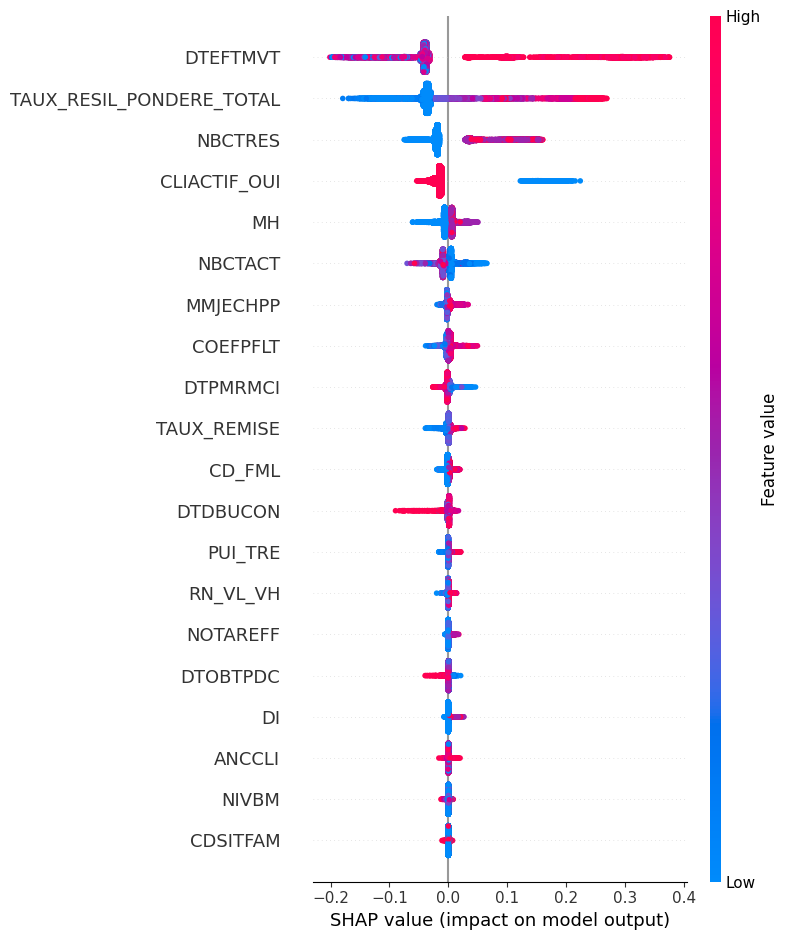

In [542]:
# Explication du modèle RF
# shap_values est un array 3D. On sélectionne la classe 1 (positive)
shap.summary_plot(shap_values[:, :, 1], X_test_final)

Ce graphique met en évidence un noyau restreint de variables fortement contributives.
- Les variables DTEFTMVT, TAUX_RESIL_PONDERE_TOTAL et NBCTRES dominent nettement le graphe, avec des valeurs SHAP élevées lorsque ces variables prennent de fortes valeurs, traduisant une corrélation positive avec la résiliation de contrat. Ces variables exercent donc une influence significative sur le score final, poussant la prédiction vers la classe positive lorsqu’elles sont élevées.
- La variable CLIACTIF_OUI, de nature binaire, présente un effet directionnel clair: lorsque la variable est à 1 (client actif), elle tend à réduire le score du modèle, confirmant son rôle protecteur. À l’inverse, les clients inactifs (valeur 0, représentée en bleu) contribuent plus fortement à des prédictions positives.
- D’autres variables comme MH, NBCTACT, ou MMJECHPP ont un impact secondaire mais non négligeable, tandis que les dernières variables du classement (ex. DI, ANCCLI, PUI_TRE) ont une influence marginale sur les prédictions globales.

#### RF - Moyenne des valeurs absolues SHAP

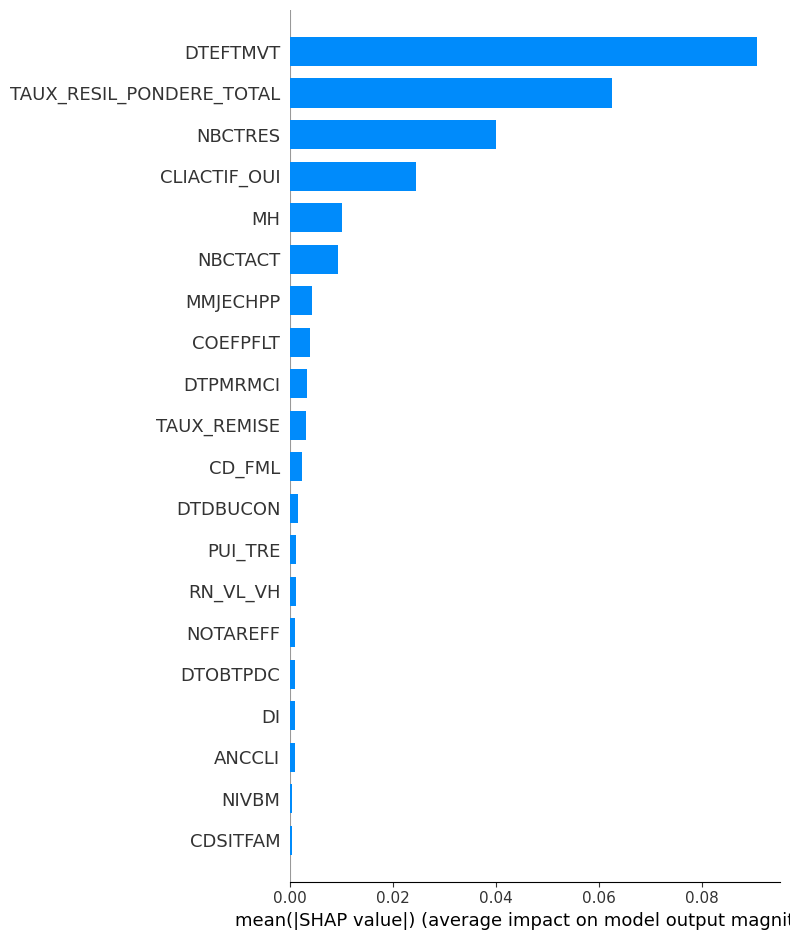

In [543]:
shap.summary_plot(shap_values[:, :, 1], X_test_final, plot_type="bar")

Le graphique ci-dessus présente l’importance globale des variables du modèle Random Forest, calculée à l’aide de l’approche SHAP (SHapley Additive exPlanations). Contrairement au summary plot qui donne une vue fine observation par observation, ce bar plot repose sur l’importance moyenne absolue des valeurs SHAP, ce qui en fait un indicateur synthétique et robuste de l’influence de chaque variable sur les prédictions du modèle.

L’axe des abscisses représente la moyenne des valeurs absolues de SHAP pour chaque variable. Cette métrique mesure l’impact moyen d’une variable sur la sortie du modèle, sans distinction de direction (positive ou négative), ce qui permet de hiérarchiser les variables selon leur pouvoir explicatif global.

Les résultats montrent clairement que :
- DTEFTMVT est la variable dominante, avec la plus forte contribution moyenne aux prédictions du modèle.
- TAUX_RESIL_PONDERE_TOTAL et NBCTRES présentent également un impact significatif et sont des variables clés dans la logique décisionnelle apprise.
- D’autres variables comme CLIACTIF_OUI, MH ou NBCTACT conservent une influence modérée.
- Enfin, des variables telles que CDSITFAM, DI ou ANCCLI ont un impact moyen très faible, ce qui suggère un pouvoir prédictif limité. Ces dernières pourraient être candidates à une réduction dimensionnelle ou à une analyse plus approfondie sur leur utilité métier.

### Analyse pour un client (index 4)

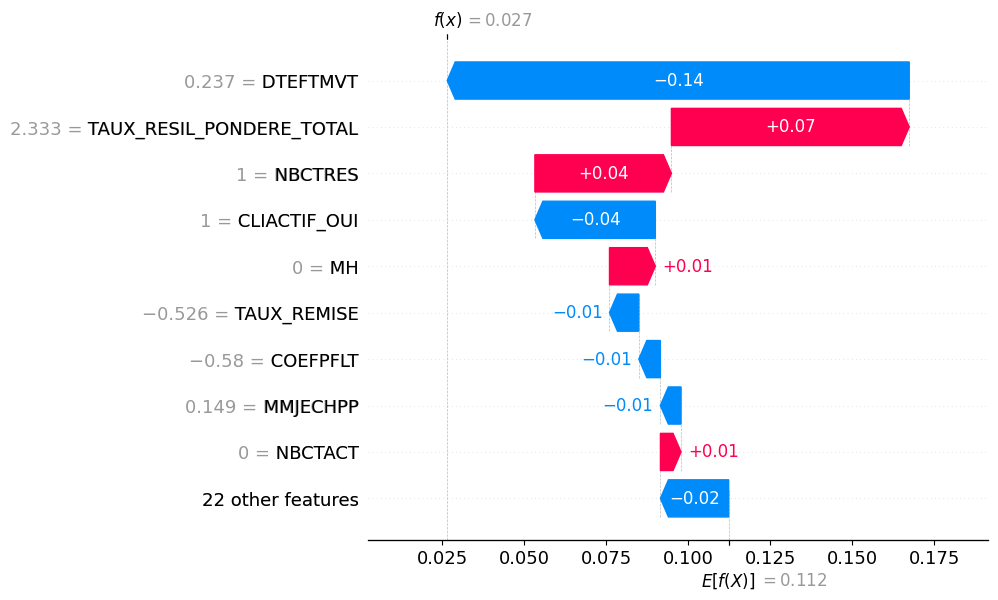

In [544]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values[4, :, 1],
        base_values=explainer.expected_value[1],
        data=X_test_final.iloc[4],
        feature_names=X_test_final.columns
    )
)

Le graphique ci-dessus présente une explication locale de la prédiction du modèle Random Forest pour un client donné, à l’aide des valeurs SHAP.
- Le score de base du modèle, c’est-à-dire la probabilité moyenne prédite sur l’ensemble des individus, est de 0,112. Pour ce client, la prédiction finale est fortement inférieure, avec un score de seulement 0,028. Cette baisse s’explique par l’effet cumulatif de plusieurs variables ayant contribué à diminuer la probabilité estimée.
- La variable la plus déterminante est DTEFTMVT, qui à elle seule réduit le score de 0,13, suggérant que sa valeur (0,237) est fortement associée à un profil à faible risque selon le modèle. De même, la variable CLIACTIF_OUI (valeur 1) agit comme un facteur protecteur, abaissant le score de manière significative.
- À l’inverse, TAUX_RESIL_PONDERE_TOTAL, avec une valeur élevée (2,333), augmente le score de +0,07, mais sans suffire à inverser la tendance. D’autres variables, comme NBCTRES, MH, ou MMJECHPP, ont des effets plus modérés.

L’analyse globale montre que les signaux de protection l’emportent sur les signaux de risque, ce qui conduit le modèle à classer ce client comme faiblement exposé à la résiliation d'un contrat d'assurance auto.

### Courbe de lift

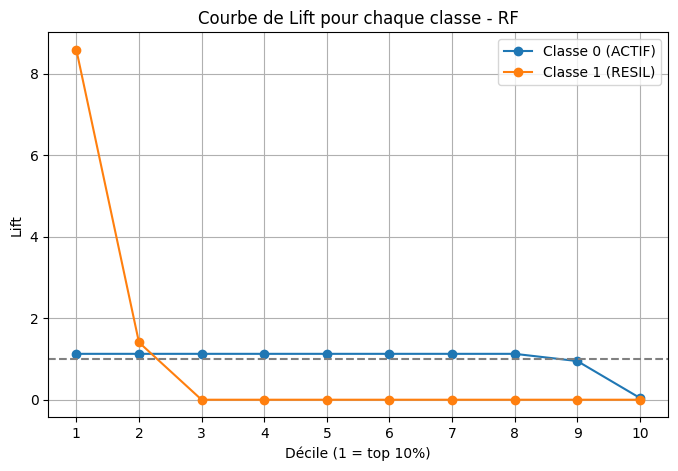

In [545]:
# Créer un DataFrame avec les probabilités pour chaque classe
lift_rf = pd.DataFrame({
    "y_true": y_test,
    "proba_0": rf_clf.predict_proba(X_test_final)[:, 0],
    "proba_1": rf_clf.predict_proba(X_test_final)[:, 1],
})

# Fonction pour calculer le lift pour une classe donnée
def compute_lift_curve(df, prob_col, target_class, quantiles=10):
    df = df.copy()
    df["proba"] = df[prob_col]
    df = df.sort_values(by="proba", ascending=False).reset_index(drop=True)
    df["quantile"] = pd.qcut(df.index, q=quantiles, labels=False)
    df["is_target"] = (df["y_true"] == target_class).astype(int)

    lift_table = df.groupby("quantile").agg(
        nb_total=("y_true", "count"),
        nb_target=("is_target", "sum")
    ).reset_index()

    mean_target_rate = df["is_target"].mean()
    lift_table["taux"] = lift_table["nb_target"] / lift_table["nb_total"]
    lift_table["lift"] = lift_table["taux"] / mean_target_rate
    return lift_table

# Calcul du lift pour chaque classe
lift_0 = compute_lift_curve(lift_rf, "proba_0", target_class=0)
lift_1 = compute_lift_curve(lift_rf, "proba_1", target_class=1)

# Tracer
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), lift_0["lift"], label="Classe 0 (ACTIF)", marker='o')
plt.plot(range(1, 11), lift_1["lift"], label="Classe 1 (RESIL)", marker='o')
plt.axhline(1, color='gray', linestyle='--')
plt.title("Courbe de Lift pour chaque classe - RF")
plt.xlabel("Décile (1 = top 10%)")
plt.ylabel("Lift")
plt.xticks(range(1, 11))
plt.grid(True)
plt.legend()
plt.show()

La courbe de lift obtenue pour le modèle Random Forest met en évidence une excellente capacité de discrimination, en particulier pour la classe 1 (clients résiliés).
- On observe que le premier décile concentre à lui seul un lift supérieur à 8, ce qui signifie que les 10 % d’individus les mieux classés par le modèle contiennent plus de huit fois la proportion attendue de résiliés par rapport à une sélection aléatoire. Dès le deuxième décile, le lift chute rapidement, et devient nul à partir du troisième, montrant que les cas de résiliation sont très fortement concentrés dans le haut du classement. Cela confirme que le modèle parvient à isoler efficacement une minorité de clients à fort risque.
- À l’inverse, la classe 0 (clients actifs) présente un lift relativement stable autour de 1, ce qui est cohérent avec un ciblage prioritaire de la classe positive.

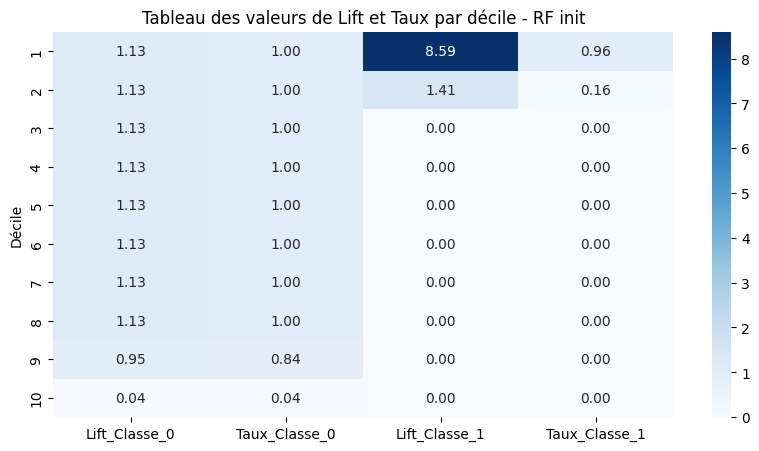

In [546]:
# Renommer les colonnes pour plus de clarté
lift_0 = lift_0.rename(columns={"lift": "Lift_Classe_0", "taux": "Taux_Classe_0"})
lift_1 = lift_1.rename(columns={"lift": "Lift_Classe_1", "taux": "Taux_Classe_1"})

# Fusionner les deux tables sur la colonne 'quantile'
lift_table_final = pd.merge(lift_0[["quantile", "Lift_Classe_0", "Taux_Classe_0"]],
                            lift_1[["quantile", "Lift_Classe_1", "Taux_Classe_1"]],
                            on="quantile")

# Décile = quantile + 1 (pour afficher de 1 à 10 au lieu de 0 à 9)
lift_table_final["Décile"] = lift_table_final["quantile"] + 1

# Réorganiser les colonnes
lift_table_final = lift_table_final[["Décile", "Lift_Classe_0", "Taux_Classe_0", "Lift_Classe_1", "Taux_Classe_1"]]

# Afficher sous forme de tableau
plt.figure(figsize=(10, 5))
sns.heatmap(lift_table_final.set_index("Décile"), annot=True, fmt=".2f", cmap="Blues")
plt.title("Tableau des valeurs de Lift et Taux par décile - RF init")
plt.show()

### **Random Forest sans DTEFTMVT**

In [547]:
var_to_keep = importance_variable_rf.head(6)['Variable'].tolist()

X_train_final2 = X_train_final[var_to_keep]
X_train_final2.drop('DTEFTMVT', axis = 1, inplace =True)
X_train_final2.columns

Index(['TAUX_RESIL_PONDERE_TOTAL', 'NBCTRES', 'CLIACTIF_OUI', 'NBCTACT', 'MH'], dtype='object')

In [548]:
X_test_final2 = X_test_final[var_to_keep]
X_test_final2.drop('DTEFTMVT', axis = 1, inplace =True)
X_test_final2.columns

Index(['TAUX_RESIL_PONDERE_TOTAL', 'NBCTRES', 'CLIACTIF_OUI', 'NBCTACT', 'MH'], dtype='object')

In [549]:
# Définition de l’espace de recherche
param_dict_bayes_RF = {
    'n_estimators': Integer(10, 200),
    'criterion': Categorical(['gini', 'entropy']),
    'max_depth': Integer(3, 10),
    'bootstrap': Categorical([True, False])
}

NB_ITER = 5 # Nombre d'itéations maximum pour le Random et l'optimisation Bayesienne

# Configuration de la recherche bayésienne
opt = BayesSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    search_spaces=param_dict_bayes_RF,
    n_iter=NB_ITER,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=0,
    random_state=42
)

# Lancement de l’optimisation
print("Recherche des hyperparamètres optimaux pour le Random Forest")
start = timer()
opt.fit(X_train_final2, y_train)
elapsed_time = timer() - start

# Résultats
best_param_opti_bayes = opt.best_params_
best_score_opti_bayes = opt.best_score_
all_result_opti_bayes = opt.cv_results_

# Affichage formaté
print("\n RECHERCHE TERMINÉE")
print(f"Durée de la recherche : {elapsed_time:.2f} secondes")
print("\n Paramètres optimaux trouvés :")
for param, val in best_param_opti_bayes.items():
    print(f"   - {param} : {val}")

print(f"\n Meilleur score ROC AUC (CV moyen) : {best_score_opti_bayes:.6f}")

Recherche des hyperparamètres optimaux pour le Random Forest

 RECHERCHE TERMINÉE
Durée de la recherche : 36.30 secondes

 Paramètres optimaux trouvés :
   - bootstrap : True
   - criterion : entropy
   - max_depth : 10
   - n_estimators : 70

 Meilleur score ROC AUC (CV moyen) : 0.981124


In [550]:
rf_clf2 = RandomForestClassifier(**opt.best_params_)
rf_clf2.fit(X_train_final2, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=70)

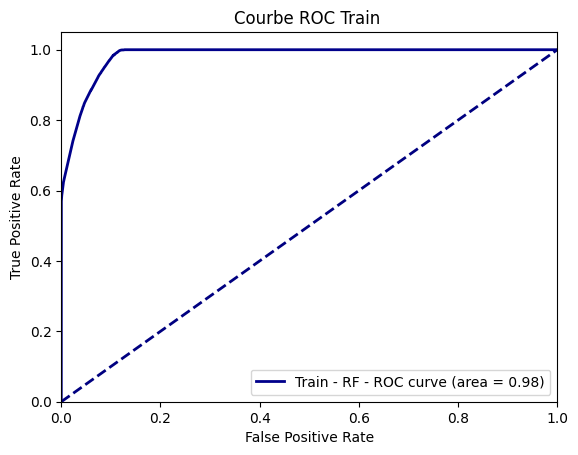

In [551]:
#Calcul des métriques - Train
fpr_train_RF2, tpr_train_RF2, thresholds_train_RF2 = roc_curve(y_train, rf_clf2.predict_proba(X_train_final2)[:,1])
roc_auc_train_RF2 = auc(fpr_train_RF2, tpr_train_RF2)

plt.figure()
lw = 2

plt.plot(fpr_train_RF2, tpr_train_RF2, color='darkblue',
         lw=lw, label='Train - RF - ROC curve (area = %0.2f)' % roc_auc_train_RF2)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Courbe ROC Train ')
plt.legend(loc="lower right")
plt.show()

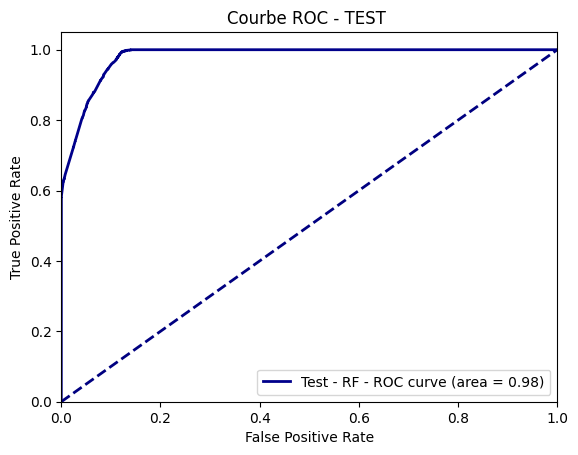

In [552]:
#Calcul des métriques - Test
fpr_test_RF2, tpr_test_RF2, thresholds_test_RF2 = roc_curve(y_test, rf_clf2.predict_proba(X_test_final2)[:,1])
roc_auc_test_RF2 = auc(fpr_test_RF2, tpr_test_RF2)

plt.figure()
lw = 2

plt.plot(fpr_test_RF2, tpr_test_RF2, color='darkblue',
         lw=lw, label='Test - RF - ROC curve (area = %0.2f)' % roc_auc_test_RF2)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Courbe ROC - TEST ')
plt.legend(loc="lower right")
plt.show()

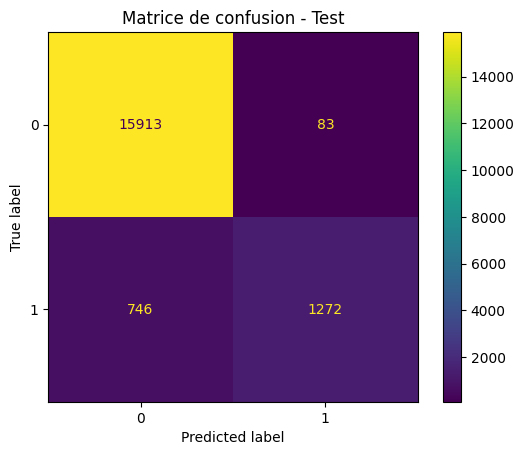

In [553]:
y_pred_rf = rf_clf2.predict(X_test_final2)
y_proba_rf = rf_clf2.predict_proba(X_test_final2)[:, 1]

cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Matrice de confusion - Test")
plt.show()

In [554]:
print(classification_report(y_test, y_pred_rf, digits=4))

              precision    recall  f1-score   support

           0     0.9552    0.9948    0.9746     15996
           1     0.9387    0.6303    0.7542      2018

    accuracy                         0.9540     18014
   macro avg     0.9470    0.8126    0.8644     18014
weighted avg     0.9534    0.9540    0.9499     18014



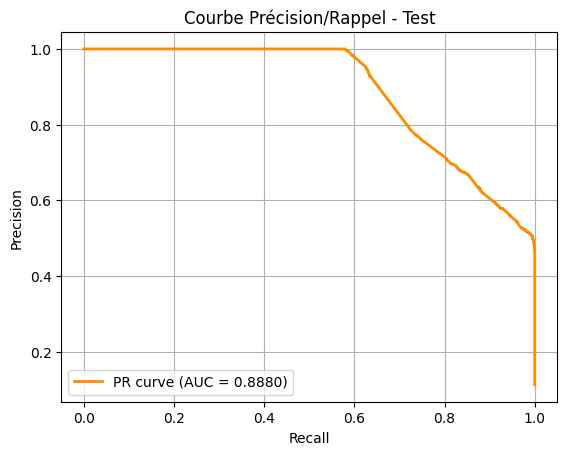

In [555]:
precision2, recall2, thresholds2 = precision_recall_curve(y_test, y_proba_rf)
pr_auc2 = auc(recall2, precision2)

plt.figure()
plt.plot(recall2, precision2, color='darkorange', lw=2, label=f'PR curve (AUC = {pr_auc2:.4f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Courbe Précision/Rappel - Test')
plt.legend(loc='best')
plt.grid()
plt.show()

In [556]:
importance_variable_rf2 = pd.DataFrame()
importance_variable_rf2["Variable"]= X_train_final2.columns
importance_variable_rf2["Feature Importance"] = rf_clf2.feature_importances_

importance_variable_rf2.sort_values(by = "Feature Importance", axis=0, ascending=False, inplace=True)

print("Les 5 variables les plus importantes : \n")
importance_variable_rf2.head()

Les 5 variables les plus importantes : 



,Variable,Feature Importance
0,TAUX_RESIL_PONDERE_TOTAL,0.47
1,NBCTRES,0.23
2,CLIACTIF_OUI,0.21
3,NBCTACT,0.05
4,MH,0.04


In [557]:
explainer2 = shap.TreeExplainer(rf_clf2)
shap_values2 = explainer2.shap_values(X_test_final2)
print(shap_values2.shape)

(18014, 5, 2)


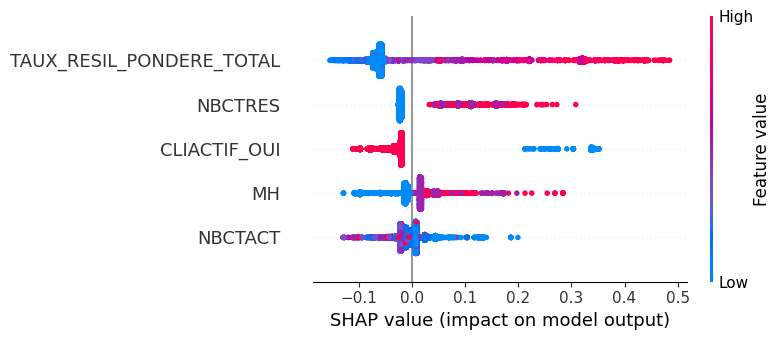

In [558]:
shap.summary_plot(shap_values2[:, :, 1], X_test_final2)

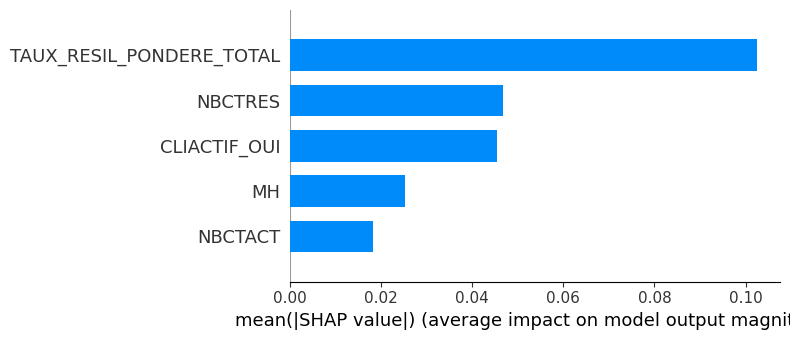

In [559]:
shap.summary_plot(shap_values2[:, :, 1], X_test_final2, plot_type="bar")

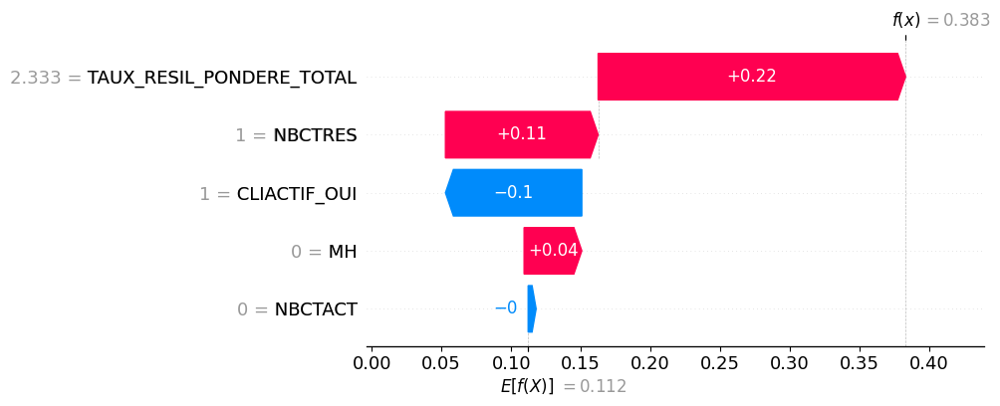

In [560]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values2[4, :, 1],
        base_values=explainer2.expected_value[1],
        data=X_test_final2.iloc[4],
        feature_names=X_test_final2.columns
    )
)

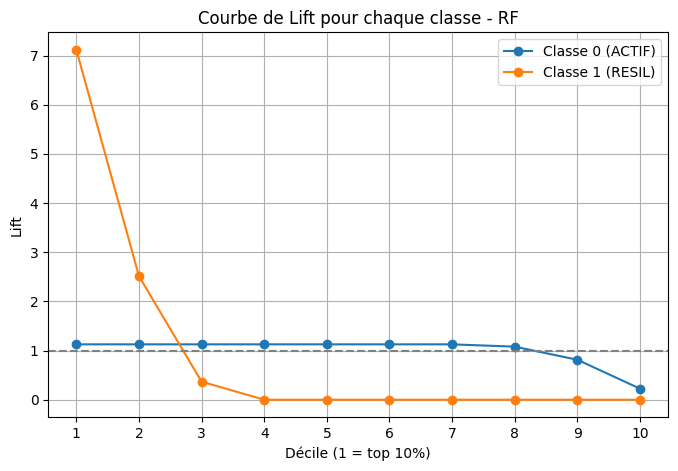

In [561]:
# Créer un DataFrame avec les probabilités pour chaque classe
lift_rf2 = pd.DataFrame({
    "y_true": y_test,
    "proba_0": rf_clf2.predict_proba(X_test_final2)[:, 0],
    "proba_1": rf_clf2.predict_proba(X_test_final2)[:, 1],
})

# Calcul du lift pour chaque classe
lift_0_2 = compute_lift_curve(lift_rf2, "proba_0", target_class=0)
lift_1_2 = compute_lift_curve(lift_rf2, "proba_1", target_class=1)

# Tracer
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), lift_0_2["lift"], label="Classe 0 (ACTIF)", marker='o')
plt.plot(range(1, 11), lift_1_2["lift"], label="Classe 1 (RESIL)", marker='o')
plt.axhline(1, color='gray', linestyle='--')
plt.title("Courbe de Lift pour chaque classe - RF")
plt.xlabel("Décile (1 = top 10%)")
plt.ylabel("Lift")
plt.xticks(range(1, 11))
plt.grid(True)
plt.legend()
plt.show()

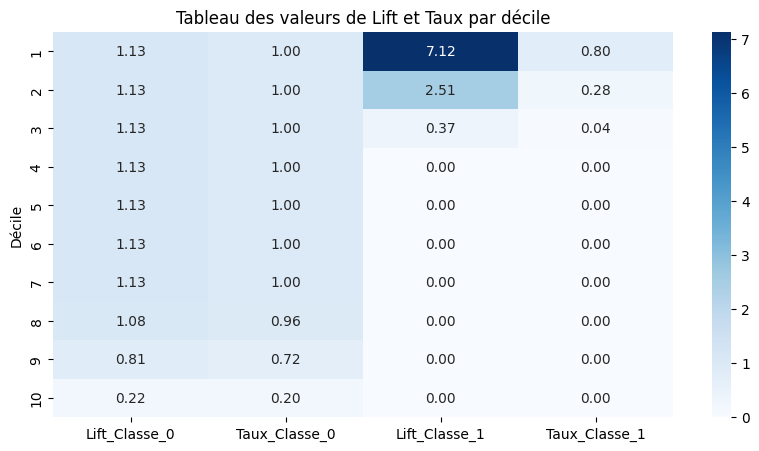

In [562]:
# Renommer les colonnes pour plus de clarté
lift_0_2 = lift_0_2.rename(columns={"lift": "Lift_Classe_0", "taux": "Taux_Classe_0"})
lift_1_2 = lift_1_2.rename(columns={"lift": "Lift_Classe_1", "taux": "Taux_Classe_1"})

# Fusionner les deux tables sur la colonne 'quantile'
lift_table_final = pd.merge(lift_0_2[["quantile", "Lift_Classe_0", "Taux_Classe_0"]],
                            lift_1_2[["quantile", "Lift_Classe_1", "Taux_Classe_1"]],
                            on="quantile")

# Décile = quantile + 1 (pour afficher de 1 à 10 au lieu de 0 à 9)
lift_table_final["Décile"] = lift_table_final["quantile"] + 1

# Réorganiser les colonnes
lift_table_final = lift_table_final[["Décile", "Lift_Classe_0", "Taux_Classe_0", "Lift_Classe_1", "Taux_Classe_1"]]

# Afficher sous forme de tableau
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.heatmap(lift_table_final.set_index("Décile"), annot=True, fmt=".2f", cmap="Blues")
plt.title("Tableau des valeurs de Lift et Taux par décile")
plt.show()

## Modèle 3: Boosting

Rapport de classification :

              precision    recall  f1-score   support

           0     0.9969    0.9911    0.9940     15996
           1     0.9327    0.9757    0.9537      2018

    accuracy                         0.9894     18014
   macro avg     0.9648    0.9834    0.9739     18014
weighted avg     0.9897    0.9894    0.9895     18014


 AUC (ROC) : 0.9989

 Matrice de confusion :
 [[15854   142]
 [   49  1969]]


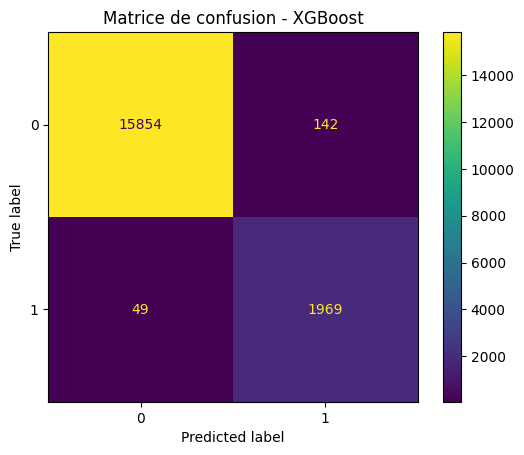

In [563]:
# Entraînement du modèle XGBoost
model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
model.fit(X_train_final, y_train)

# Prédictions
y_pred = model.predict(X_test_final)
y_proba = model.predict_proba(X_test_final)[:, 1]  # Probabilités pour la classe positive

# Évaluation des performances
print("Rapport de classification :\n")
print(classification_report(y_test, y_pred, digits=4))

roc_auc = roc_auc_score(y_test, y_proba)
print(f"\n AUC (ROC) : {roc_auc:.4f}")

# Matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print("\n Matrice de confusion :\n", cm)

# Affichage graphique de la matrice
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='viridis')
plt.title("Matrice de confusion - XGBoost")
plt.show()

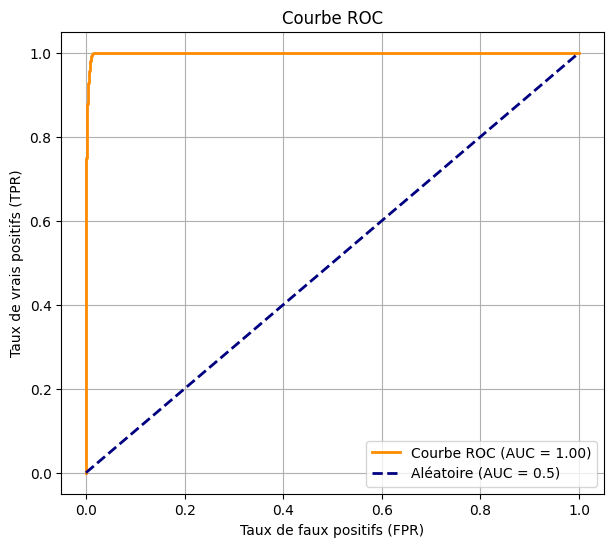

In [564]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Calcul des courbes ROC
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

# Tracé de la courbe ROC
plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"Courbe ROC (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label="Aléatoire (AUC = 0.5)")
plt.xlabel("Taux de faux positifs (FPR)")
plt.ylabel("Taux de vrais positifs (TPR)")
plt.title("Courbe ROC")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


La courbe ROC (Receiver Operating Characteristic) permet d’évaluer la capacité de classement du modèle entre les deux classes : clients actifs (0) et clients résiliés (1). La courbe obtenue est très proche de l’axe supérieur gauche du graphique, ce qui traduit une très bonne performance de classification.

L’aire sous la courbe (AUC) est de 1.00, ce qui signifie que le modèle est quasiment parfait dans sa capacité à distinguer les deux classes. En comparaison, une prédiction aléatoire aurait conduit à une courbe diagonale avec une AUC de 0.5.

Cette performance indique que le modèle attribue correctement des probabilités plus élevées aux clients résiliés qu’aux clients actifs, ce qui est essentiel dans un contexte de détection de churn ou d’attrition.

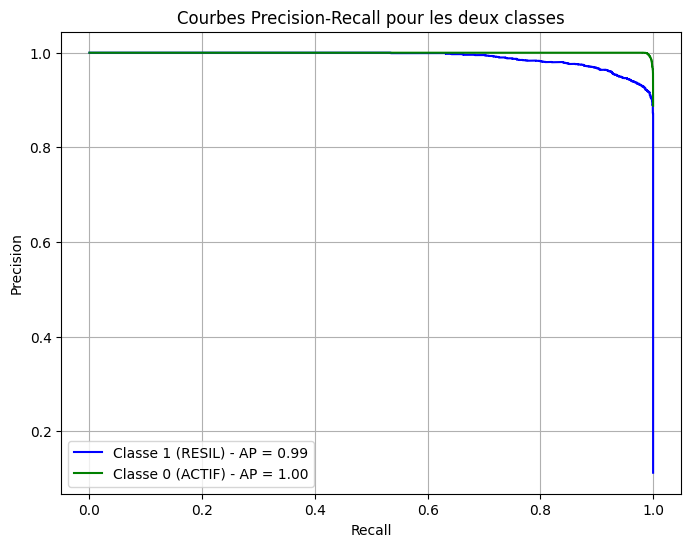

In [565]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

# Probabilités pour les deux classes
y_scores_1 = model.predict_proba(X_test_final)[:, 1]  # Classe 1 (RESIL)
y_scores_0 = model.predict_proba(X_test_final)[:, 0]  # Classe 0 (ACTIF)

# Courbe pour classe 1 (RESIL)
precision_1, recall_1, _ = precision_recall_curve(y_test, y_scores_1, pos_label=1)
avg_precision_1 = average_precision_score(y_test, y_scores_1, pos_label=1)

# Courbe pour classe 0 (ACTIF)
precision_0, recall_0, _ = precision_recall_curve(1 - y_test, y_scores_0, pos_label=1)
avg_precision_0 = average_precision_score(1 - y_test, y_scores_0, pos_label=1)

# Tracé
plt.figure(figsize=(8, 6))
plt.plot(recall_1, precision_1, label=f"Classe 1 (RESIL) - AP = {avg_precision_1:.2f}", color='blue')
plt.plot(recall_0, precision_0, label=f"Classe 0 (ACTIF) - AP = {avg_precision_0:.2f}", color='green')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Courbes Precision-Recall pour les deux classes")
plt.legend()
plt.grid(True)
plt.show()

In [566]:
import shap

# Créer l'explainer SHAP
explainer = shap.Explainer(model)

# Calculer les valeurs SHAP sur l'ensemble de test
shap_values = explainer(X_test_final)

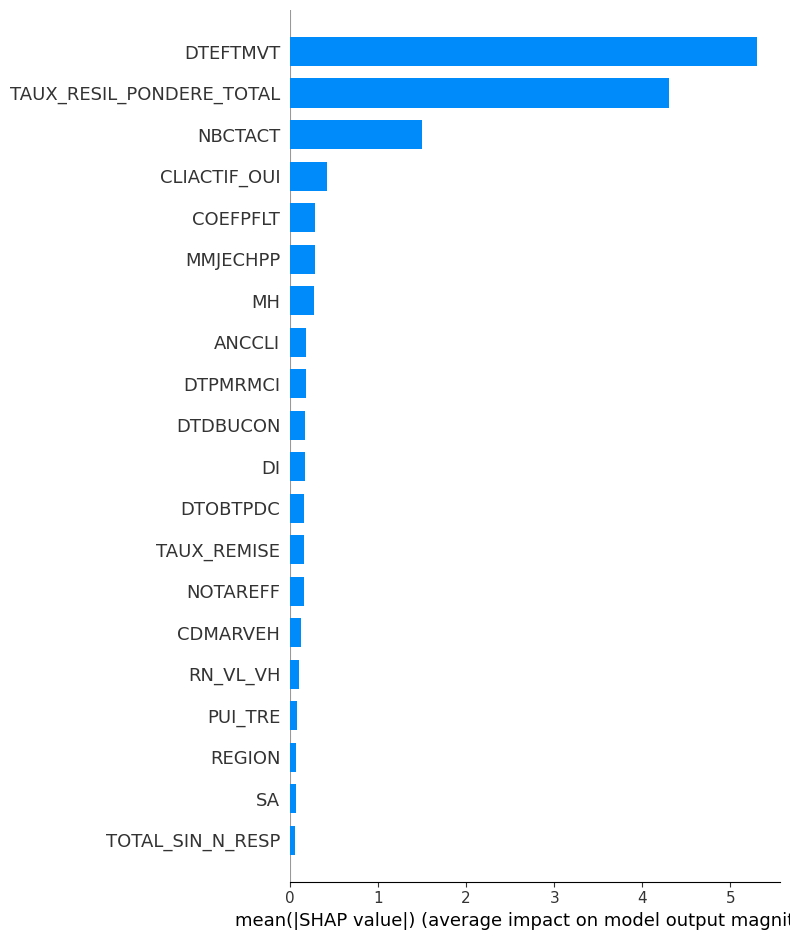

In [567]:
shap.summary_plot(shap_values, X_test_final, plot_type="bar")

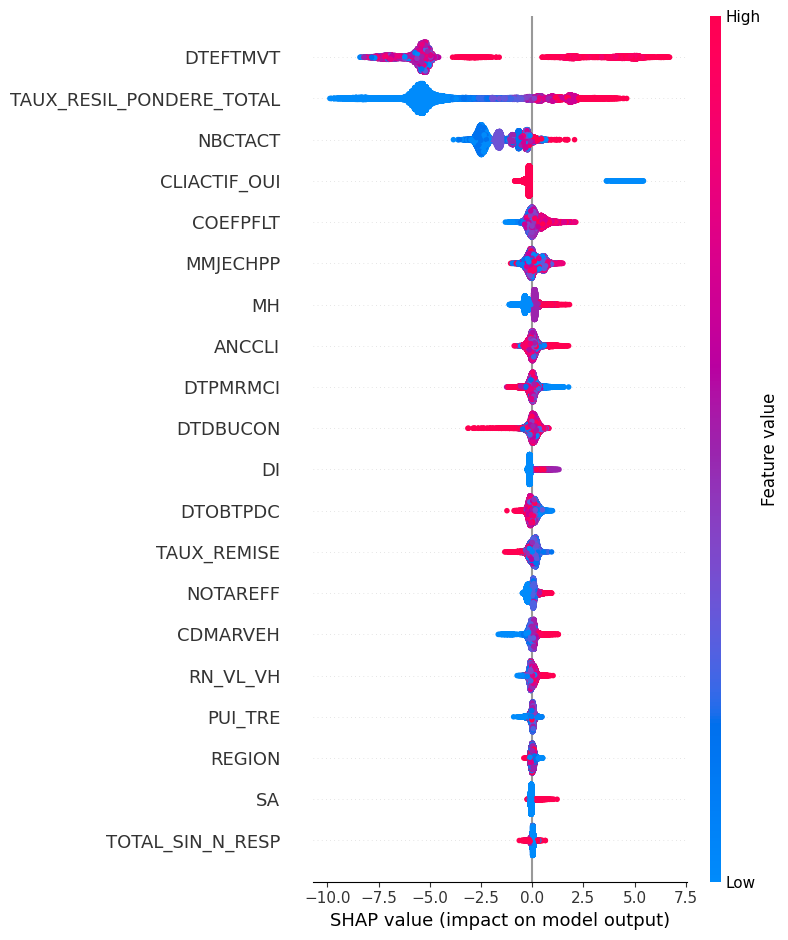

In [568]:
shap.summary_plot(shap_values, X_test_final)

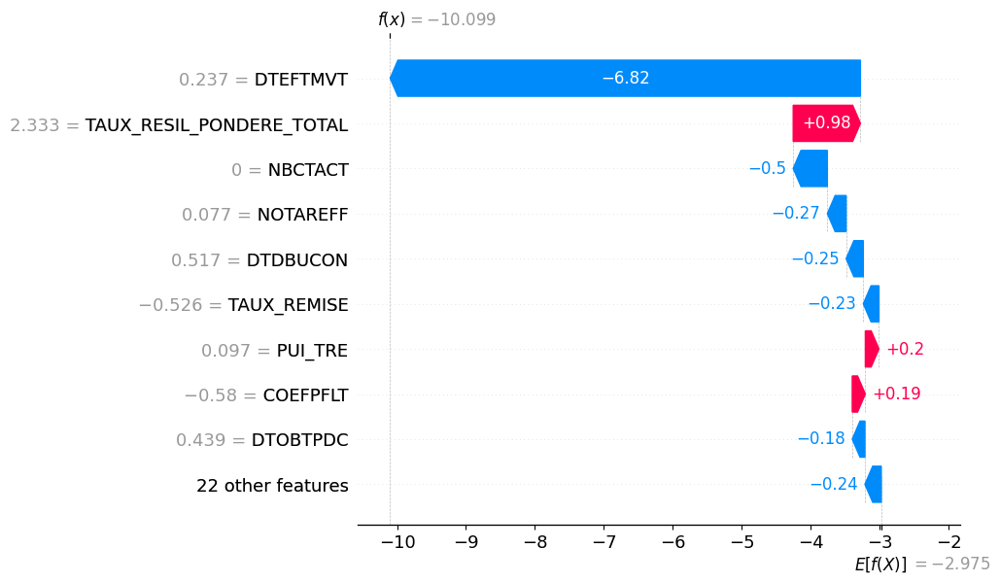

In [569]:
shap_expl = shap.Explanation(
    values=shap_values.values[4],
    base_values=shap_values.base_values[4],
    data=shap_values.data[4],
    feature_names=shap_values.feature_names
)

shap.plots.waterfall(shap_expl)


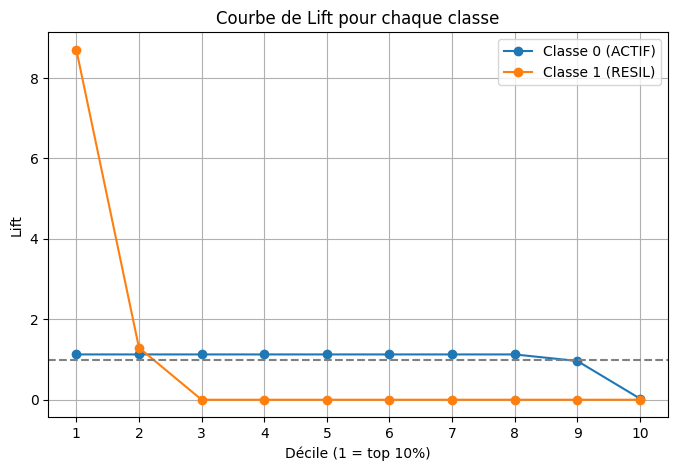

In [570]:
# Créer un DataFrame avec les probabilités pour chaque classe
lift_df = pd.DataFrame({
    "y_true": y_test,
    "proba_0": model.predict_proba(X_test_final)[:, 0],  # proba pour la classe 0 (ACTIF)
    "proba_1": model.predict_proba(X_test_final)[:, 1],  # proba pour la classe 1 (RESIL)
})

# Calcul du lift pour chaque classe
lift_0 = compute_lift_curve(lift_df, "proba_0", target_class=0)
lift_1 = compute_lift_curve(lift_df, "proba_1", target_class=1)

# Tracer
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), lift_0["lift"], label="Classe 0 (ACTIF)", marker='o')
plt.plot(range(1, 11), lift_1["lift"], label="Classe 1 (RESIL)", marker='o')
plt.axhline(1, color='gray', linestyle='--')
plt.title("Courbe de Lift pour chaque classe")
plt.xlabel("Décile (1 = top 10%)")
plt.ylabel("Lift")
plt.xticks(range(1, 11))
plt.grid(True)
plt.legend()
plt.show()

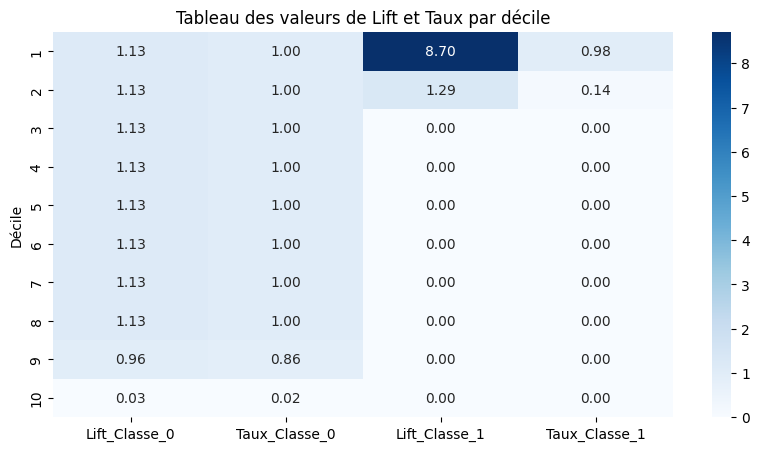

In [571]:
# Renommer les colonnes pour plus de clarté
lift_0 = lift_0.rename(columns={"lift": "Lift_Classe_0", "taux": "Taux_Classe_0"})
lift_1 = lift_1.rename(columns={"lift": "Lift_Classe_1", "taux": "Taux_Classe_1"})

# Fusionner les deux tables sur la colonne 'quantile'
lift_table_final = pd.merge(lift_0[["quantile", "Lift_Classe_0", "Taux_Classe_0"]],
                            lift_1[["quantile", "Lift_Classe_1", "Taux_Classe_1"]],
                            on="quantile")

# Décile = quantile + 1 (pour afficher de 1 à 10 au lieu de 0 à 9)
lift_table_final["Décile"] = lift_table_final["quantile"] + 1

# Réorganiser les colonnes
lift_table_final = lift_table_final[["Décile", "Lift_Classe_0", "Taux_Classe_0", "Lift_Classe_1", "Taux_Classe_1"]]

# Afficher sous forme de tableau
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.heatmap(lift_table_final.set_index("Décile"), annot=True, fmt=".2f", cmap="Blues")
plt.title("Tableau des valeurs de Lift et Taux par décile")
plt.show()

# XGBOOST sans la variable date

In [572]:
features_to_keep = [
  'DTDBUCON', 'MMJECHPP', 'DTOBTPDC', 'DTPMRMCI', 'NIVBM', 'ANCCLI', 'DI', 'IV', 'MH', 'SA', 'COEFCOMM', 'COEFPFLT', 'INDICE_RESPONSABILITE', 'TOTAL_SIN_RESP', 'TOTAL_SIN_N_RESP', 'TAUX_REMISE', 'CDMCE_T', 'CD_SEX_M', 'CD_FML', 'CDMARVEH', 'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION','TAUX_RESIL_PONDERE_TOTAL'
]

In [573]:
print("Colonnes disponibles :", X_train_final.columns.tolist())
print("Colonnes à garder :", features_to_keep)

Colonnes disponibles : ['DTDBUCON', 'DTEFTMVT', 'MMJECHPP', 'DTOBTPDC', 'DTPMRMCI', 'NIVBM', 'ANCCLI', 'DI', 'IV', 'MH', 'SA', 'NBCTACT', 'NBCTRES', 'COEFCOMM', 'COEFPFLT', 'INDICE_RESPONSABILITE', 'TOTAL_SIN_RESP', 'TOTAL_SIN_N_RESP', 'TAUX_REMISE', 'TAUX_RESIL_PONDERE_TOTAL', 'CDMCE_T', 'CD_SEX_M', 'CLIACTIF_OUI', 'CD_FML', 'CDMARVEH', 'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION']
Colonnes à garder : ['DTDBUCON', 'MMJECHPP', 'DTOBTPDC', 'DTPMRMCI', 'NIVBM', 'ANCCLI', 'DI', 'IV', 'MH', 'SA', 'COEFCOMM', 'COEFPFLT', 'INDICE_RESPONSABILITE', 'TOTAL_SIN_RESP', 'TOTAL_SIN_N_RESP', 'TAUX_REMISE', 'CDMCE_T', 'CD_SEX_M', 'CD_FML', 'CDMARVEH', 'NOTAREFF', 'PUI_TRE', 'RN_VL_VH', 'CDUSGAUT', 'CDSITFAM', 'REGION', 'TAUX_RESIL_PONDERE_TOTAL']


In [574]:
# Supposons que features_to_keep est déjà obtenu via l'analyse SHAP
X_train_reduced = X_train_final[features_to_keep]
X_test_reduced = X_test_final[features_to_keep]

Rapport de classification :

              precision    recall  f1-score   support

           0     0.9722    0.9766    0.9744     15996
           1     0.8077    0.7785    0.7928      2018

    accuracy                         0.9544     18014
   macro avg     0.8899    0.8776    0.8836     18014
weighted avg     0.9538    0.9544    0.9541     18014


 AUC (ROC) : 0.9842

 Matrice de confusion :
 [[15622   374]
 [  447  1571]]


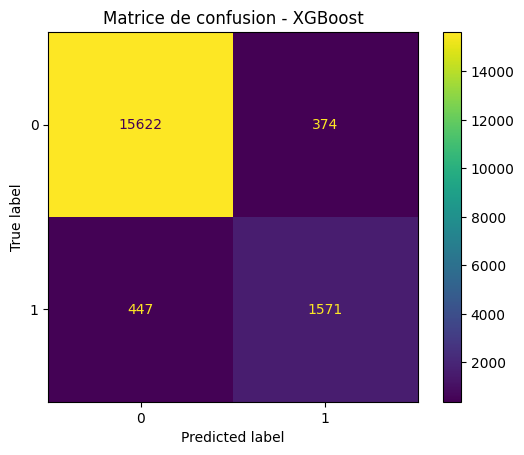

In [575]:
# Entraînement du modèle XGBoost
model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
model.fit(X_train_reduced, y_train)

# Prédictions
y_pred = model.predict(X_test_reduced)
y_proba = model.predict_proba(X_test_reduced)[:, 1]  # Probabilités pour la classe positive

# Évaluation des performances
print("Rapport de classification :\n")
print(classification_report(y_test, y_pred, digits=4))

roc_auc = roc_auc_score(y_test, y_proba)
print(f"\n AUC (ROC) : {roc_auc:.4f}")

# Matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print("\n Matrice de confusion :\n", cm)

# Affichage graphique de la matrice
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='viridis')
plt.title("Matrice de confusion - XGBoost")
plt.show()

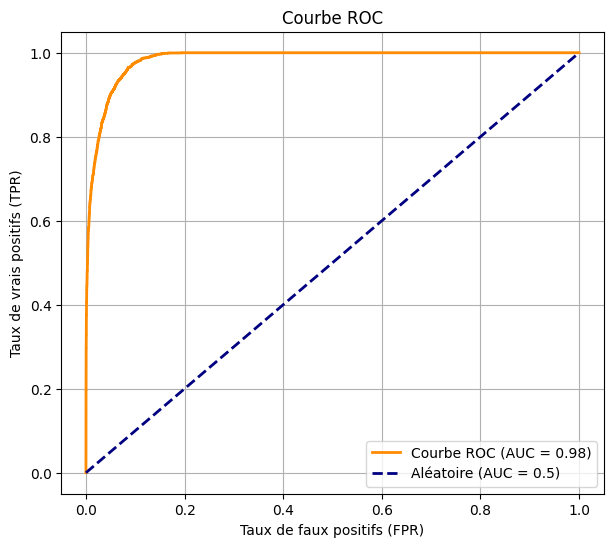

In [576]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Calcul des courbes ROC
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

# Tracé de la courbe ROC
plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"Courbe ROC (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label="Aléatoire (AUC = 0.5)")
plt.xlabel("Taux de faux positifs (FPR)")
plt.ylabel("Taux de vrais positifs (TPR)")
plt.title("Courbe ROC")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


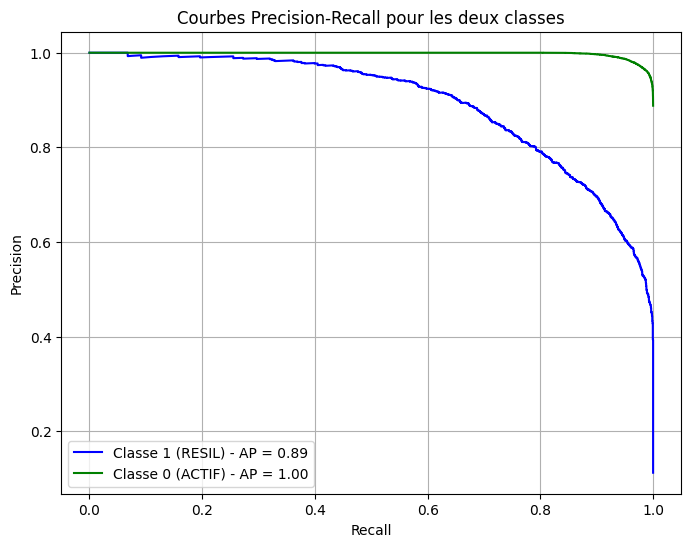

In [577]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

# Probabilités pour les deux classes
y_scores_1 = model.predict_proba(X_test_reduced)[:, 1]  # Classe 1 (RESIL)
y_scores_0 = model.predict_proba(X_test_reduced)[:, 0]  # Classe 0 (ACTIF)

# Courbe pour classe 1 (RESIL)
precision_1, recall_1, _ = precision_recall_curve(y_test, y_scores_1, pos_label=1)
avg_precision_1 = average_precision_score(y_test, y_scores_1, pos_label=1)

# Courbe pour classe 0 (ACTIF)
precision_0, recall_0, _ = precision_recall_curve(1 - y_test, y_scores_0, pos_label=1)
avg_precision_0 = average_precision_score(1 - y_test, y_scores_0, pos_label=1)

# Tracé
plt.figure(figsize=(8, 6))
plt.plot(recall_1, precision_1, label=f"Classe 1 (RESIL) - AP = {avg_precision_1:.2f}", color='blue')
plt.plot(recall_0, precision_0, label=f"Classe 0 (ACTIF) - AP = {avg_precision_0:.2f}", color='green')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Courbes Precision-Recall pour les deux classes")
plt.legend()
plt.grid(True)
plt.show()

In [578]:
# Créer l'explainer SHAP
explainer = shap.Explainer(model)

# Calculer les valeurs SHAP sur l'ensemble de test
shap_values = explainer(X_test_reduced)

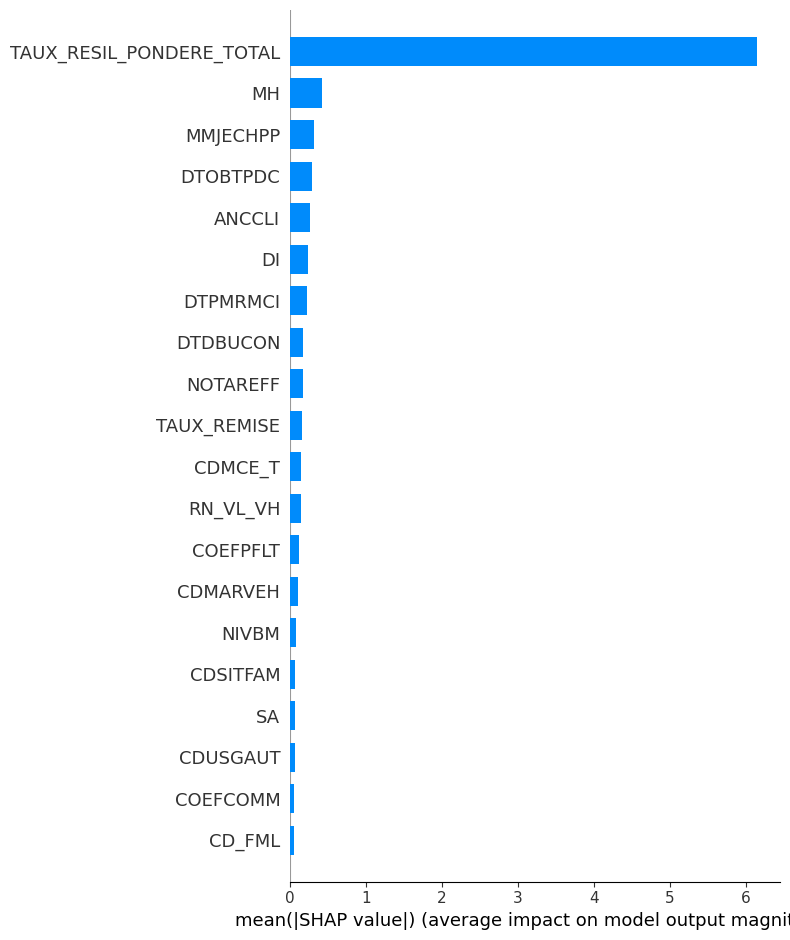

In [579]:
shap.summary_plot(shap_values, X_test_reduced, plot_type="bar")

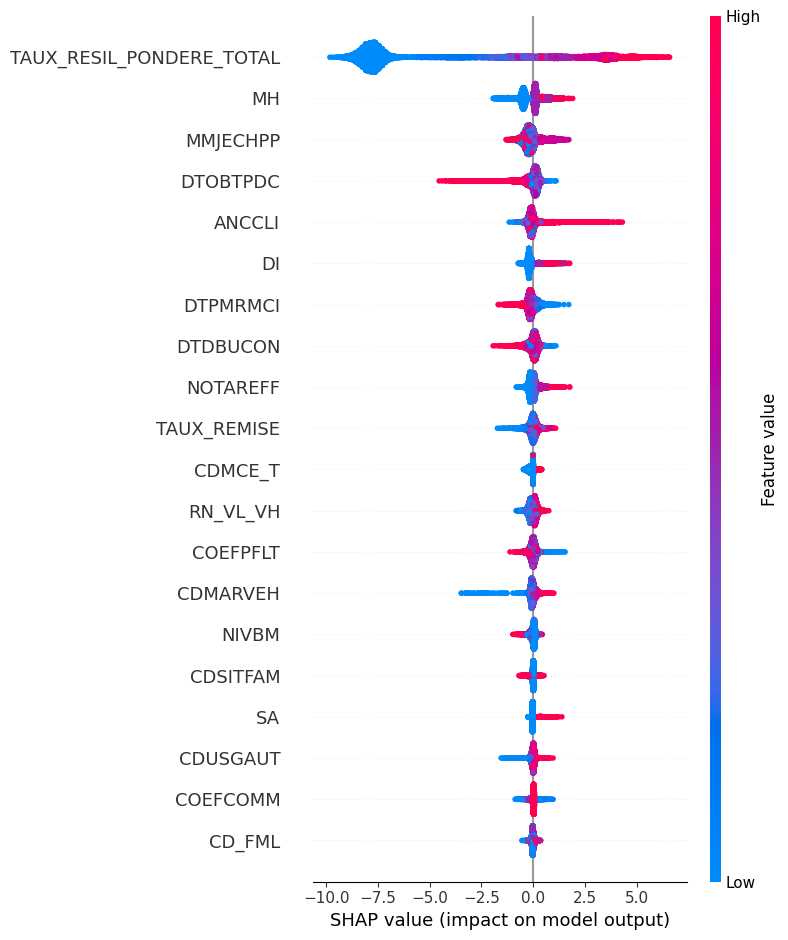

In [580]:
shap.summary_plot(shap_values, X_test_reduced)

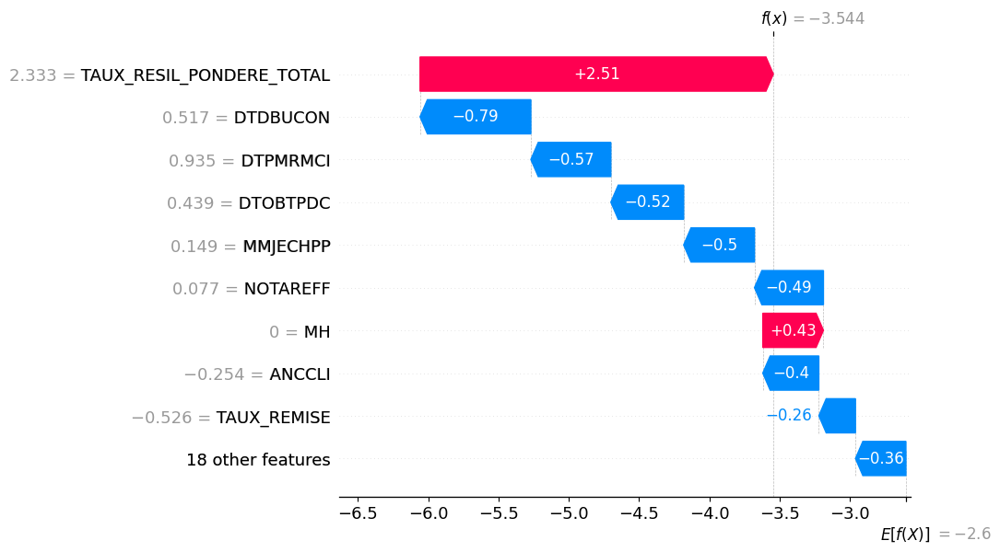

In [581]:
shap_expl = shap.Explanation(
    values=shap_values.values[4],
    base_values=shap_values.base_values[4],
    data=shap_values.data[4],
    feature_names=shap_values.feature_names
)

shap.plots.waterfall(shap_expl)


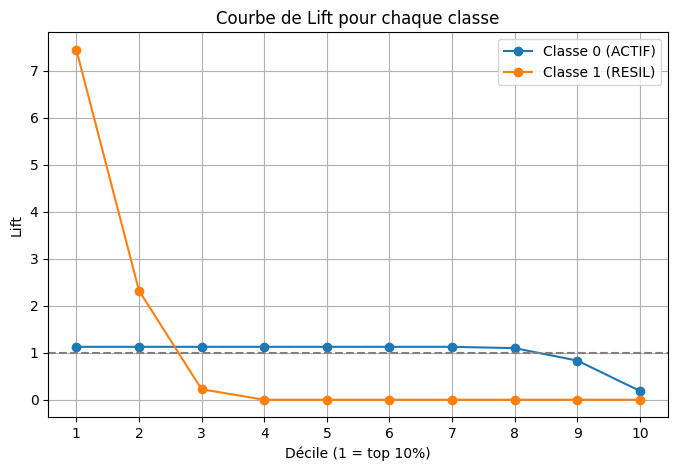

In [582]:
# Créer un DataFrame avec les probabilités pour chaque classe
lift_df = pd.DataFrame({
    "y_true": y_test,
    "proba_0": model.predict_proba(X_test_reduced)[:, 0],  # proba pour la classe 0 (ACTIF)
    "proba_1": model.predict_proba(X_test_reduced)[:, 1],  # proba pour la classe 1 (RESIL)
})

# Calcul du lift pour chaque classe
lift_0 = compute_lift_curve(lift_df, "proba_0", target_class=0)
lift_1 = compute_lift_curve(lift_df, "proba_1", target_class=1)

# Tracer
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), lift_0["lift"], label="Classe 0 (ACTIF)", marker='o')
plt.plot(range(1, 11), lift_1["lift"], label="Classe 1 (RESIL)", marker='o')
plt.axhline(1, color='gray', linestyle='--')
plt.title("Courbe de Lift pour chaque classe")
plt.xlabel("Décile (1 = top 10%)")
plt.ylabel("Lift")
plt.xticks(range(1, 11))
plt.grid(True)
plt.legend()
plt.show()

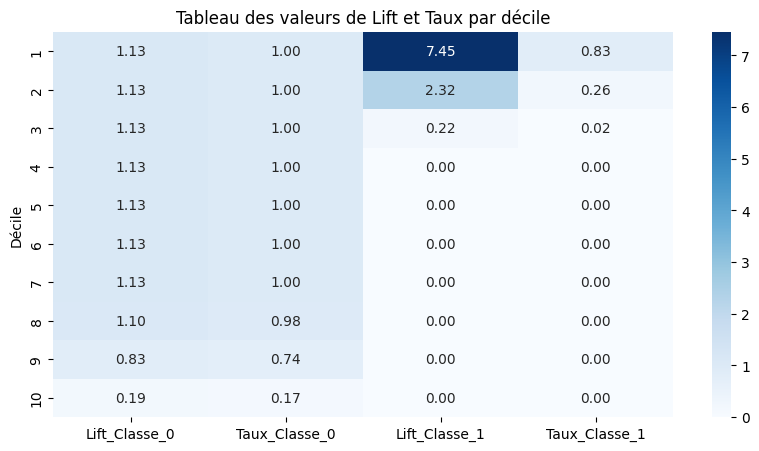

In [583]:
# Renommer les colonnes pour plus de clarté
lift_0 = lift_0.rename(columns={"lift": "Lift_Classe_0", "taux": "Taux_Classe_0"})
lift_1 = lift_1.rename(columns={"lift": "Lift_Classe_1", "taux": "Taux_Classe_1"})

# Fusionner les deux tables sur la colonne 'quantile'
lift_table_final = pd.merge(lift_0[["quantile", "Lift_Classe_0", "Taux_Classe_0"]],
                            lift_1[["quantile", "Lift_Classe_1", "Taux_Classe_1"]],
                            on="quantile")

# Décile = quantile + 1 (pour afficher de 1 à 10 au lieu de 0 à 9)
lift_table_final["Décile"] = lift_table_final["quantile"] + 1

# Réorganiser les colonnes
lift_table_final = lift_table_final[["Décile", "Lift_Classe_0", "Taux_Classe_0", "Lift_Classe_1", "Taux_Classe_1"]]

# Afficher sous forme de tableau
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.heatmap(lift_table_final.set_index("Décile"), annot=True, fmt=".2f", cmap="Blues")
plt.title("Tableau des valeurs de Lift et Taux par décile")
plt.show()


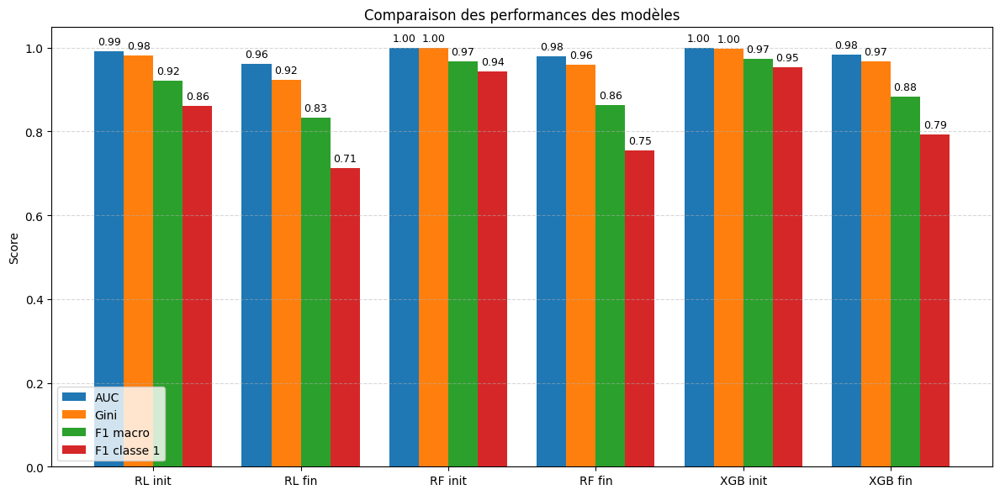

In [584]:
# Données fournies
data = {
    'Modèle': [
        'RL init',
        'RL fin',
        'RF init',
        'RF fin',
        'XGB init',
        'XGB fin'
    ],
    'AUC': [0.991, 0.962, 1, 0.98, 0.999, 0.984],
    'Gini': [0.982, 0.924, 1, 0.96, 0.998, 0.968],
    'F1-score macro': [0.922, 0.834, 0.968, 0.864, 0.974, 0.884],
    'F1-score classe 1': [0.861, 0.712, 0.944, 0.754, 0.954, 0.793]
}

# Création d’un DataFrame
df = pd.DataFrame(data)

# Positionnement des barres
bar_width = 0.2
x = np.arange(len(df['Modèle']))

# Création du graphique
plt.figure(figsize=(12, 6))
bars_auc = plt.bar(x - 1.5*bar_width, df['AUC'], width=bar_width, label='AUC')
bars_gini = plt.bar(x - 0.5*bar_width, df['Gini'], width=bar_width, label='Gini')
bars_f1_macro = plt.bar(x + 0.5*bar_width, df['F1-score macro'], width=bar_width, label='F1 macro')
bars_f1_class1 = plt.bar(x + 1.5*bar_width, df['F1-score classe 1'], width=bar_width, label='F1 classe 1')

# Affichage des valeurs sur chaque barre
for bars in [bars_auc, bars_gini, bars_f1_macro, bars_f1_class1]:
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f'{height:.2f}',
                 ha='center', va='bottom', fontsize=9)

# Paramètres du graphique
plt.xticks(x, df['Modèle'])
plt.ylabel('Score')
plt.title('Comparaison des performances des modèles')
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.ylim(0, 1.05)

plt.show()

Ce graphique compare les performances de six modèles (deux par famille : Régression Logistique, Random Forest, XGBoost), chacun évalué dans une version initiale (toutes les variables) et finale (après sélection de variables). Les métriques utilisées sont l’AUC, le coefficient de Gini, le F1-score macro et le F1-score pour la classe minoritaire (classe 1).

- On observe tout d’abord que les modèles initiaux Random Forest et XGBoost atteignent des scores parfaits en AUC et Gini (1.00), suggérant une prédiction quasi parfaite, mais possiblement au prix d’un surapprentissage. En revanche, leurs versions finales voient une légère baisse de performance, mais restent très compétitives, avec une AUC de 0.98 pour RF fin et 0.98 pour XGB fin.

- Concernant la Régression Logistique, on note une chute significative de performance entre RL init et RL fin, en particulier pour le F1-score de la classe 1 (de 0.86 à 0.71), ce qui indique une perte de capacité à bien prédire la classe minoritaire après la réduction du nombre de variables.

- Les modèles de type bagging (RF) et boosting (XGB) restent les plus performants globalement, notamment en termes de F1-score classe 1 (jusqu’à 0.95 pour XGB init), même après simplification du modèle. Cela suggère une meilleure capacité à capturer les relations complexes entre les variables et à maintenir un bon équilibre entre précision et rappel.

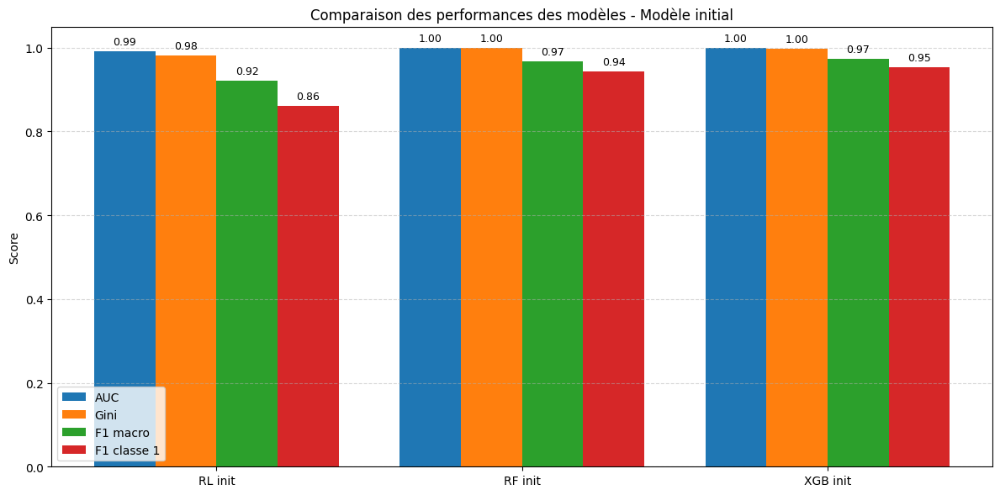

In [585]:
# Données fournies
data = {
    'Modèle': [
        'RL init',
        'RF init',
        'XGB init'
    ],
    'AUC': [0.991, 1, 0.999],
    'Gini': [0.982, 1, 0.998],
    'F1-score macro': [0.922, 0.968, 0.974],
    'F1-score classe 1': [0.861, 0.944, 0.954]
}

# Création d’un DataFrame
df = pd.DataFrame(data)

# Positionnement des barres
bar_width = 0.2
x = np.arange(len(df['Modèle']))

# Création du graphique
plt.figure(figsize=(12, 6))
bars_auc = plt.bar(x - 1.5*bar_width, df['AUC'], width=bar_width, label='AUC')
bars_gini = plt.bar(x - 0.5*bar_width, df['Gini'], width=bar_width, label='Gini')
bars_f1_macro = plt.bar(x + 0.5*bar_width, df['F1-score macro'], width=bar_width, label='F1 macro')
bars_f1_class1 = plt.bar(x + 1.5*bar_width, df['F1-score classe 1'], width=bar_width, label='F1 classe 1')

# Affichage des valeurs sur chaque barre
for bars in [bars_auc, bars_gini, bars_f1_macro, bars_f1_class1]:
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f'{height:.2f}',
                 ha='center', va='bottom', fontsize=9)

# Paramètres du graphique
plt.xticks(x, df['Modèle'])
plt.ylabel('Score')
plt.title('Comparaison des performances des modèles - Modèle initial')
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.ylim(0, 1.05)

plt.show()

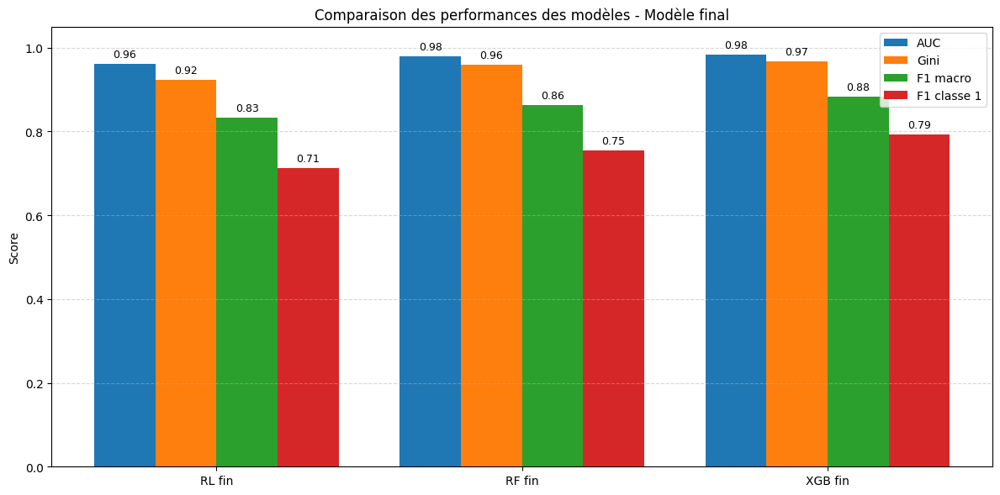

In [586]:
# Données fournies
data = {
    'Modèle': [
        'RL fin',
        'RF fin',
        'XGB fin'
    ],
    'AUC': [0.962, 0.98, 0.984],
    'Gini': [0.924, 0.96, 0.968],
    'F1-score macro': [0.834, 0.864, 0.884],
    'F1-score classe 1': [0.712, 0.754, 0.793]
}

# Création d’un DataFrame
df = pd.DataFrame(data)

# Positionnement des barres
bar_width = 0.2
x = np.arange(len(df['Modèle']))

# Création du graphique
plt.figure(figsize=(12, 6))
bars_auc = plt.bar(x - 1.5*bar_width, df['AUC'], width=bar_width, label='AUC')
bars_gini = plt.bar(x - 0.5*bar_width, df['Gini'], width=bar_width, label='Gini')
bars_f1_macro = plt.bar(x + 0.5*bar_width, df['F1-score macro'], width=bar_width, label='F1 macro')
bars_f1_class1 = plt.bar(x + 1.5*bar_width, df['F1-score classe 1'], width=bar_width, label='F1 classe 1')

# Affichage des valeurs sur chaque barre
for bars in [bars_auc, bars_gini, bars_f1_macro, bars_f1_class1]:
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f'{height:.2f}',
                 ha='center', va='bottom', fontsize=9)

# Paramètres du graphique
plt.xticks(x, df['Modèle'])
plt.ylabel('Score')
plt.title('Comparaison des performances des modèles - Modèle final')
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.ylim(0, 1.05)

plt.show()

---